In [20]:
from __future__ import annotations
import numpy as np
import pandas as pd
from pathlib import Path
#from sklearn.cross_decomposition import CCA
from mvlearn.embed import CCA
from scipy.stats import pearsonr 
from scipy import stats


###############################################################################
# Paths & constants
###############################################################################
PUPIL_ROOT = Path(r"C:\Users\cdd\Documents\Uni\Special_course\pupil_slow")
EEG_ROOT   = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\eeg_slow")

FRONTAL_MIDLINE = ['AFz','AF3','AF4','Fz','F1','F2','F3','F4','FC3','FC1','FC2','FC4','Cz','C3','C1','C2','C4']

OUT_TRIALS  = Path("trial_level_cca_fixedlag.csv")
OUT_SUBJECT = Path("subject_best_lag.csv")

SUBJECTS = np.setdiff1d(np.arange(32, 63), [32, 37, 53, 61, 66, 78, 84, 90, 94, 96])
#SUBJECTS = np.setdiff1d(np.arange(32, 99), [32, 37, 53, 61, 66, 78, 84, 90, 94, 96])
SHIFTS = np.arange(-100, 101)      # ±1 s at 100 Hz → samples
WIN_OFFSET1 = 200                  # discard first 200 ms
WIN_OFFSET2 = 110                  # discard last 110 ms

###############################################################################
# Helper functions
###############################################################################

def normalise_eeg(x: np.ndarray) -> np.ndarray:
    """Centre each channel and scale so Σ x² = 1 over time×channels."""
    x = x - x.mean(axis=0, keepdims=True)
    scale = np.sqrt(np.mean(x**2))
    return x / scale


def cca_corr(eeg: np.ndarray, pupil: np.ndarray) -> float:
    """Canonical correlation (single component)."""
    cca = CCA(n_components=1, max_iter=1000, scale=False, tol=1e-6)
    cca.fit(eeg, pupil)
    u, v = cca.transform(eeg, pupil)
    return float(np.corrcoef(u[:, 0], v[:, 0])[0, 1])


In [5]:
import logging, sys
from pathlib import Path
from datetime import datetime

def start_logger(log_dir="logs", filename=None):
    Path(log_dir).mkdir(parents=True, exist_ok=True)
    if filename is None:
        filename = f"run_{datetime.now().strftime('%Y%m%d_%H%M%S')}.log"

    logger = logging.getLogger("run")
    logger.setLevel(logging.INFO)
    logger.handlers.clear()

    fh = logging.FileHandler(Path(log_dir, filename), encoding="utf-8")
    ch = logging.StreamHandler(sys.stdout)

    fmt = logging.Formatter("%(message)s")
    fh.setFormatter(fmt)
    ch.setFormatter(fmt)

    logger.addHandler(fh)
    logger.addHandler(ch)
    logger.info(f"[log] Writing prints to: {Path(log_dir, filename)}")
    return logger

fmt="%Y%m%d_%H%M%S"
ts = datetime.now().strftime(fmt)

logger = start_logger(log_dir="logs", filename=f"sparsecca_cv_{ts}.log")

# use:
# logger.info("your message")

[log] Writing prints to: logs\sparsecca_cv_20250929_152707.log


In [6]:
# use:
logger.info("your message")

your message


In [ ]:
def load_all_trials(
        sub: int,
        eeg_root: Path = EEG_ROOT,
        pupil_root: Path = PUPIL_ROOT,
        min_len: int = 40,
        max_len_diff: int = 30,
) -> list[tuple[np.ndarray, np.ndarray, dict]]:
    """
    Load *all* valid EEG-pupil trial pairs for one subject.

    Parameters
    ----------
    sub : int
        Numeric subject ID (e.g. 42).
    eeg_root, pupil_root : Path
        Roots of the pre-processed EEG and pupil folders.
    min_len : int
        Minimum number of samples a pupil trace must have to be accepted.
    max_len_diff : int
        Reject trial if |len(pupil)-len(eeg)| exceeds this.
    Returns
    -------
    trials : list of (eeg, pupil_z, meta)
        * eeg        - (T × n_channels) float64, already centred/scaled
        * pupil_z    - (T × 1) float64, per-trial z-scored
        * meta       - dict with subject/condition/load/epoch
    """
    trials = []
    sub_tag = f"sub-{sub:03d}"
    eeg_sub  = eeg_root   / sub_tag
    pupil_sub = pupil_root / sub_tag

    if not eeg_sub.exists():
        print(f"{sub_tag}: EEG folder missing - skipped")
        return trials

    # iterate condition (“control” / “memory”) and load (“05” / “09” / “13”)
    for cond_path in sorted(eeg_sub.iterdir()):
        if not cond_path.is_dir():
            continue
        for load_path in sorted(cond_path.iterdir()):
            if not load_path.is_dir():
                continue

            # matching pupil directory
            pupil_path = pupil_sub / cond_path.name / load_path.name
            if not pupil_path.exists():
                continue

            eeg_epochs   = sorted(load_path.glob("trial_*.csv"))
            pupil_epochs = sorted(pupil_path.glob("trial_*.csv"))
            common = {f.name for f in eeg_epochs} & {f.name for f in pupil_epochs}
            if not common:
                continue

            for fname in sorted(common):
                eeg_df = pd.read_csv(load_path / fname, comment="#", index_col=0)
                pupil_df = pd.read_csv(pupil_path / fname, comment="#", skiprows=1,
                                       names=["time", "diameter_z"], index_col=0)

                eeg   = eeg_df.values.astype(float)
                pupil = pupil_df["diameter_z"].values.astype(float)

                # basic validity checks
                if len(pupil) < min_len or abs(len(pupil) - len(eeg)) > max_len_diff:
                    continue

                # normalise signals ----------------------------------------
                eeg_norm = normalise_eeg(eeg)           # your helper from before
                pupil_z  = ((pupil - pupil.mean()) / pupil.std(ddof=0))

                # same number of samples
                T = min(len(eeg_norm), len(pupil_z))
                eeg_norm = eeg_norm[0:T, :]  # (T × n_channels)
                pupil_z  = pupil_z[0:T].reshape(-1, 1)

                meta = {
                    "subject":   sub_tag,
                    "condition": cond_path.name,
                    "load":      int(load_path.name),
                    "epoch":     fname
                }
                trials.append((eeg_norm, pupil_z, meta))

    return trials

from typing import List, Tuple
import numpy as np

def split_trials_by_condition(
        trials: List[Tuple[np.ndarray, np.ndarray, dict]],
        memory_label: str = "memory",
        control_label: str = "control"
) -> Tuple[List[Tuple[np.ndarray, np.ndarray, dict]], List[Tuple[np.ndarray, np.ndarray, dict]]]:
    """
    Separate a mixed list of (eeg, pupil, meta) trial tuples into memory-condition and control-condition sub-lists.

    Parameters
    ----------
    trials : list of tuples
        Each tuple = (eeg_array, pupil_array, meta_dict).
        meta_dict must contain a key 'condition'.
    memory_label : str
        The value of meta['condition'] that marks a memory trial.
    control_label : str
        The value of meta['condition'] that marks a control trial.

    Returns
    -------
    memory_trials  : list[tuple]
    control_trials : list[tuple]
    """
    memory_trials  = []
    control_trials = []

    for eeg, pupil, meta in trials:
        cond = meta.get("condition", "").lower()
        if cond == memory_label:
            memory_trials.append((eeg, pupil, meta))
        elif cond == control_label:
            control_trials.append((eeg, pupil, meta))
        else: raise ValueError(f"Unknown condition label: {cond}")

    return memory_trials, control_trials
    
def split_trials_by_load(trials: List[Tuple[np.ndarray, np.ndarray, dict]]
                         ) -> Tuple[List[Tuple[np.ndarray, np.ndarray, dict]], List[Tuple[np.ndarray, np.ndarray, dict]], List[Tuple[np.ndarray, np.ndarray, dict]]]:
    """
    Separate a mixed list of (eeg, pupil, meta) trial tuples into 05, 09 and 13 load sub-lists.

    Parameters
    ----------
    trials : list of tuples
        Each tuple = (eeg_array, pupil_array, meta_dict).
        meta_dict must contain a key 'load'.

    Returns
    -------
    load_05_trials  : list[tuple]
    load_09_trials  : list[tuple]
    load_13_trials  : list[tuple]
    """
    load_05_trials = []
    load_09_trials = []
    load_13_trials = []

    for eeg, pupil, meta in trials:
        load = meta.get("load")
        if load == 5:
            load_05_trials.append((eeg, pupil, meta))
        elif load == 9:
            load_09_trials.append((eeg, pupil, meta))
        elif load == 13:
            load_13_trials.append((eeg, pupil, meta))
        else: raise ValueError(f"Unknown load label: {load}")

    return load_05_trials, load_09_trials, load_13_trials


In [8]:
import numpy as np
from typing import List, Tuple, Dict

def search_best_lag(
        train_trials: List[Tuple[np.ndarray, np.ndarray, dict]],
        shifts: np.ndarray = SHIFTS,
        return_curve: bool = False
) -> Tuple[float, int, Dict[int, float] | None]:
    """
    Search for the lag (sample shift) that maximises the mean canonical
    correlation between EEG and pupil traces in a training set.

    Parameters
    ----------
    train_trials : list of (eeg, pupil_z, meta)
        Each eeg  : 2-D array [time × channels or CCA-components]
        Each pupil: 1-D array [time]
    shifts : np.ndarray
        Array of integer lag shifts (positive = EEG is moved forward).
    return_curve : bool, default False
        If True, also return the full {shift: mean_r} dictionary.

    Returns
    -------
    best_corr : float
        Highest mean canonical correlation found.
    best_shift : int
        Shift (samples) that maximised the correlation.
    mean_r_per_shift : dict | None
        Only when `return_curve` is True.
    """
    win = slice(WIN_OFFSET1, -WIN_OFFSET2)         # common window
    mean_r_per_shift: Dict[int, float] = {}

    for s in shifts:                               # <-- loop over *shifts*, not SHIFTS
        rs = []
        for eeg, pupil_z, _ in train_trials:
            eeg_shifted = np.roll(eeg, s, axis=0)[win]
            r = cca_corr(eeg_shifted, pupil_z[win])
            rs.append(r)
        mean_r_per_shift[s] = float(np.mean(rs))   # cast to plain float for JSON-ability

    best_shift = max(mean_r_per_shift, key=mean_r_per_shift.get)
    best_corr  = mean_r_per_shift[best_shift]

    if return_curve:
        return best_corr, best_shift, mean_r_per_shift
    else:
        return best_corr, best_shift, None


In [9]:
from typing import List, Tuple, Optional
import numpy as np

def _leading_run_length_equal_first(x: np.ndarray) -> int:
    """
    Return the length of the initial run where values equal x[0].
    Works for 1D or (T,1) arrays.
    """
    x1d = x.ravel()
    if x1d.size == 0:
        return 0
    # Find first index where value != first; if none, the whole array
    neq = np.nonzero(x1d != x1d[0])[0]
    return int(neq[0]) if neq.size else int(x1d.size)


# trials  : list of (eeg, pupil_z, meta)   -- the tuples returned by load_all_trials
# shift   : integer sample shift (best_shift)
# win     : slice or None                  -- cropping window (set to None if the
#                                            trials are already pre-trimmed)
def concat_trials(
        trials: List[Tuple[np.ndarray, np.ndarray, dict]],
        shift: int = 0,
        win: Optional[slice] = None
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Concatenate a list of trials into one long matrix pair ready for CCA.

    Returns
    -------
    X  : ndarray, shape (Σ Tᵢ, n_channels)
    Y  : ndarray, shape (Σ Tᵢ, 1)
    """
    X_blocks, Y_blocks = [], []

    for eeg, pupil_z, _ in trials:
        # 1. roll *inside* the trial so samples never cross trial boundaries
        eeg_shift = np.roll(eeg, shift, axis=0)

        # 2. optional windowing (do it once here if you did **not** crop in loader)
        if win is not None:
            eeg_shift = eeg_shift[win]
            pupil_seg = pupil_z[win]
        else:
            pupil_seg = pupil_z          # already trimmed earlier

        #lead_len = _leading_run_length_equal_first(pupil_z)
        #if lead_len > 0:
        #    eeg_shift = eeg_shift[lead_len:, :]
        #    pupil_seg = pupil_seg[lead_len:, :]
        
        # 3. stack
        X_blocks.append(eeg_shift)
        Y_blocks.append(pupil_seg)

    X = np.vstack(X_blocks)
    Y = np.vstack(Y_blocks)
    return X, Y

def iterate_trials(trials, shift, win):
    """Yield (eeg_shifted, pupil_z_windowed, meta) one by one."""
    for eeg, pupil_z, meta in trials:
        eeg_s = np.roll(eeg, shift, axis=0)[win]
        yield eeg_s, pupil_z[win], meta.copy()


In [10]:
import numpy as np
rng = np.random.RandomState(42)  # reproducible shuffles

def _trial_tag(x):
    """Best-effort short tag for printing a trial object without huge dumps."""
    for attr in ("trial_id", "id", "name"):
        if hasattr(x, attr):
            return f"{attr}={getattr(x, attr)}"
    # fallback: try tuple-like or object id
    try:
        return f"tuple0={x[0]!r}"
    except Exception:
        return f"obj@{hex(id(x))}"

def _chunk_k(lst, k, rng):
    """Shuffle lst and split into k chunks (as even as possible), purely in Python."""
    idx = list(range(len(lst)))
    rng.shuffle(idx)
    shuffled = [lst[i] for i in idx]
    n = len(shuffled)
    base, rem = divmod(n, k)
    chunks, start = [], 0
    for f in range(k):
        size = base + (1 if f < rem else 0)
        chunks.append(shuffled[start:start+size])
        start += size
    return chunks

def stratified_kfold_trials(trials_memory, trials_control, k=3, verbose=False, show_examples=2):
    """
    Stratified K-fold by condition × load. Returns a list of fold dicts:
      {"train_memory", "test_memory", "train_control", "test_control"}.
    Debug prints show bucket counts, chunk sizes, per-fold sizes, and integrity checks.
    """
    # --- split memory/control by load ---
    tm05, tm09, tm13 = split_trials_by_load(trials_memory)
    tc05, tc09, tc13 = split_trials_by_load(trials_control)

    buckets = {
        ("memory", 5): list(tm05), ("memory", 9): list(tm09), ("memory", 13): list(tm13),
        ("control", 5): list(tc05), ("control", 9): list(tc09), ("control", 13): list(tc13),
    }

    order = [("memory",5),("memory",9),("memory",13),("control",5),("control",9),("control",13)]

    if verbose:
        print("\n[Bucket counts]")
        for key in order:
            print(f"  {key}: {len(buckets[key])}")

    # need at least k trials per bucket so each fold gets ≥1 in its test
    too_small = [key for key in buckets if len(buckets[key]) < k]
    if too_small:
        if verbose:
            print(f"[WARN] Not enough trials for k={k} in buckets: {too_small}. Returning [].")
        return []

    # --- split each bucket into k chunks ---
    parts = {key: _chunk_k(buckets[key], k, rng) for key in buckets}

    if verbose:
        print("\n[Chunk sizes per bucket]  (each list has k entries = fold-wise test sizes)")
        for key in order:
            sizes = [len(ch) for ch in parts[key]]
            print(f"  {key}: sizes={sizes}  total={sum(sizes)}")
            # optional: show example trial tags from first chunk
            if show_examples and len(parts[key][0]) > 0:
                ex = ", ".join(_trial_tag(t) for t in parts[key][0][:show_examples])
                print(f"      examples from fold-1 test chunk: [{ex}]")

    # --- build folds ---
    folds = []
    for f in range(k):
        test_memory  = list(parts[("memory", 5)][f]) + list(parts[("memory", 9)][f]) + list(parts[("memory", 13)][f])
        test_control = list(parts[("control", 5)][f]) + list(parts[("control", 9)][f]) + list(parts[("control", 13)][f])

        train_memory  = [x for i in range(k) if i != f for x in parts[("memory", 5)][i]] \
                      + [x for i in range(k) if i != f for x in parts[("memory", 9)][i]] \
                      + [x for i in range(k) if i != f for x in parts[("memory", 13)][i]]
        train_control = [x for i in range(k) if i != f for x in parts[("control", 5)][i]] \
                      + [x for i in range(k) if i != f for x in parts[("control", 9)][i]] \
                      + [x for i in range(k) if i != f for x in parts[("control", 13)][i]]

        folds.append({
            "train_memory":  train_memory,
            "test_memory":   test_memory,
            "train_control": train_control,
            "test_control":  test_control,
        })

    # --- per-fold debug summary ---
    if verbose:
        print("\n[Fold summaries]")
        for f, fold in enumerate(folds, 1):
            # count by load inside each set (memory/control)
            def _count_by_load(trials):
                a5, a9, a13 = split_trials_by_load(trials)
                return len(a5), len(a9), len(a13)
            tm5, tm9, tm13 = _count_by_load(fold["test_memory"])
            tc5, tc9, tc13 = _count_by_load(fold["test_control"])
            Trm5, Trm9, Trm13 = _count_by_load(fold["train_memory"])
            Trc5, Trc9, Trc13 = _count_by_load(fold["train_control"])

            print(f"  Fold {f}:")
            print(f"    TEST  mem: total={len(fold['test_memory'])}  by load: 05={tm5}, 09={tm9}, 13={tm13}")
            print(f"          ctrl: total={len(fold['test_control'])} by load: 05={tc5}, 09={tc9}, 13={tc13}")
            print(f"    TRAIN mem: total={len(fold['train_memory'])}  by load: 05={Trm5}, 09={Trm9}, 13={Trm13}")
            print(f"          ctrl: total={len(fold['train_control'])} by load: 05={Trc5}, 09={Trc9}, 13={Trc13}")

            if show_examples:
                tm_ex = ", ".join(_trial_tag(t) for t in fold["test_memory"][:show_examples])
                tc_ex = ", ".join(_trial_tag(t) for t in fold["test_control"][:show_examples])
                print(f"    examples TEST mem:  [{tm_ex}]")
                print(f"    examples TEST ctrl: [{tc_ex}]")

    # --- integrity checks (no leakage, full coverage, disjoint tests) ---
    if verbose:
        print("\n[Integrity checks]")
        # identity-based sets using id()
        all_mem_trials  = set(id(t) for t in buckets[("memory",5)] + buckets[("memory",9)] + buckets[("memory",13)])
        all_ctrl_trials = set(id(t) for t in buckets[("control",5)] + buckets[("control",9)] + buckets[("control",13)])

        # test coverage across folds
        mem_test_union  = set()
        ctrl_test_union = set()
        ok_disjoint = True
        seen_mem = set()
        seen_ctrl = set()

        for f, fold in enumerate(folds, 1):
            mem_ids  = [id(t) for t in fold["test_memory"]]
            ctrl_ids = [id(t) for t in fold["test_control"]]

            # disjointness of test sets across folds
            if mem_test_union.intersection(mem_ids) or ctrl_test_union.intersection(ctrl_ids):
                ok_disjoint = False
            mem_test_union.update(mem_ids)
            ctrl_test_union.update(ctrl_ids)

            # leakage: intersection between a fold's train and test
            leak_mem  = set(id(t) for t in fold["train_memory"]).intersection(mem_ids)
            leak_ctrl = set(id(t) for t in fold["train_control"]).intersection(ctrl_ids)
            print(f"  Fold {f} leakage mem={len(leak_mem)}  ctrl={len(leak_ctrl)}")

        print(f"  Test sets disjoint across folds? {'YES' if ok_disjoint else 'NO'}")
        print(f"  Memory test coverage {len(mem_test_union)}/{len(all_mem_trials)} "
              f"({len(mem_test_union)/max(1,len(all_mem_trials))*100:.1f}%)")
        print(f"  Control test coverage {len(ctrl_test_union)}/{len(all_ctrl_trials)} "
              f"({len(ctrl_test_union)/max(1,len(all_ctrl_trials))*100:.1f}%)")

    return folds

def stratified_kfold_trials_mem(trials_memory, k=3, verbose=False, show_examples=0):
    """
    Stratified K-fold by condition × load. Returns a list of fold dicts:
      {"train_memory", "test_memory", "train_control", "test_control"}.
    Debug prints show bucket counts, chunk sizes, per-fold sizes, and integrity checks.
    """
    # --- split memory/control by load ---
    tm05, tm09, tm13 = split_trials_by_load(trials_memory)

    buckets = {("memory", 5): list(tm05), ("memory", 9): list(tm09), ("memory", 13): list(tm13)}

    order = [("memory",5),("memory",9),("memory",13)]

    if verbose:
        print("\n[Bucket counts]")
        for key in order:
            print(f"  {key}: {len(buckets[key])}")

    # need at least k trials per bucket so each fold gets ≥1 in its test
    too_small = [key for key in buckets if len(buckets[key]) < k]
    if too_small:
        if verbose:
            print(f"[WARN] Not enough trials for k={k} in buckets: {too_small}. Returning [].")
        return []

    # --- split each bucket into k chunks ---
    parts = {key: _chunk_k(buckets[key], k, rng) for key in buckets}

    if verbose:
        print("\n[Chunk sizes per bucket]  (each list has k entries = fold-wise test sizes)")
        for key in order:
            sizes = [len(ch) for ch in parts[key]]
            print(f"  {key}: sizes={sizes}  total={sum(sizes)}")
            # optional: show example trial tags from first chunk
            if show_examples and len(parts[key][0]) > 0:
                ex = ", ".join(_trial_tag(t) for t in parts[key][0][:show_examples])
                print(f"      examples from fold-1 test chunk: [{ex}]")

    # --- build folds ---
    folds = []
    for f in range(k):
        test_memory  = list(parts[("memory", 5)][f]) + list(parts[("memory", 9)][f]) + list(parts[("memory", 13)][f])

        train_memory  = [x for i in range(k) if i != f for x in parts[("memory", 5)][i]] \
                      + [x for i in range(k) if i != f for x in parts[("memory", 9)][i]] \
                      + [x for i in range(k) if i != f for x in parts[("memory", 13)][i]]


        folds.append({
            "train_memory":  train_memory,
            "test_memory":   test_memory
        })

    # --- per-fold debug summary ---
    if verbose:
        print("\n[Fold summaries]")
        for f, fold in enumerate(folds, 1):
            # count by load inside each set (memory/control)
            def _count_by_load(trials):
                a5, a9, a13 = split_trials_by_load(trials)
                return len(a5), len(a9), len(a13)
            tm5, tm9, tm13 = _count_by_load(fold["test_memory"])
            Trm5, Trm9, Trm13 = _count_by_load(fold["train_memory"])

            print(f"  Fold {f}:")
            print(f"    TEST  mem: total={len(fold['test_memory'])}  by load: 05={tm5}, 09={tm9}, 13={tm13}")
            print(f"    TRAIN mem: total={len(fold['train_memory'])}  by load: 05={Trm5}, 09={Trm9}, 13={Trm13}")

            if show_examples:
                tm_ex = ", ".join(_trial_tag(t) for t in fold["test_memory"][:show_examples])
                print(f"    examples TEST mem:  [{tm_ex}]")

    # --- integrity checks (no leakage, full coverage, disjoint tests) ---
    if verbose:
        print("\n[Integrity checks]")
        # identity-based sets using id()
        all_mem_trials  = set(id(t) for t in buckets[("memory",5)] + buckets[("memory",9)] + buckets[("memory",13)])

        # test coverage across folds
        mem_test_union  = set()
        ok_disjoint = True
        seen_mem = set()
        seen_ctrl = set()

        for f, fold in enumerate(folds, 1):
            mem_ids  = [id(t) for t in fold["test_memory"]]

            # disjointness of test sets across folds
            if mem_test_union.intersection(mem_ids):
                ok_disjoint = False
            mem_test_union.update(mem_ids)

            # leakage: intersection between a fold's train and test
            leak_mem  = set(id(t) for t in fold["train_memory"]).intersection(mem_ids)
            print(f"  Fold {f} leakage mem={len(leak_mem)}")

        print(f"  Test sets disjoint across folds? {'YES' if ok_disjoint else 'NO'}")
        print(f"  Memory test coverage {len(mem_test_union)}/{len(all_mem_trials)} "
              f"({len(mem_test_union)/max(1,len(all_mem_trials))*100:.1f}%)")

    return folds

### training on mem, lets make a sample inner loop to determine optimal lag and l1 regularisation parameter per subject and see how much we can raise the correlation in memory

In [11]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from cca_zoo.linear import SCCA_IPLS, ElasticCCA, SCCA_Parkhomenko, SCCA_Span
from cca_zoo.model_selection import GridSearchCV   # optional, if you use their CV helper

def candidate_lags_units(step_ms=100, max_ms=1000):
    # Your code uses 10 ms units (lag_ms = shift*10)
    step_units = step_ms // 10
    max_units  = max_ms  // 10
    return list(range(-max_units, max_units + 1, step_units))

def concat_for_trials(trials, shift_units, win):
    X, Y = concat_trials(trials, shift=shift_units, win=win)
    return X, Y

def val_score_ElCCA(Xtr, Ytr, Xva, Yva, alpha_x):
    sx = StandardScaler().fit(Xtr)
    #sy = StandardScaler().fit(Ytr)
    Xtr_s, Ytr_s = sx.transform(Xtr), Ytr
    Xva_s, Yva_s = sx.transform(Xva), Yva
    # L1 on X only, no penalty on Y (1D pupil)
    model = ElasticCCA(
        latent_dimensions=1,
        alpha=[alpha_x, 0.0],      # tune alpha_x; 0.0 for pupil
        l1_ratio=[1.0, 0.0],       # pure L1 on X; none on Y
        random_state=42,
        verbose=False
    )

    model.fit((Xtr_s, Ytr_s))
    zx, zy = model.transform((Xva_s, Yva_s))
    r, p = pearsonr(zx[:, 0], zy[:, 0])
    logger.info(f"  val r={r:.4f} (p={p:.3g}) with alpha_x={alpha_x}")
    return r


In [12]:
from math import atanh, tanh
def pick_subject_hyperparams_memory_only(trials_memory, win,
                                         lags_units=None,
                                         alpha_grid=None,
                                         k_inner=3,
                                         min_len=50,
                                         seed=42):
    """
    One loop: K-fold CV within this subject's MEMORY trials only.
    Returns (best_lag_units, best_tau_x).

    NEED TO FIX, look at the look I actually wrote!!!
    """
    if lags_units is None:
        lags_units = candidate_lags_units(step_ms=100, max_ms=1000)  # ±1 s, 100 ms steps
    if alpha_grid is None:
        alpha_grid = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2] # adjust if too sparse/dense

    folds = stratified_kfold_trials_mem(trials_memory, k=K)

    best = {"score": -np.inf, "lag_u": 0, "alpha_x": alpha_grid[0]}

    for lag_u in lags_units:
        for fold in folds:
            tr_trials = fold["train_memory"]
            va_trials = fold["test_memory"]

            Xtr, Ytr = concat_for_trials(tr_trials, shift_units=lag_u, win=win)
            Xva, Yva = concat_for_trials(va_trials,   shift_units=lag_u, win=win)
            if len(Xtr) < min_len or len(Xva) < min_len:
                continue

            for alpha_x in alpha_grid:
                r = val_score_ElCCA(Xtr, Ytr, Xva, Yva, alpha_x)
                if r > best["score"]:
                    best.update({"score": r, "lag_u": lag_u, "alpha_x": alpha_x})

    return best["lag_u"], best["alpha_x"]

def fisher_mean(rs):
    rs = np.clip(rs, -0.999999, 0.999999)
    return tanh(np.mean([atanh(r) for r in rs]))


In [13]:
from pathlib import Path
import json, numpy as np, pandas as pd

def _get_weights_any(model):
    """
    Returns (W_X, W_Y) as 2D arrays (n_feat_x, d), (n_feat_y, d).
    Supports sklearn CCA and CCA-Zoo (ElasticCCA, SCCA_IPLS, etc.).
    """
    # CCA-Zoo style
    W = getattr(model, "weights_", None)
    if W is not None:
        W_X, W_Y = W
        W_X = np.asarray(W_X)
        W_Y = np.asarray(W_Y)
        if W_X.ndim == 1: W_X = W_X[:, None]
        if W_Y.ndim == 1: W_Y = W_Y[:, None]
        return W_X, W_Y

    # sklearn style
    if hasattr(model, "x_weights_") and hasattr(model, "y_weights_"):
        W_X = np.asarray(model.x_weights_)
        W_Y = np.asarray(model.y_weights_)
        if W_X.ndim == 1: W_X = W_X[:, None]
        if W_Y.ndim == 1: W_Y = W_Y[:, None]
        return W_X, W_Y

    raise AttributeError("Model has no weights_ / x_weights_ / y_weights_ attributes.")

def save_cca_weights_any(model, subject_tag, lag_ms, eeg_ch_names, condition, out_dir=Path("weights"), x_scaler = None):
    """
    Save EEG & pupil canonical weights for models from sklearn or CCA-Zoo.
    Normalizes so pupil weight for the first canonical dim is 1.0 when Y is 1-D.
    """
    out_dir.mkdir(parents=True, exist_ok=True)

    W_X, W_Y = _get_weights_any(model)  # (nX,d), (nY,d)
    # first canonical dimension
    w_eeg = W_X[:, 0].astype(float)
    w_pup_vec = W_Y[:, 0].astype(float)

    # --- back-transform to original scales (only divides by std; centering irrelevant) ---
    if x_scaler is not None and hasattr(x_scaler, "scale_"):
        w_eeg_orig = w_eeg / x_scaler.scale_
    else:
        print("  [warn] No x_scaler provided, saving weights on standardized scale")
        w_eeg_orig = w_eeg.copy()

    # If pupil is 1-D, scale so its weight becomes 1.0
    if w_pup_vec.size == 1:
        w_pupil_orig = float(w_pup_vec[0])
        scale = 1.0 / w_pupil_orig if w_pupil_orig != 0 else 1.0
        w_pupil = 1.0
        w_eeg_final = w_eeg_orig * scale
        # save pupil weight JSON
        with open(out_dir / f"{subject_tag}_pupil_weight_{condition}_{lag_ms:+d}ms.json", "w") as fh:
            json.dump({"weight": w_pupil, "original_weight": w_pupil_orig}, fh, indent=2)
    else:
        # multi-dim pupil: just dump the vector (no normalization)
        print("  [warn] Multi-dimensional pupil weights, not normalizing to 1.0")
        with open(out_dir / f"{subject_tag}_pupil_weights_{condition}_{lag_ms:+d}ms.json", "w") as fh:
            json.dump({"weights": w_pup_vec.tolist()}, fh, indent=2)

    # save EEG weights CSV (tidy)
    w_eeg_series = pd.Series(w_eeg_final, index=eeg_ch_names, name="weight")
    w_eeg_series.index.name = "channel"
    w_eeg_series.to_csv(out_dir / f"{subject_tag}_eeg_weights_{condition}_{lag_ms:+d}ms.csv") # weight_pupil = 1.0

    w_eeg_series_orig = pd.Series(w_eeg_orig, index=eeg_ch_names, name="weight_standardized")
    w_eeg_series_orig.index.name = "channel"
    w_eeg_series_orig.to_csv(out_dir / f"{subject_tag}_eeg_weights_std_{condition}_{lag_ms:+d}ms.csv")

    print(f"saved weights for {subject_tag} (lag {lag_ms:+d} ms) → {out_dir}")

# usage (after fitting ElasticCCA / SCCA_IPLS):
# save_cca_weights_any(best_model, f"sub-{subj:03d}", best_lag_ms, FRONTAL_MIDLINE, f"mem_fold{fold_idx}", Path("weights_loopReg"))


In [ ]:
import random
from math import atanh, sqrt
from scipy.stats import norm, ttest_rel, wilcoxon

import matplotlib.pyplot as plt

K = 3
# best_shift_by_sub = {}  # best shift per subject
rows_subject = []
rows_folds   = []   # per-fold diagnostics  
bad_subjects_mem = []
bad_subjects_ctrl = []

for subj in SUBJECTS:
    if subj == 57:
        continue
    logger.info(f"Processing subject {subj:02d}...")
    trials = load_all_trials(subj)                         # list of (eeg, pupil)
    trials_memory, trials_control = split_trials_by_condition(trials)

    random.shuffle(trials_memory)
    random.shuffle(trials_control)

    # --- pick (lag, alpha_x) ONCE for this subject using only memory trials ---
    lags_units = candidate_lags_units(step_ms=100, max_ms=1000)   # or tighten if slow
    alpha_grid = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2] 
    win = slice(WIN_OFFSET1, -WIN_OFFSET2) 

    #best_lag_units, best_alpha_x = pick_subject_hyperparams_memory_only(
    #    trials_memory=trials_memory,
    #    win=win,
    #    lags_units=lags_units,
    #    alpha_grid=alpha_grid,
    #    k_inner=3,
    #    min_len=50,
    #    seed=42
    #)

    lags_units = candidate_lags_units(step_ms=100, max_ms=1000)  # ±1 s, 100 ms steps
    alpha_grid = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2] # adjust if too sparse/dense
    min_len = 50

    folds = stratified_kfold_trials_mem(trials_memory, k=K)

    best = {"score": -np.inf, "lag_u": None, "alpha_x": None}

    for lag_u in lags_units:
        logger.info(f" Testing lag {lag_u*10:+d} ms...")
        for alpha_x in alpha_grid:
            logger.info(f"  Trying alpha_x={alpha_x}...")
            fold_rs = []
            i = 0
            for fold in folds:
                logger.info(f"   Fold {i+1}/{len(folds)}...")
                tr_trials = fold["train_memory"]
                va_trials = fold["test_memory"]

                Xtr, Ytr = concat_for_trials(tr_trials, shift_units=lag_u, win=win)
                Xva, Yva = concat_for_trials(va_trials,   shift_units=lag_u, win=win)
                if len(Xtr) < min_len or len(Xva) < min_len:
                    continue

                r = val_score_ElCCA(Xtr, Ytr, Xva, Yva, alpha_x)  # returns Pearson r on val
                if np.isfinite(r):
                    fold_rs.append(r)
                
                i += 1

            if len(fold_rs) == 0:
                logger.info(f"   [warn] No valid folds for subject {subj:02d} lag {lag_u*10:+d} ms, alpha_x={alpha_x}. Skipping.")
                continue

            # Aggregate across folds (Fisher-z mean is standard)
            mean_r = fisher_mean(fold_rs)

            if mean_r > best["score"]:
                best.update({"score": mean_r, "lag_u": lag_u, "alpha_x": alpha_x})

    best_lag_units, best_alpha_x = best["lag_u"], best["alpha_x"]

    if best_lag_units is None or best_alpha_x is None:
        logger.info(f"   [warn] No valid (lag, alpha_x) found for subject {subj:02d}. Skipping.")
        bad_subjects_mem.append(subj)
        continue

    best_lag_ms = int(best_lag_units * 10)
    logger.info(f"Subject {subj:02d}: chosen lag={best_lag_ms:+d} ms, alpha_x={best_alpha_x:g} (mean r={best['score']:.3f})")

    # Fit sparse CCA once on outer-train memory (using chosen alpha_x)
    X_mem, Y_mem = concat_trials(trials_memory, shift=best_lag_units, win=win)
    X_ctl, Y_ctl = concat_trials(trials_control, shift=best_lag_units, win=win)

    sx = StandardScaler().fit(X_mem)
    X_mem_s, Y_mem_s = sx.transform(X_mem), Y_mem
    X_ctl_s, Y_ctl_s = sx.transform(X_ctl), Y_ctl

    first = True
    while True:
        best_model = ElasticCCA(
            latent_dimensions=1,
            alpha=[best_alpha_x, 0.0],      # tune alpha_x; 0.0 for pupil
            l1_ratio=[1, 0.0],       # pure L1 on X; none on Y
            random_state=42,
            verbose=False
        )

        best_model.fit((X_mem_s, Y_mem_s))

        if np.linalg.norm(best_model.weights_[0]) > 0:
            if not first:
                logger.info(f"Alpha {best_alpha_x} gives non-zero weights")
            break
        logger.info("Refitting due to zero weights...")
        best_alpha_x *= 0.9
        first = False

    # Evaluate on all memory and control
    cvX_m, cvY_m = best_model.transform((X_mem_s, Y_mem_s))
    r_mem, p_mem = pearsonr(cvX_m[:, 0], cvY_m[:, 0])

    cvX_c, cvY_c = best_model.transform((X_ctl_s, Y_ctl_s))
    r_ctrl, p_ctrl = pearsonr(cvX_c[:, 0], cvY_c[:, 0])
    
    rows_subject.append({ 
        "subject": subj, 
        "condition": "memory", 
        "lag_ms": best_lag_ms,
        "alpha_x": best_alpha_x, 
        "r": float(r_mem),
        "p-value": float(p_mem)
    })

    rows_subject.append({ 
        "subject": subj, 
        "condition": "control", 
        "lag_ms": best_lag_ms, 
        "alpha_x": best_alpha_x,
        "r": float(r_ctrl),
        "p-value": float(p_ctrl)
    })

    # Save EEG weights (sparse scalp map)
    wx = getattr(best_model, "weights_", getattr(best_model, "weights", None))[0].ravel()

    save_cca_weights_any(best_model, f"sub-{subj:03d}", best_lag_ms, FRONTAL_MIDLINE, "mem", Path(f"weights_Reg_slow"), x_scaler=sx)

    pd.DataFrame(rows_subject).to_csv(f"subject_level_cca_Reg_slow.csv", index=False)

pd.DataFrame(rows_subject).to_csv(f"CCAReg/subject_level_cca_Reg_slow.csv", index=False)




Processing subject 33...
 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.0314 (p=1.14e-15) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.0429 (p=5.17e-28) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=-0.0337 (p=3.85e-17) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0429 (p=5.69e-28) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.0548 (p=1.3e-44) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=-0.0254 (p=2.01e-10) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.56it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.0341 (p=2.87e-18) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.0446 (p=4.82e-30) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=-0.0376 (p=5.09e-21) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.0443 (p=1.15e-29) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.0540 (p=2.7e-43) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=-0.0295 (p=1.52e-13) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.77it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.0370 (p=3.32e-21) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0461 (p=4.38e-32) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=-0.0416 (p=2.51e-25) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0458 (p=1.15e-31) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.0525 (p=3.87e-41) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=-0.0339 (p=2.22e-17) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.41it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.88it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.0394 (p=8.45e-24) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=0.0474 (p=7.71e-34) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=-0.0455 (p=5.54e-30) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.0475 (p=5.65e-34) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0524 (p=5.81e-41) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=-0.0382 (p=1.17e-21) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.65it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.0418 (p=1.08e-26) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0484 (p=3.45e-35) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

  val r=-0.0493 (p=6.6e-35) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0495 (p=1.21e-36) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=0.0518 (p=5.09e-40) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=-0.0426 (p=1.94e-26) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.72it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0443 (p=9.27e-30) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0494 (p=1.47e-36) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=-0.0529 (p=5.73e-40) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.0516 (p=9.55e-40) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0511 (p=5.72e-39) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=-0.0468 (p=1.29e-31) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.0469 (p=3.58e-33) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0506 (p=2.95e-38) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.0563 (p=5.2e-45) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.0540 (p=2.01e-43) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0504 (p=5.41e-38) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=-0.0508 (p=4.89e-37) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.78it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.0497 (p=5.31e-37) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

  val r=0.0511 (p=5.71e-39) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=-0.0591 (p=2.09e-49) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.0567 (p=1.3e-47) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.0496 (p=8.69e-37) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=-0.0546 (p=1.64e-42) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.28it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.17it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0526 (p=3.58e-41) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0514 (p=1.84e-39) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=-0.0613 (p=4.44e-53) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=0.0596 (p=1.8e-52) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

  val r=0.0488 (p=1.13e-35) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=-0.0577 (p=3.34e-47) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.83it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.62it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=0.0556 (p=7.98e-46) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.0515 (p=1.46e-39) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=-0.0630 (p=5.56e-56) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.0628 (p=4.46e-58) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0479 (p=1.81e-34) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=-0.0605 (p=9.24e-52) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag -100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.62it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.0587 (p=6.79e-51) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.0513 (p=2.73e-39) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=-0.0641 (p=6.08e-58) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.0663 (p=1.64e-64) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.0469 (p=4.07e-33) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=-0.0627 (p=2.29e-55) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +0 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.03it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.14it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.07it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.0619 (p=2.07e-56) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.0509 (p=1.15e-38) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=-0.0646 (p=8.08e-59) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=0.0701 (p=7.54e-72) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=0.0458 (p=1.3e-31) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=-0.0642 (p=4.83e-58) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.87it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.0652 (p=1.75e-62) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.0502 (p=1.05e-37) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=-0.0647 (p=5.99e-59) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0741 (p=3.71e-80) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.0445 (p=5.87e-30) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=-0.0651 (p=1.4e-59) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.0687 (p=3.8e-69) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.0493 (p=1.87e-36) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.0638 (p=2.22e-57) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0784 (p=1.89e-89) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.0431 (p=3.58e-28) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.0652 (p=9.27e-60) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.03it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.0723 (p=1.87e-76) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.0482 (p=6.44e-35) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=-0.0623 (p=9.73e-55) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.0828 (p=9.44e-100) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.0415 (p=2.85e-26) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=-0.0644 (p=1.83e-58) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.02it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.0760 (p=2.63e-84) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.0470 (p=2.94e-33) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.0600 (p=6.44e-51) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.0870 (p=8.9e-110) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=0.0398 (p=2.79e-24) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=-0.0628 (p=1.19e-55) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.0798 (p=1.15e-92) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0456 (p=1.87e-31) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=-0.0570 (p=4.79e-46) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.0902 (p=4.48e-118) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0378 (p=4.22e-22) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=-0.0603 (p=1.92e-51) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.0836 (p=1.74e-101) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0439 (p=2.89e-29) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=-0.0531 (p=2.55e-40) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0935 (p=1.31e-126) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0357 (p=6.55e-20) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=-0.0569 (p=5.88e-46) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0873 (p=1.09e-110) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.0420 (p=6.47e-27) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=-0.0486 (p=5.1e-34) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=0.0967 (p=2.45e-135) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.0336 (p=9.39e-18) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=-0.0526 (p=1.69e-39) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 33 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0913 (p=6.38e-121) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0400 (p=1.76e-24) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=-0.0434 (p=1.96e-27) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=0.0996 (p=1.28e-143) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0311 (p=1.95e-15) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=-0.0474 (p=2.09e-32) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.0954 (p=1.18e-131) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

  val r=0.0377 (p=5.13e-22) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=-0.0374 (p=8.71e-21) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=0.1025 (p=6.58e-152) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0284 (p=4e-13) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=-0.0414 (p=3.75e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 33 lag +1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.63it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 33 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 33 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 33: chosen lag=+1000 ms, alpha_x=0.0001 (mean r=0.032)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

saved weights for sub-033 (lag +1000 ms) → weights_Reg_slow
Processing subject 34...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1918 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.2242 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.1459 (p=3.97e-261) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.2041 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.2276 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=0.1392 (p=6.59e-238) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.2043 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

  val r=0.2160 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=0.1447 (p=8.35e-257) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.1848 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.2238 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.1471 (p=1.72e-265) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=0.1993 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.2271 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.1404 (p=6.59e-242) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=0.1989 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.2134 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.1447 (p=6.13e-257) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.1781 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.2233 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.1484 (p=2.39e-270) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.1946 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.2264 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.1422 (p=5.59e-248) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

  val r=0.1933 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

  val r=0.2102 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

  val r=0.1448 (p=3.35e-257) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1716 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.2226 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1499 (p=8.02e-276) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.1903 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.2255 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.1442 (p=5.05e-255) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

  val r=0.1876 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

  val r=0.2069 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=0.1450 (p=7.88e-258) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1656 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.2217 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.1516 (p=4.94e-282) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.1863 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.2243 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1464 (p=5.11e-263) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

  val r=0.1817 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.2036 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.1453 (p=4.18e-259) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.1601 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.2205 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1539 (p=9.03e-291) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.1828 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.2230 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1489 (p=3.54e-272) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

  val r=0.1760 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

  val r=0.2001 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

  val r=0.1459 (p=4.81e-261) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.1552 (p=5.3e-315) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.2191 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.1559 (p=2.88e-298) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.1797 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.2211 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=0.1516 (p=4.06e-282) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

  val r=0.1704 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.1962 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

  val r=0.1466 (p=8.5e-264) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.1509 (p=8.13e-298) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.2175 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.1579 (p=3.51e-306) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.1772 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.2191 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1546 (p=3.08e-293) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=0.1650 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=0.1921 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

  val r=0.1477 (p=8.87e-268) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.1473 (p=8.39e-284) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.2156 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.1603 (p=1.77e-315) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.1739 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.2165 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.1579 (p=5.48e-306) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

  val r=0.1614 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

  val r=0.1878 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

  val r=0.1476 (p=2.4e-267) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1445 (p=7.69e-273) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.2135 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1630 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.1708 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.2136 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.1615 (p=2.91e-320) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=0.1564 (p=4.36e-320) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.1832 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.1492 (p=3.58e-273) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.78it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1424 (p=5.51e-265) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.2112 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=0.1661 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.1683 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.2103 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.1655 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=0.1517 (p=5.92e-301) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=0.1784 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=0.1512 (p=1.83e-280) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1410 (p=8.86e-260) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.2088 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.1696 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.1663 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.2070 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.1699 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=0.1474 (p=7.24e-284) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.1735 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

  val r=0.1538 (p=1.76e-290) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.92it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1402 (p=5.57e-257) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=0.2061 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=0.1735 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.1648 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.2035 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=0.1746 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.1435 (p=5.61e-269) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=0.1685 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

  val r=0.1569 (p=1.93e-302) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.1399 (p=7.36e-256) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.2035 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.1776 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.1639 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.1999 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1806 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

  val r=0.1411 (p=3.13e-260) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

  val r=0.1634 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=0.1605 (p=2.96e-316) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1403 (p=4.35e-257) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.2006 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=0.1817 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.1635 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.1962 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.1871 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.1395 (p=2.67e-254) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=0.1583 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=0.1645 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.67it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.1412 (p=2.14e-260) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.1976 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.1861 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.1637 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.1925 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=0.1938 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.1384 (p=3.03e-250) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=0.1532 (p=6.49e-307) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=0.1691 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1426 (p=1.18e-265) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1947 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.1908 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.1642 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.1888 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.2007 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=0.1379 (p=1.98e-248) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

  val r=0.1483 (p=2.45e-287) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.1742 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=0.1444 (p=1.06e-272) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.1917 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1957 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.1653 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.1851 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.2076 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=0.1375 (p=5.78e-247) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

  val r=0.1435 (p=3.93e-269) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

  val r=0.1796 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1467 (p=2.26e-281) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1888 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.2008 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.1667 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.1816 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.2145 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=0.1375 (p=4.73e-247) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=0.1390 (p=1.89e-252) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

  val r=0.1854 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.21it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.1493 (p=1.34e-291) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.1860 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.2060 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.1682 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.1782 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.2216 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=0.1379 (p=1.21e-248) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

  val r=0.1348 (p=1.95e-237) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=0.1914 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.65it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.1523 (p=3.14e-303) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.1833 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.2112 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.1698 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.1749 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.2283 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.1389 (p=3.32e-252) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.1310 (p=4.1e-224) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.1972 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 34 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 34 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 34: chosen lag=+1000 ms, alpha_x=0.0003 (mean r=0.191)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

saved weights for sub-034 (lag +1000 ms) → weights_Reg_slow
Processing subject 35...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   [warn] No valid folds for subject 35 lag -1000 ms, alpha_x=0.0001. Skipping.
  Trying alpha_x=0.0003...
   [warn] No valid folds for subject 35 lag -1000 ms, alpha_x=0.0003. Skipping.
  Trying alpha_x=0.001...
   [warn] No valid folds for subject 35 lag -1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   [warn] No valid folds for subject 35 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   [warn] No valid folds for subject 35 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   [warn] No valid folds for subject 35 lag -900 ms, alpha_x=0.0001. Skipping.
  Trying alpha_x=0.0003...
   [warn] No valid folds for subject 35 lag -900 ms, alpha_x=0.0003. Skipping.
  Trying alpha_x=0.001...
   [warn] No valid folds for subject 35 lag -900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   [warn] No valid folds for subject 35 lag -900 ms, alpha_x=0.003. Skipping.
  Tr

Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=-0.0188 (p=0.00116) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0337 (p=8.07e-08) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=-0.0239 (p=0.000186) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=-0.0129 (p=0.0258) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.0515 (p=2.18e-16) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.0153 (p=0.0168) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=-0.0099 (p=0.0861) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=0.1195 (p=1.9e-81) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

  val r=0.0171 (p=0.00753) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.50it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 36 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 28.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=-0.0188 (p=0.00117) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.0357 (p=1.22e-08) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.0348 (p=5.53e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=-0.0127 (p=0.0287) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0547 (p=2.61e-18) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=-0.0259 (p=5.2e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

  val r=-0.0057 (p=0.326) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.1257 (p=6.02e-90) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

  val r=0.0049 (p=0.448) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=-0.0197 (p=0.000661) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0378 (p=1.73e-09) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=-0.0462 (p=5.15e-13) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=-0.0118 (p=0.0421) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.0581 (p=1.83e-20) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0371 (p=6.92e-09) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=-0.0012 (p=0.829) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=0.1304 (p=1.12e-96) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=-0.0098 (p=0.126) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.21it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.0178 (p=0.00216) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0436 (p=3.75e-12) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=-0.0582 (p=9.72e-20) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.0110 (p=0.058) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.0622 (p=3.55e-23) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=-0.0487 (p=2.68e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=0.0032 (p=0.586) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.1336 (p=2.13e-101) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=-0.0230 (p=0.000323) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.79it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 36 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.0172 (p=0.00295) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.0506 (p=7.21e-16) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=-0.0704 (p=3.3e-28) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=-0.0100 (p=0.0851) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=0.0699 (p=6.64e-29) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=-0.0617 (p=4.89e-22) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.0065 (p=0.259) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.1349 (p=2.33e-103) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=-0.0367 (p=9.55e-09) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.15it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.14it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.0161 (p=0.00554) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.0575 (p=5.08e-20) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.0829 (p=1.97e-38) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=-0.0088 (p=0.129) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.0775 (p=4.2e-35) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0757 (p=2.27e-32) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.0064 (p=0.27) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.1376 (p=1.67e-107) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=-0.0453 (p=1.38e-12) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.98it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=-0.0140 (p=0.0158) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.0636 (p=3.64e-24) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.0957 (p=9.31e-51) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0079 (p=0.174) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.0818 (p=5.59e-39) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=-0.0900 (p=4.46e-45) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=0.0058 (p=0.316) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.1404 (p=5.3e-112) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=-0.0542 (p=2.34e-17) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.0116 (p=0.0443) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0695 (p=1.47e-28) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=-0.1087 (p=4.79e-65) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=-0.0065 (p=0.26) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.0858 (p=1.13e-42) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=-0.1044 (p=4.02e-60) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.0051 (p=0.38) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.1400 (p=2.69e-111) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=-0.0828 (p=2.37e-38) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 30.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=-0.0092 (p=0.111) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.0753 (p=2.76e-33) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.1215 (p=6.12e-81) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=-0.0040 (p=0.487) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0890 (p=7.94e-46) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.1187 (p=3.19e-77) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.0026 (p=0.655) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.1387 (p=2.57e-109) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=-0.0932 (p=3.59e-48) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 27.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0068 (p=0.237) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0813 (p=1.62e-38) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.1340 (p=3.44e-98) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0015 (p=0.797) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.0927 (p=1.52e-49) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=-0.1327 (p=2.59e-96) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

  val r=0.0000 (p=1) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.1368 (p=2.72e-106) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=-0.1039 (p=1.76e-59) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 26.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0072 (p=0.214) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.0872 (p=4.27e-44) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.1461 (p=1.56e-116) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=0.0001 (p=0.985) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=0.0958 (p=7.1e-53) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.1463 (p=7.3e-117) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

  val r=0.0046 (p=0.426) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=0.1342 (p=2.12e-102) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=-0.1138 (p=3.76e-71) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 25.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.0079 (p=0.173) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.0927 (p=1.46e-49) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=-0.1576 (p=2.13e-135) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=-0.0010 (p=0.858) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0984 (p=1.1e-55) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.1593 (p=2.1e-138) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=0.0059 (p=0.311) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=0.1307 (p=3.48e-97) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=-0.1229 (p=1.08e-82) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.0089 (p=0.126) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.0974 (p=1.44e-54) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=-0.1683 (p=1.64e-154) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.0024 (p=0.676) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1003 (p=8.06e-58) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=-0.1714 (p=3.19e-160) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.0080 (p=0.165) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.1262 (p=1.29e-90) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=-0.1315 (p=1.37e-94) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.0101 (p=0.0822) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.1011 (p=1.25e-58) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=-0.1783 (p=2.18e-173) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

  val r=-0.0041 (p=0.478) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]

  val r=0.1016 (p=3.23e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

  val r=-0.1825 (p=1.27e-181) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.0093 (p=0.107) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=0.1193 (p=3.73e-81) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=-0.1401 (p=4e-107) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

  val r=-0.0117 (p=0.0427) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

  val r=0.1028 (p=1.34e-60) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

  val r=-0.1872 (p=3.12e-191) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=-0.0061 (p=0.292) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.1020 (p=1.12e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=-0.1923 (p=5.44e-202) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.0099 (p=0.0872) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.1090 (p=5.13e-68) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=-0.1469 (p=9.24e-118) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +400 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=-0.0138 (p=0.0169) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

  val r=0.1042 (p=2.98e-62) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

  val r=-0.1949 (p=1.84e-207) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

  val r=-0.0078 (p=0.176) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.1013 (p=6.41e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=-0.2010 (p=1.06e-220) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=0.0108 (p=0.0615) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.1068 (p=2.97e-65) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=-0.1566 (p=9.32e-134) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.41it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.21it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=-0.0163 (p=0.00495) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

  val r=0.1044 (p=1.75e-62) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=-0.2014 (p=1.26e-221) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=-0.0102 (p=0.0791) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=0.0998 (p=3.08e-57) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

  val r=-0.2082 (p=3.67e-237) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=0.0098 (p=0.0892) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.0944 (p=2.34e-51) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

  val r=-0.1757 (p=2.36e-168) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=-0.0188 (p=0.00117) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

  val r=0.1036 (p=1.36e-61) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

  val r=-0.2067 (p=1.55e-233) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=-0.0133 (p=0.0216) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

  val r=0.0975 (p=1.24e-54) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=-0.2141 (p=6.19e-251) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0092 (p=0.113) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=0.0850 (p=5.83e-42) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=-0.1904 (p=7.11e-198) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.54it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.34it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

  val r=-0.0220 (p=0.000141) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

  val r=0.1041 (p=4.31e-62) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

  val r=-0.2107 (p=6.32e-243) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

  val r=-0.0174 (p=0.00259) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

  val r=0.0957 (p=9.97e-53) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

  val r=-0.2184 (p=2.9e-261) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.0081 (p=0.162) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=0.0754 (p=2.35e-33) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=-0.2005 (p=1.24e-219) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 36 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.60it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=-0.0247 (p=1.9e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

  val r=0.1038 (p=8.85e-62) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

  val r=-0.2136 (p=8.47e-250) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

  val r=-0.0222 (p=0.000123) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0935 (p=2.24e-50) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=-0.2210 (p=1.32e-267) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.0053 (p=0.364) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0651 (p=2.76e-25) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.2065 (p=3.05e-233) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

  val r=-0.0282 (p=1.11e-06) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

  val r=0.1024 (p=3.85e-60) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

  val r=-0.2151 (p=2.18e-253) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

  val r=-0.0275 (p=2.06e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.0904 (p=2.96e-47) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=-0.2217 (p=1.91e-269) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=0.0019 (p=0.742) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.0543 (p=4.62e-18) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.2069 (p=5.04e-234) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 36 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 36 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 36: chosen lag=-1000 ms, alpha_x=0.001 (mean r=0.042)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

saved weights for sub-036 (lag -1000 ms) → weights_Reg_slow
Processing subject 38...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=-0.2093 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.0408 (p=3.61e-15) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

  val r=0.0382 (p=4.16e-13) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.2077 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.0421 (p=4.93e-16) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0268 (p=3.42e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

  val r=-0.2007 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

  val r=-0.1177 (p=1.69e-114) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=-0.0600 (p=4.2e-30) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.50it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.04it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 38 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.2089 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=-0.0559 (p=4.38e-27) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=0.0356 (p=1.26e-11) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=-0.2063 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=-0.0583 (p=2.48e-29) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.0265 (p=5e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=-0.1972 (p=1.02e-321) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=-0.1242 (p=2.15e-127) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.2075 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

  val r=-0.0706 (p=3.08e-42) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

  val r=0.0331 (p=3.11e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=-0.2057 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=-0.0742 (p=2.2e-46) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.0261 (p=7.33e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=-0.1925 (p=2.56e-306) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=-0.1300 (p=1.37e-139) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=-0.2053 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=-0.0848 (p=3.71e-60) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0306 (p=6.3e-09) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.2042 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=-0.0893 (p=1.53e-66) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.0256 (p=1.14e-06) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=-0.1864 (p=4.61e-287) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=-0.1214 (p=9.84e-122) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 38 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=-0.2022 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=-0.0983 (p=2.69e-80) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0280 (p=1.04e-07) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.2018 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=-0.1038 (p=2.5e-89) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.0251 (p=1.81e-06) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=-0.1788 (p=6.48e-264) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

  val r=-0.1187 (p=1.67e-116) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.87it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=-0.1959 (p=1.69e-317) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=-0.1120 (p=8.76e-104) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=0.0254 (p=1.4e-06) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.1963 (p=1.15e-318) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.1164 (p=6.01e-112) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.0247 (p=2.73e-06) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

  val r=-0.1695 (p=5.32e-237) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=-0.1155 (p=2.39e-110) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=-0.1888 (p=1.38e-294) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

  val r=-0.1249 (p=6.74e-129) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

  val r=0.0228 (p=1.51e-05) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.1882 (p=8.86e-293) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=-0.1274 (p=4.41e-134) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=0.0240 (p=5.01e-06) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=-0.1593 (p=2.2e-209) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=-0.1121 (p=5.64e-104) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.21it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=-0.1816 (p=1.57e-272) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

  val r=-0.1361 (p=8.03e-153) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

  val r=0.0201 (p=0.000131) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=-0.1786 (p=1.63e-263) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.1366 (p=6.11e-154) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0231 (p=1.12e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=-0.1510 (p=4.65e-188) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

  val r=-0.1087 (p=7.32e-98) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.75it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.37it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=-0.1736 (p=7.62e-249) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=-0.1463 (p=1.53e-176) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

  val r=0.0175 (p=0.000903) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.1683 (p=9.21e-234) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=-0.1433 (p=1.86e-169) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0219 (p=3.05e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=-0.1422 (p=9.33e-167) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

  val r=-0.1055 (p=2.88e-92) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=-0.1648 (p=4.92e-224) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=-0.1566 (p=3.8e-202) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0148 (p=0.00481) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.1574 (p=2.46e-204) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.1492 (p=1.5e-183) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0206 (p=9.4e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=-0.1330 (p=6.69e-146) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=-0.1026 (p=2.76e-87) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=-0.1553 (p=5.42e-199) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.1660 (p=2.09e-227) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

  val r=0.0123 (p=0.0198) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=-0.1460 (p=7.2e-176) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.1541 (p=6.27e-196) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

  val r=0.0189 (p=0.000332) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=-0.1235 (p=7.3e-126) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=-0.0999 (p=6.49e-83) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.0220 (p=3e-05) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

  val r=-0.1454 (p=2.57e-174) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

  val r=-0.1745 (p=2.42e-251) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

  val r=0.0098 (p=0.063) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=-0.1342 (p=1.27e-148) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=-0.1588 (p=6.27e-208) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=0.0170 (p=0.00124) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=-0.1137 (p=5.18e-107) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=-0.0973 (p=9.27e-79) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.0250 (p=1.95e-06) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=-0.1350 (p=2.03e-150) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=-0.1819 (p=1.94e-273) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

  val r=0.0073 (p=0.165) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=-0.1221 (p=3.94e-123) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=-0.1632 (p=1.17e-219) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.0150 (p=0.00443) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=-0.1039 (p=1.56e-89) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=-0.0666 (p=9.68e-38) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.0281 (p=8.88e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=-0.1224 (p=1.19e-123) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=-0.1875 (p=1.79e-290) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

  val r=0.0050 (p=0.342) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=-0.1103 (p=1.07e-100) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.1667 (p=3.63e-229) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

  val r=0.0129 (p=0.0142) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=-0.0940 (p=1.41e-73) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

  val r=-0.0631 (p=4.91e-34) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.0312 (p=2.93e-09) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=-0.1098 (p=7.06e-100) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.1913 (p=9.77e-303) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=0.0030 (p=0.571) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=-0.0983 (p=2.8e-80) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=-0.1693 (p=1.85e-236) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=0.0109 (p=0.0389) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=-0.0816 (p=7.65e-56) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=-0.0605 (p=2.14e-31) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0341 (p=9.12e-11) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.20it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0971 (p=2.21e-78) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=-0.1943 (p=2.45e-312) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=0.0013 (p=0.804) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=-0.0860 (p=7.57e-62) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=-0.1710 (p=2.81e-241) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

  val r=0.0090 (p=0.0884) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

  val r=-0.0607 (p=1.17e-31) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=-0.0583 (p=2.48e-29) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

  val r=0.0317 (p=1.78e-09) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.21it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=-0.0844 (p=1.29e-59) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=-0.1964 (p=3.95e-319) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.0000 (p=0.999) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0735 (p=1.22e-45) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=-0.1718 (p=1.09e-243) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.0073 (p=0.165) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=-0.0408 (p=3.98e-15) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=-0.0729 (p=6.92e-45) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

  val r=0.0258 (p=9.36e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.40it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.0718 (p=1.31e-43) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.1975 (p=7.91e-323) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=-0.0008 (p=0.873) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.0610 (p=6.59e-32) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=-0.1718 (p=9.57e-244) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=0.0060 (p=0.255) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

  val r=-0.0229 (p=1.01e-05) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=-0.0867 (p=9.37e-63) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

  val r=0.0183 (p=0.000521) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.0594 (p=2.44e-30) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=-0.1977 (p=2.96e-323) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.0013 (p=0.812) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0486 (p=7.22e-21) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.1711 (p=1.43e-241) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.0051 (p=0.331) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=-0.0069 (p=0.181) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

  val r=-0.0992 (p=8.13e-82) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=0.0102 (p=0.0524) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.06it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0472 (p=1.01e-19) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.1969 (p=1.12e-320) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=-0.0017 (p=0.75) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=-0.0362 (p=2.93e-12) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=-0.1690 (p=1.16e-235) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0047 (p=0.368) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=0.0070 (p=0.181) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

  val r=-0.1103 (p=8.96e-101) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=0.0012 (p=0.82) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=-0.0355 (p=7.88e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=-0.1948 (p=6.07e-314) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=-0.0043 (p=0.412) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=-0.0239 (p=4.19e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=-0.1668 (p=1.59e-229) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.0043 (p=0.415) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.0195 (p=0.000176) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=-0.1197 (p=2.2e-118) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

  val r=-0.0077 (p=0.141) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 38 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 38 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 38: chosen lag=+500 ms, alpha_x=0.001 (mean r=-0.029)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

Alpha 0.0008100000000000001 gives non-zero weights
saved weights for sub-038 (lag +500 ms) → weights_Reg_slow
Processing subject 39...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.2013 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.1647 (p=1.7e-258) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=0.2036 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.2045 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=0.1669 (p=2.03e-265) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.2304 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=0.1793 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

  val r=0.2052 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

  val r=0.2452 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.86it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.2022 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.1701 (p=9.73e-276) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.2000 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.2063 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1712 (p=2.32e-279) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.2267 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.1829 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

  val r=0.2107 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

  val r=0.2442 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.21it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.2021 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.1755 (p=9.69e-294) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.1957 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.2073 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.1754 (p=2.42e-293) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.2220 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.1857 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

  val r=0.2161 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=0.2424 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=0.2012 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.1807 (p=9.72e-312) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.1906 (p=0) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.2074 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.1795 (p=1.48e-307) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.2165 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=0.1864 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

  val r=0.2214 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

  val r=0.2398 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.1995 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.1853 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.1851 (p=1.6e-313) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.2067 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.1836 (p=6.23e-322) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.2101 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.1865 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.2264 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

  val r=0.2364 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.38it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.1973 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=0.1899 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.1791 (p=2.7e-293) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=0.2052 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.1882 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.2029 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.1854 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=0.2310 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.2324 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.1944 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1943 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.1725 (p=7.33e-272) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.2030 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1921 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.1949 (p=0) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.1833 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

  val r=0.2321 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.2277 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 39 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.1910 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.1986 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.1652 (p=2.91e-249) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.2001 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=0.1961 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.1863 (p=2.48e-317) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

  val r=0.1803 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=0.2329 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=0.2225 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.87it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1871 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.2030 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.1577 (p=6.19e-227) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.1967 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.2015 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=0.1770 (p=1.87e-286) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.1763 (p=1.94e-314) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

  val r=0.2333 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

  val r=0.2160 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.1846 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.2072 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1496 (p=2.57e-204) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.1928 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.2052 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.1672 (p=3.24e-255) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

  val r=0.1709 (p=2.96e-295) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

  val r=0.2333 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

  val r=0.2105 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.1821 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.2113 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.1411 (p=8.65e-182) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.1885 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.2085 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.1569 (p=1.49e-224) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.1654 (p=2.04e-276) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

  val r=0.2329 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=0.2047 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 39 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1796 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.2153 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.1323 (p=9.92e-160) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=0.1840 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.2115 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.1462 (p=5.78e-195) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.1593 (p=2.66e-256) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

  val r=0.2322 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

  val r=0.1986 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.1771 (p=2.71e-317) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.2194 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.1231 (p=1.56e-138) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.1793 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.2144 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.1354 (p=3.14e-167) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=0.1527 (p=1.52e-235) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=0.2312 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=0.1923 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.1744 (p=1.04e-307) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.2230 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.1138 (p=1.71e-118) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.1747 (p=8.15e-309) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.2172 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.1244 (p=2.17e-141) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.1464 (p=2.25e-216) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

  val r=0.2297 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

  val r=0.1858 (p=7.04e-316) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=0.1719 (p=7.92e-299) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=0.2267 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.1044 (p=7.24e-100) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.1703 (p=2.98e-293) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.2197 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.1135 (p=7.79e-118) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

  val r=0.1546 (p=1.58e-241) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

  val r=0.2279 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

  val r=0.1778 (p=5.32e-289) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.86it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.41it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=0.1697 (p=2.77e-291) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.2298 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.0949 (p=7.46e-83) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.1664 (p=7.38e-280) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.2219 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.1027 (p=9.09e-97) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=0.1494 (p=1.93e-225) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

  val r=0.2257 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

  val r=0.1699 (p=1.64e-263) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.65it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.1679 (p=3.95e-285) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.2325 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=0.0855 (p=1.41e-67) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.1630 (p=1.1e-268) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.2237 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0922 (p=3.06e-78) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.1446 (p=2.44e-211) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.2212 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

  val r=0.1619 (p=2.97e-239) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.1665 (p=2.97e-280) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.2341 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0763 (p=3.92e-54) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

  val r=0.1600 (p=9.84e-259) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.2249 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=0.0822 (p=1.59e-62) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

  val r=0.1405 (p=2.62e-199) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=0.2178 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

  val r=0.1541 (p=1.09e-216) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1656 (p=4e-277) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.2343 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.0674 (p=1.62e-42) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.1577 (p=3.02e-251) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.2255 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=0.0725 (p=5.16e-49) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=0.1377 (p=1.5e-191) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.2140 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=0.1465 (p=5.92e-196) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.1650 (p=4.27e-275) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.2339 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0587 (p=9.67e-33) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.1560 (p=6.21e-246) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.2254 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0632 (p=1.28e-37) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.1363 (p=1.43e-187) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

  val r=0.2105 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

  val r=0.1393 (p=3.98e-177) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.78it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.1648 (p=1.27e-274) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.2328 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0504 (p=1.65e-24) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

  val r=0.1550 (p=7.3e-243) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.2244 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=0.0544 (p=2.73e-28) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=0.1363 (p=1.39e-187) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.2083 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.1325 (p=2.36e-160) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 39 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 39 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 39: chosen lag=-600 ms, alpha_x=0.001 (mean r=0.217)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

saved weights for sub-039 (lag -600 ms) → weights_Reg_slow
Processing subject 40...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=-0.0354 (p=3.92e-14) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.0705 (p=4.05e-50) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=-0.0398 (p=1.65e-15) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.0232 (p=7.55e-07) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.0826 (p=2.51e-68) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.0014 (p=0.777) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]

  val r=0.0739 (p=4.12e-56) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

  val r=0.0779 (p=7.23e-61) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

  val r=0.0281 (p=1.95e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=-0.0270 (p=8.14e-09) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.0742 (p=2.45e-55) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=-0.0414 (p=1.04e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.0307 (p=5.52e-11) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0863 (p=2.42e-74) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.0011 (p=0.832) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=0.0833 (p=7.62e-71) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

  val r=0.0861 (p=5.45e-74) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

  val r=0.0272 (p=5.08e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 40 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.0201 (p=1.73e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.0776 (p=1.68e-60) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=-0.0431 (p=6.48e-18) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.0390 (p=8.56e-17) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.0901 (p=6.82e-81) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0033 (p=0.509) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.0922 (p=1.97e-86) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=0.0946 (p=3.95e-89) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

  val r=0.0265 (p=1.07e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=-0.0132 (p=0.00475) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=0.0810 (p=9.79e-66) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.0444 (p=6.11e-19) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.0469 (p=1.27e-23) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=0.0939 (p=1.12e-87) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=-0.0051 (p=0.304) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

  val r=0.1005 (p=1.58e-102) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.1035 (p=2.59e-106) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.0261 (p=1.82e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.29it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.67it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=-0.0063 (p=0.177) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0842 (p=8.41e-71) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.0456 (p=6.32e-20) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.0545 (p=2.61e-31) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.0976 (p=1.16e-94) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.0069 (p=0.17) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

  val r=0.1083 (p=8.61e-119) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]

  val r=0.1126 (p=1.61e-125) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

  val r=0.0257 (p=2.59e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.0006 (p=0.891) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0871 (p=9.38e-76) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.0466 (p=9.37e-21) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.0618 (p=1.03e-39) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.1014 (p=5.38e-102) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0085 (p=0.0879) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]

  val r=0.1155 (p=6.67e-135) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]

  val r=0.1218 (p=8.01e-147) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

  val r=0.0255 (p=3.2e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=0.0078 (p=0.0956) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.0898 (p=1.87e-80) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=-0.0478 (p=1.1e-21) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=0.0686 (p=1.09e-48) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.1052 (p=1.02e-109) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.0098 (p=0.0493) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]

  val r=0.1220 (p=1.43e-150) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=0.1310 (p=9.93e-170) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

  val r=0.0255 (p=3.2e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.70it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.0159 (p=0.000716) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0926 (p=2.08e-85) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=-0.0486 (p=1.95e-22) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

  val r=0.0752 (p=4.39e-58) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.1090 (p=9.93e-118) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.0109 (p=0.0292) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

  val r=0.1280 (p=1.5e-165) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=0.1409 (p=4.33e-196) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

  val r=0.0257 (p=2.63e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 40 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.0246 (p=1.46e-07) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=0.0953 (p=2.25e-90) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=-0.0491 (p=7.85e-23) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.0810 (p=4.54e-67) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.1127 (p=7.13e-126) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=-0.0117 (p=0.019) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]

  val r=0.1333 (p=1.22e-179) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

  val r=0.1499 (p=3.85e-222) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=0.0261 (p=1.77e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.93it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=0.0333 (p=1.11e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=0.0979 (p=3.7e-95) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.0494 (p=4.41e-23) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.0858 (p=3.44e-75) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=0.1153 (p=1.14e-131) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.0123 (p=0.0141) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

  val r=0.1381 (p=1.1e-192) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]

  val r=0.1587 (p=3.92e-249) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.0242 (p=1.33e-06) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.0420 (p=3.34e-19) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.1003 (p=7.11e-100) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=-0.0492 (p=6.22e-23) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.0906 (p=1.15e-83) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.1175 (p=1.33e-136) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0125 (p=0.0125) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

  val r=0.1432 (p=5.14e-207) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


  val r=0.1673 (p=1.03e-276) with alpha_x=0.001
   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

  val r=0.0248 (p=6.87e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +0 ms, alpha_x=0.01. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=0.0505 (p=4.38e-27) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.1027 (p=9.02e-105) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0486 (p=1.96e-22) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.0952 (p=3.52e-92) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.1195 (p=2.13e-141) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.0124 (p=0.0133) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

  val r=0.1476 (p=3.84e-220) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]

  val r=0.1758 (p=8.12e-306) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=0.0257 (p=2.76e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0589 (p=2.84e-36) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.1050 (p=2.06e-109) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=-0.0477 (p=1.17e-21) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.0995 (p=1.82e-100) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.1215 (p=6.54e-146) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0120 (p=0.0165) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.1515 (p=9.95e-232) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]

  val r=0.1837 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

  val r=0.0268 (p=8.22e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0672 (p=1.05e-46) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.1072 (p=7.4e-114) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=-0.0463 (p=1.76e-20) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=0.1037 (p=5.34e-109) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.1233 (p=2.96e-150) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=-0.0115 (p=0.0218) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

  val r=0.1553 (p=9.69e-244) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

  val r=0.1900 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

  val r=0.0282 (p=1.72e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 40 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.0753 (p=2.59e-58) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.1092 (p=3.88e-118) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.0444 (p=5.79e-19) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.1079 (p=7.09e-118) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.1248 (p=3.91e-154) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=-0.0106 (p=0.0331) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.1580 (p=2.05e-252) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

  val r=0.1964 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=0.0298 (p=2.48e-09) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.0830 (p=1.8e-70) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.1102 (p=3.15e-120) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=-0.0420 (p=3.98e-17) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=0.1121 (p=2.93e-127) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=0.1264 (p=6.1e-158) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=-0.0093 (p=0.0624) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=0.1621 (p=1.87e-265) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

  val r=0.2022 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

  val r=0.0318 (p=2.01e-10) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=0.0892 (p=5.47e-81) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.1111 (p=2.21e-122) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0391 (p=5.15e-15) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.1166 (p=1.4e-137) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.1276 (p=5.6e-161) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=-0.0073 (p=0.146) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

  val r=0.1639 (p=1.34e-271) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]

  val r=0.2073 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

  val r=0.0342 (p=7.98e-12) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=0.0954 (p=1.92e-92) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.1121 (p=1.79e-124) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=-0.0356 (p=1.08e-12) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.1211 (p=2.77e-148) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.1279 (p=1.34e-161) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=-0.0046 (p=0.355) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

  val r=0.1654 (p=1.32e-276) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=0.2117 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.0369 (p=1.43e-13) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.1016 (p=1.07e-104) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=0.1130 (p=1.51e-126) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=-0.0315 (p=2.93e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.1257 (p=8.38e-160) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.1294 (p=1.39e-165) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.0013 (p=0.789) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.1666 (p=1.11e-280) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

  val r=0.2155 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

  val r=0.0401 (p=9.57e-16) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.67it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.06it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 40 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=0.1080 (p=3.15e-118) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.1140 (p=8.97e-129) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0268 (p=8.14e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.1303 (p=1.3e-171) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.1303 (p=1.01e-167) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=0.0025 (p=0.616) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

  val r=0.1676 (p=5.29e-284) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=0.2188 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=0.0438 (p=1.87e-18) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.86it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 40 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 40 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1147 (p=4.41e-133) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.1151 (p=2.99e-131) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=-0.0215 (p=1.64e-05) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.1350 (p=4.75e-184) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.1311 (p=7.77e-170) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0067 (p=0.177) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

  val r=0.1685 (p=5.59e-287) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

  val r=0.2216 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

  val r=0.0480 (p=7.45e-22) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 40 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.59it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 40 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 40: chosen lag=+1000 ms, alpha_x=0.001 (mean r=0.147)


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

saved weights for sub-040 (lag +1000 ms) → weights_Reg_slow
Processing subject 41...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.0742 (p=2.5e-80) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.1540 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0708 (p=2.59e-73) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=0.0781 (p=7.49e-89) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.1432 (p=4.19e-296) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.0846 (p=6.16e-104) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.0994 (p=6.89e-143) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

  val r=0.0788 (p=1.66e-90) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1526 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.0759 (p=6.13e-84) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

  val r=0.0819 (p=1.89e-97) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.1421 (p=2.18e-291) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.0886 (p=5.08e-114) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.0984 (p=4.33e-140) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

  val r=0.0834 (p=4.6e-101) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.1501 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=0.0807 (p=7.85e-95) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

  val r=0.0855 (p=3.56e-106) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1397 (p=8.9e-282) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.0925 (p=4.29e-124) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.0968 (p=9.16e-136) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0878 (p=7.95e-112) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.1463 (p=3.62e-309) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=0.0853 (p=9.2e-106) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=0.0891 (p=3.94e-115) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.1361 (p=1.7e-267) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.0962 (p=6.22e-134) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.0948 (p=4.73e-130) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=0.0920 (p=1.36e-122) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.1414 (p=1.77e-288) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0896 (p=1.73e-116) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=0.0925 (p=4.57e-124) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1313 (p=5.27e-249) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.0993 (p=8.28e-143) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag -600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=0.0959 (p=3.73e-133) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.1352 (p=5e-264) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0935 (p=9.19e-127) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

  val r=0.0957 (p=1.01e-132) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.1254 (p=5.84e-227) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=0.1019 (p=2.69e-150) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag -500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=0.0995 (p=2.1e-143) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.1281 (p=1.04e-236) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

  val r=0.0970 (p=2.42e-136) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=0.0987 (p=6.65e-141) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=0.1184 (p=2.64e-202) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.1042 (p=4.3e-157) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag -400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

  val r=0.1028 (p=5.42e-153) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=0.1199 (p=1.63e-207) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.1001 (p=5.29e-145) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=0.1013 (p=1.5e-148) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.1104 (p=5.49e-176) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.1062 (p=5.55e-163) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag -300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.1058 (p=1.09e-161) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.1108 (p=1.74e-177) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.1027 (p=1.53e-152) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

  val r=0.1038 (p=6.58e-156) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=0.1015 (p=4.84e-149) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.1077 (p=9.08e-168) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag -200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.37it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.1082 (p=2.73e-169) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.1010 (p=1.22e-147) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.1048 (p=1.06e-158) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

  val r=0.1058 (p=5.71e-162) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.0919 (p=2.69e-122) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=0.1089 (p=2.63e-171) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag -100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=0.1102 (p=1.26e-175) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=0.0906 (p=4.47e-119) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.1063 (p=3e-163) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

  val r=0.1075 (p=4.47e-167) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.0815 (p=1.11e-96) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=0.1095 (p=2.28e-173) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +0 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

  val r=0.1118 (p=1.45e-180) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

  val r=0.0797 (p=2.19e-92) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

  val r=0.1072 (p=3.43e-166) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=0.1087 (p=6.79e-171) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.0707 (p=4.7e-73) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

  val r=0.1098 (p=3.38e-174) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.1130 (p=2.51e-184) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=0.0684 (p=1.82e-68) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.1076 (p=1.71e-167) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=0.1095 (p=2.3e-173) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=0.0593 (p=5.72e-52) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=0.1095 (p=3.61e-173) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.1136 (p=1.41e-186) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0569 (p=5.96e-48) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.1075 (p=3.56e-167) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

  val r=0.1099 (p=2e-174) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0477 (p=3.23e-34) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1087 (p=1.04e-170) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.1140 (p=1.2e-187) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.0453 (p=5.21e-31) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.1069 (p=2.65e-165) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=0.1098 (p=4.48e-174) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=0.0360 (p=3.63e-20) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=0.1074 (p=8.85e-167) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

  val r=0.1138 (p=5.51e-187) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=0.0340 (p=3.85e-18) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=0.1058 (p=5.45e-162) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.1092 (p=2.31e-172) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

  val r=0.0242 (p=6.38e-10) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.1056 (p=3.84e-161) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 41 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

  val r=0.1131 (p=9.12e-185) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.0228 (p=5.54e-09) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.1043 (p=2.19e-157) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

  val r=0.1083 (p=2.19e-169) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0126 (p=0.00123) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=0.1032 (p=4.52e-154) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 41 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

  val r=0.1120 (p=2.36e-181) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0120 (p=0.0021) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.1024 (p=1.16e-151) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.1069 (p=2.74e-165) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.0022 (p=0.579) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.1004 (p=9.84e-146) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=0.1106 (p=1.21e-176) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.0018 (p=0.65) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

  val r=0.1001 (p=4.63e-145) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=0.1053 (p=2.71e-160) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=-0.0074 (p=0.0588) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=0.0970 (p=2.46e-136) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

  val r=0.1087 (p=8.81e-171) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=-0.0078 (p=0.0452) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=0.0975 (p=1.05e-137) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=0.1035 (p=7.12e-155) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=-0.0162 (p=3.55e-05) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.0932 (p=8.69e-126) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

  val r=0.1065 (p=4.24e-164) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=-0.0165 (p=2.52e-05) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.0947 (p=6.38e-130) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.1015 (p=6.69e-149) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.0241 (p=7.49e-10) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0890 (p=7.49e-115) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 41 lag +1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 41 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 41 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 41: chosen lag=-500 ms, alpha_x=0.0001 (mean r=0.108)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

saved weights for sub-041 (lag -500 ms) → weights_Reg_slow
Processing subject 42...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=0.0309 (p=3.11e-15) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=0.1693 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0631 (p=7.94e-54) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0430 (p=4.73e-28) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=0.1882 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.0544 (p=1.83e-40) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

  val r=0.0495 (p=1.05e-36) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.1555 (p=2.53e-320) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

  val r=0.1175 (p=5.74e-183) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

  val r=0.0343 (p=1.99e-18) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=0.1667 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0570 (p=2.77e-44) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0466 (p=1.07e-32) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.1868 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.0505 (p=4.64e-35) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=0.0515 (p=1.43e-39) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.1552 (p=1.97e-319) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.1068 (p=2.13e-151) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.06it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=0.0378 (p=4.22e-22) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1641 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.0506 (p=2.8e-35) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0502 (p=1.22e-37) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.1854 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0461 (p=1.41e-29) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=0.0534 (p=1.71e-42) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

  val r=0.1548 (p=1.96e-317) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=0.0963 (p=2.3e-123) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.0415 (p=2.39e-26) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.1616 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.0439 (p=6.13e-27) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=0.0540 (p=2.17e-43) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.1824 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0415 (p=2.83e-24) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

  val r=0.0553 (p=1.98e-45) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

  val r=0.1540 (p=2.59e-314) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.28it/s]

  val r=0.0860 (p=1.69e-98) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.20it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 42 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=0.0454 (p=3.72e-31) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.1591 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=0.0370 (p=1.24e-19) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0586 (p=8.98e-51) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.1791 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0366 (p=3.05e-19) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

  val r=0.0571 (p=2.49e-48) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

  val r=0.1530 (p=4.72e-310) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.0760 (p=1.87e-77) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.0494 (p=1.59e-36) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.1565 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0298 (p=3.05e-13) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=0.0635 (p=2.56e-59) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=0.1761 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0315 (p=1.29e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=0.0588 (p=3.84e-51) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

  val r=0.1516 (p=1.19e-304) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=0.0664 (p=1.65e-59) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.0534 (p=1.98e-42) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.1538 (p=1.16e-313) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=0.0221 (p=6.11e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.0684 (p=1.77e-68) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.1734 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=0.0262 (p=1.57e-10) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=0.0604 (p=8.17e-54) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0571 (p=2.15e-44) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.06it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=0.0574 (p=9.77e-49) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.1512 (p=6.85e-303) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0142 (p=0.000493) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.0731 (p=4.36e-78) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=0.1704 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0202 (p=7.45e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

  val r=0.0618 (p=2.73e-56) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.0474 (p=4.12e-31) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0616 (p=6.36e-56) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.1484 (p=1.17e-291) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=0.0065 (p=0.113) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

  val r=0.0777 (p=6.49e-88) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1672 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0140 (p=0.0006) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=0.0631 (p=1.62e-58) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=0.0386 (p=3.28e-21) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.86it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.0659 (p=1.06e-63) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.1454 (p=7.21e-280) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=-0.0012 (p=0.763) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0820 (p=1.09e-97) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.1637 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=0.0075 (p=0.0666) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

  val r=0.0641 (p=1.93e-60) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

  val r=0.0301 (p=1.87e-13) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0699 (p=1.67e-71) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1423 (p=4.13e-268) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=-0.0091 (p=0.026) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0859 (p=4.67e-107) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.1599 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=0.0007 (p=0.861) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=0.0650 (p=5.1e-62) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.0217 (p=1.12e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0736 (p=4.02e-79) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=0.1391 (p=2.44e-256) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=-0.0170 (p=3.06e-05) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=0.0893 (p=9.07e-116) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.1559 (p=4.15e-322) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=-0.0063 (p=0.126) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

  val r=0.0656 (p=3.32e-63) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

  val r=0.0135 (p=0.00099) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.0769 (p=2.72e-86) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.1359 (p=1.66e-244) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.0250 (p=9.27e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0923 (p=1.88e-123) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=0.1516 (p=2.05e-304) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=-0.0134 (p=0.00102) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

  val r=0.0660 (p=5.73e-64) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

  val r=0.0054 (p=0.19) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.0798 (p=8.82e-93) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.1309 (p=7.88e-227) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

  val r=-0.0329 (p=8.5e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.0947 (p=7.65e-130) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.1470 (p=3.5e-286) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=-0.0208 (p=3.73e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

  val r=0.0662 (p=2.79e-64) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=-0.0023 (p=0.572) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.0823 (p=1.93e-98) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.1254 (p=2.5e-208) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=-0.0406 (p=2.66e-23) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.0963 (p=2.15e-134) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.1419 (p=1.61e-266) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=-0.0283 (p=4.68e-12) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

  val r=0.1008 (p=5.4e-147) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=-0.0103 (p=0.0121) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.0841 (p=7.97e-103) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1198 (p=2.71e-190) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=-0.0483 (p=3.3e-32) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.0973 (p=3.6e-137) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.1365 (p=9.34e-247) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.0361 (p=9.45e-19) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

  val r=-0.0181 (p=9.5e-06) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.0856 (p=2.17e-106) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.1141 (p=1.36e-172) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=-0.0556 (p=3.89e-42) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.0976 (p=6.89e-138) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.1309 (p=9.46e-227) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=-0.0442 (p=3.16e-27) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=-0.0261 (p=1.73e-10) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=0.0864 (p=2.08e-108) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.1082 (p=2.35e-155) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=-0.0627 (p=3.25e-53) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=0.0971 (p=2.09e-136) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1247 (p=4.78e-206) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  val r=-0.0519 (p=5.61e-37) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

  val r=-0.0355 (p=3.53e-18) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 42 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0865 (p=1.07e-108) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.1020 (p=3.78e-138) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=-0.0697 (p=2.45e-65) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.0957 (p=9.74e-133) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.1183 (p=1.69e-185) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=-0.0595 (p=3.95e-48) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=-0.0446 (p=8.76e-28) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.0859 (p=3.66e-107) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=0.0958 (p=6e-122) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=-0.0765 (p=2.56e-78) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

  val r=0.0937 (p=3.13e-127) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.1117 (p=1.9e-165) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.0669 (p=2.43e-60) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

  val r=-0.0534 (p=5.08e-39) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=0.0847 (p=3.18e-104) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=0.0894 (p=1.9e-106) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=-0.0830 (p=5.24e-92) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0911 (p=3.1e-120) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.1049 (p=4.21e-146) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.0739 (p=3.49e-73) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

  val r=-0.0617 (p=1.45e-51) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 42 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 42 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 42: chosen lag=-1000 ms, alpha_x=0.001 (mean r=0.108)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

saved weights for sub-042 (lag -1000 ms) → weights_Reg_slow
Processing subject 43...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0882 (p=3.34e-99) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=0.0416 (p=5.47e-23) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.0244 (p=1.3e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0833 (p=1.53e-88) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0605 (p=9.74e-47) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=0.0679 (p=1.41e-56) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.0997 (p=3.22e-126) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

  val r=0.1240 (p=1.61e-191) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.1096 (p=7.27e-145) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0796 (p=4.46e-81) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

  val r=0.0405 (p=6.81e-22) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

  val r=0.0155 (p=0.0003) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=0.0748 (p=9.36e-72) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0604 (p=1.3e-46) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

  val r=0.0592 (p=2.04e-43) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

  val r=0.0929 (p=7.52e-110) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

  val r=0.1351 (p=2.32e-227) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=0.1032 (p=8.93e-129) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=0.0708 (p=1.64e-64) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=0.0397 (p=4.72e-21) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=0.0061 (p=0.154) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.0666 (p=3.27e-57) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0606 (p=5.69e-47) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0499 (p=2.22e-31) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

  val r=0.0863 (p=5.62e-95) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.1369 (p=2.89e-233) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=0.0970 (p=7.66e-114) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.07it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

  val r=0.0623 (p=2.39e-50) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

  val r=0.0390 (p=2.47e-20) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.0035 (p=0.416) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.0589 (p=3.92e-45) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.0612 (p=8.24e-48) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0404 (p=4.34e-21) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=0.0799 (p=1.2e-81) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

  val r=0.1123 (p=4.58e-157) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=0.0914 (p=2.36e-101) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.0541 (p=2.06e-38) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

  val r=0.0384 (p=9.26e-20) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.0134 (p=0.00171) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.0518 (p=2.86e-35) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.0621 (p=4.03e-49) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

  val r=0.0307 (p=7.62e-13) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=0.0738 (p=7.21e-70) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=0.1214 (p=1.67e-183) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=0.0859 (p=1.34e-89) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.86it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=0.0465 (p=8.51e-29) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

  val r=0.0380 (p=2.19e-19) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=-0.0230 (p=8.49e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.0451 (p=3.37e-27) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=0.0632 (p=6.84e-51) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0210 (p=9.3e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

  val r=0.0680 (p=1.29e-59) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.1304 (p=8.11e-212) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

  val r=0.0803 (p=1.47e-78) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=0.0394 (p=4.24e-21) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=0.0369 (p=1.98e-18) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=-0.0327 (p=2.44e-14) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=0.0391 (p=9.25e-21) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0647 (p=3.77e-53) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0114 (p=0.0078) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=0.0626 (p=7.79e-51) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=0.1392 (p=4.64e-241) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

  val r=0.0748 (p=2.6e-68) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.63it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

  val r=0.0329 (p=3.24e-15) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=0.0359 (p=1.65e-17) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

  val r=-0.0423 (p=6.06e-23) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=0.0336 (p=9.49e-16) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0660 (p=2.49e-55) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

  val r=0.0019 (p=0.65) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

  val r=0.0577 (p=1.93e-43) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.1433 (p=9.26e-256) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=0.0693 (p=6.43e-59) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.83it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

  val r=0.0272 (p=7.36e-11) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

  val r=0.0350 (p=1.1e-16) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

  val r=-0.0516 (p=2.18e-33) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=0.0284 (p=1.13e-11) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

  val r=0.0669 (p=9.77e-57) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=-0.0073 (p=0.0904) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

  val r=0.0533 (p=2.45e-37) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

  val r=0.1439 (p=1.01e-257) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

  val r=0.0640 (p=2.07e-50) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

  val r=0.0224 (p=8.93e-08) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

  val r=0.0341 (p=6.02e-16) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=-0.0608 (p=1e-45) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0239 (p=1.06e-08) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=0.0671 (p=4.69e-57) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=-0.0161 (p=0.000169) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.0495 (p=2.05e-32) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=0.1442 (p=8.55e-259) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=0.0587 (p=8.37e-43) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

  val r=0.0184 (p=1.1e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

  val r=0.0334 (p=2.17e-15) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=-0.0696 (p=2.46e-59) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=0.0204 (p=1.1e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

  val r=0.0685 (p=2.21e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

  val r=-0.0246 (p=1.01e-08) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=0.0463 (p=1.45e-28) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

  val r=0.1442 (p=5.48e-259) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.0537 (p=4.32e-36) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.78it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.92it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=0.0154 (p=0.000234) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

  val r=0.0311 (p=1.52e-13) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=-0.0778 (p=8.73e-74) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.0178 (p=2.16e-05) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0674 (p=1.26e-57) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=-0.0325 (p=3.43e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.0438 (p=1.1e-25) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=0.1440 (p=2.6e-258) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=0.0490 (p=3e-30) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

  val r=0.0134 (p=0.00136) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

  val r=0.0289 (p=7.16e-12) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=-0.0854 (p=1.39e-88) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

  val r=0.0161 (p=0.000118) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0665 (p=3.83e-56) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=-0.0398 (p=1.43e-20) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.0419 (p=1.1e-23) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

  val r=0.1436 (p=8.66e-257) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=0.0445 (p=3.08e-25) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.37it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.0124 (p=0.00294) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

  val r=0.0268 (p=2.23e-10) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.0922 (p=5.2e-103) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=0.0156 (p=0.000188) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

  val r=0.0648 (p=2.3e-53) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=-0.0466 (p=1.55e-27) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=0.0408 (p=1.67e-22) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=0.1430 (p=1.91e-254) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.0403 (p=5.28e-21) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.0126 (p=0.00267) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

  val r=0.0247 (p=4.43e-09) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=-0.0983 (p=8.48e-117) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

  val r=0.0159 (p=0.000138) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

  val r=0.0633 (p=6.03e-51) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=-0.0527 (p=9.4e-35) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=0.0404 (p=4.32e-22) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.1421 (p=2.58e-251) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.0365 (p=1.74e-17) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=0.0137 (p=0.00103) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

  val r=0.0228 (p=6.76e-08) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=-0.1035 (p=2.62e-129) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0173 (p=3.38e-05) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=0.0624 (p=1.45e-49) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=-0.0580 (p=8.09e-42) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0407 (p=1.93e-22) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=0.1410 (p=1.96e-247) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=0.0330 (p=1.3e-14) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

  val r=0.0160 (p=0.000131) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

  val r=0.0208 (p=8.17e-07) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=-0.1077 (p=5.1e-140) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

  val r=0.0197 (p=2.35e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0605 (p=9.57e-47) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

  val r=-0.0626 (p=1.96e-48) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

  val r=0.0418 (p=1.43e-23) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=0.1397 (p=7.54e-243) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

  val r=0.0300 (p=2.57e-12) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.0194 (p=3.67e-06) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

  val r=0.0188 (p=8.08e-06) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=-0.1109 (p=1.84e-148) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

  val r=0.0232 (p=3.02e-08) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

  val r=0.0581 (p=2.99e-43) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=-0.0665 (p=2.65e-54) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.0436 (p=1.55e-25) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]

  val r=0.1382 (p=1.33e-237) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=0.0274 (p=1.6e-10) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

  val r=0.0237 (p=1.44e-08) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

  val r=0.0169 (p=6.24e-05) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

  val r=-0.1131 (p=3.11e-154) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

  val r=0.0275 (p=4.97e-11) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

  val r=0.0541 (p=1.09e-37) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

  val r=-0.0695 (p=3.42e-59) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=0.0462 (p=2.04e-28) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]

  val r=0.1364 (p=1.25e-231) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=0.0253 (p=3.6e-09) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

  val r=0.0291 (p=3.39e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

  val r=0.0149 (p=0.000394) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

  val r=-0.1141 (p=5.13e-157) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0326 (p=6.49e-15) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

  val r=0.0494 (p=1.08e-31) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=-0.0719 (p=2.98e-63) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=0.0494 (p=2.57e-32) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=0.1295 (p=8.3e-209) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=0.0237 (p=3.38e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.21it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 43 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

  val r=0.0355 (p=2.05e-17) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

  val r=0.0121 (p=0.00426) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

  val r=-0.1140 (p=1.12e-156) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

  val r=0.0388 (p=1.76e-20) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

  val r=0.0437 (p=3.5e-25) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

  val r=-0.0737 (p=1.76e-66) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=0.0534 (p=2.36e-37) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]

  val r=0.1226 (p=4.58e-187) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

  val r=0.0225 (p=1.46e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 43 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 43 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 43: chosen lag=-1000 ms, alpha_x=0.001 (mean r=0.111)


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

Alpha 0.0009000000000000001 gives non-zero weights
saved weights for sub-043 (lag -1000 ms) → weights_Reg_slow
Processing subject 44...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

  val r=0.0295 (p=5.24e-13) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

  val r=-0.0125 (p=0.00225) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0294 (p=2.15e-12) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.0486 (p=1.11e-32) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=-0.0019 (p=0.643) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0402 (p=6.56e-22) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag -1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 44 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

  val r=0.0287 (p=2.16e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.0187 (p=4.55e-06) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.0278 (p=2.87e-11) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0490 (p=3.96e-33) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0069 (p=0.0924) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.0393 (p=5.7e-21) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

  val r=-0.0413 (p=5.68e-24) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=0.0282 (p=4.91e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=-0.0250 (p=8.95e-10) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0267 (p=1.63e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.0498 (p=3.83e-34) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0119 (p=0.00354) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.0390 (p=1.14e-20) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

  val r=-0.0417 (p=2.04e-24) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0281 (p=5.94e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=-0.0314 (p=1.62e-14) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.0261 (p=4.16e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.0510 (p=7.76e-36) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.0169 (p=3.38e-05) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=0.0389 (p=1.36e-20) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=-0.0419 (p=1.13e-24) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.03it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.0284 (p=3.58e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=-0.0376 (p=3.27e-20) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0260 (p=4.71e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.0529 (p=2.37e-38) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=-0.0219 (p=8.66e-08) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=0.0395 (p=3.24e-21) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]

  val r=-0.0419 (p=1.05e-24) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.95it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

  val r=0.0291 (p=9.85e-13) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

  val r=-0.0437 (p=1.05e-26) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.0266 (p=2.09e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.0554 (p=7.56e-42) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.0263 (p=1.19e-10) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=0.0408 (p=1.71e-22) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag -500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.0304 (p=1.1e-13) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.0494 (p=1.08e-33) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0277 (p=3.23e-11) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0584 (p=1.9e-46) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0306 (p=7.37e-14) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0427 (p=1.48e-24) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag -400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.0321 (p=4.37e-15) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.0549 (p=3.64e-41) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0303 (p=4.22e-13) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0616 (p=2.2e-51) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0346 (p=2.62e-17) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0457 (p=7.5e-28) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag -300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.0344 (p=3.86e-17) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=-0.0598 (p=1.5e-48) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.0341 (p=3.47e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=0.0655 (p=6.42e-58) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.0381 (p=1.06e-20) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.0495 (p=2.12e-32) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag -200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.93it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 44 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=0.0375 (p=4.23e-20) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=-0.0641 (p=1.6e-55) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.0378 (p=1.45e-19) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=0.0702 (p=2.45e-66) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.0416 (p=2.44e-24) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=0.0540 (p=3.3e-38) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]

  val r=nan (p=nan) with alpha_x=0.001



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag -100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.65it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 44 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.0413 (p=4.78e-24) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=-0.0678 (p=5.33e-62) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.0420 (p=9.72e-24) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.0758 (p=6.55e-77) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=-0.0450 (p=3.64e-28) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.0589 (p=3.28e-45) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +0 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.94it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.49it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.0458 (p=3.68e-29) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=-0.0709 (p=1.52e-67) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.0465 (p=8.04e-29) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.0819 (p=1.3e-89) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=-0.0481 (p=4.61e-32) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.0629 (p=2.61e-51) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]

  val r=nan (p=nan) with alpha_x=0.001



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 44 lag +100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.69it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.0509 (p=1.13e-35) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.0731 (p=9.33e-72) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.0517 (p=3.88e-35) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.0884 (p=4.6e-104) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0508 (p=1.8e-35) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.0675 (p=8.38e-59) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 44 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0567 (p=8.11e-44) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.0745 (p=2.31e-74) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.0573 (p=8.24e-43) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.0953 (p=8.06e-121) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=-0.0528 (p=3.54e-38) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.0727 (p=7.69e-68) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.83it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.33it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 44 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.0631 (p=7.43e-54) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=-0.0754 (p=3.38e-76) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.0633 (p=5.86e-52) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.1026 (p=6.62e-140) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.0543 (p=2.82e-40) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0780 (p=5.06e-78) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.67it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

  val r=0.0699 (p=8.27e-66) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.0763 (p=5.82e-78) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.0698 (p=9.23e-63) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.1103 (p=1.73e-161) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=-0.0548 (p=4.85e-41) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0843 (p=9.48e-91) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.0772 (p=9.66e-80) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=-0.0765 (p=2.6e-78) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.0764 (p=9.68e-75) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.1183 (p=1.92e-185) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=-0.0545 (p=1.23e-40) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.0910 (p=2.04e-105) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.95it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=0.0847 (p=1.15e-95) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.0761 (p=1.56e-77) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.0832 (p=2.36e-88) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.1264 (p=1.42e-211) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=-0.0534 (p=5.21e-39) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0980 (p=3.77e-122) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.0923 (p=1.78e-113) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.0751 (p=1.2e-75) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.0902 (p=9.02e-104) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.1356 (p=1.09e-243) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=-0.0513 (p=3.47e-36) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.1054 (p=4.7e-141) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=0.1001 (p=4.68e-133) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0729 (p=2.17e-71) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.0975 (p=5.24e-121) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.1448 (p=6.78e-278) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0483 (p=2.88e-32) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.1133 (p=6.35e-163) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.1078 (p=2.95e-154) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.0694 (p=6.97e-65) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.1050 (p=4.32e-140) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.1538 (p=1.37e-313) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=-0.0443 (p=1.89e-27) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.1201 (p=6.72e-183) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 44 lag +1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 44 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 44 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 44: chosen lag=+1000 ms, alpha_x=0.0003 (mean r=0.077)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

saved weights for sub-044 (lag +1000 ms) → weights_Reg_slow
Processing subject 45...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=-0.1280 (p=4.04e-151) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=-0.0111 (p=0.0273) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=-0.0086 (p=0.0874) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=-0.1202 (p=2.58e-133) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=-0.0190 (p=0.000156) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=-0.0044 (p=0.378) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

  val r=-0.0005 (p=0.922) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.1238 (p=1.99e-141) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=-0.0059 (p=0.24) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=-0.0008 (p=0.878) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=-0.1165 (p=2.49e-125) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=-0.0132 (p=0.00865) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

  val r=0.0053 (p=0.288) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]

  val r=0.0046 (p=0.363) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=-0.1192 (p=4.22e-131) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=-0.0005 (p=0.925) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.0065 (p=0.198) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

  val r=-0.1124 (p=1.1e-116) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=-0.0072 (p=0.149) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0147 (p=0.00333) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]

  val r=0.0093 (p=0.0636) with alpha_x=0.001


  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=-0.1141 (p=3.43e-120) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=0.0050 (p=0.316) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0131 (p=0.0091) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=-0.1077 (p=2.43e-107) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

  val r=-0.0012 (p=0.818) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=0.0236 (p=2.48e-06) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

  val r=0.0137 (p=0.00647) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=-0.1085 (p=7.37e-109) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=0.0103 (p=0.0396) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=0.0194 (p=0.000107) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=-0.1030 (p=3.12e-98) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=0.0051 (p=0.31) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=0.0319 (p=2.1e-10) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

  val r=-0.0257 (p=1.67e-07) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]

  val r=0.0176 (p=0.000461) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=-0.1025 (p=2.85e-97) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=0.0158 (p=0.00166) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0257 (p=3e-07) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=-0.0983 (p=1.35e-89) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=0.0113 (p=0.0239) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.0393 (p=4.64e-15) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

  val r=-0.0196 (p=6.69e-05) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

  val r=0.0216 (p=1.67e-05) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

  val r=0.0210 (p=2.89e-05) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.0960 (p=1.32e-85) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0214 (p=2.01e-05) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.0308 (p=8.62e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=-0.0930 (p=1.91e-80) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

  val r=0.0180 (p=0.000339) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=0.0442 (p=1.32e-18) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

  val r=-0.0134 (p=0.00649) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=0.0279 (p=2.82e-08) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.96it/s]

  val r=0.0238 (p=2.02e-06) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=-0.0892 (p=4.85e-74) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=0.0273 (p=5.44e-08) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.0348 (p=4.12e-12) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.0873 (p=5.24e-71) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0252 (p=5.08e-07) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=0.0479 (p=1.26e-21) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]

  val r=-0.0206 (p=2.75e-05) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

  val r=0.0345 (p=6.52e-12) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

  val r=0.0677 (p=1.32e-41) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.86it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.33it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.37it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.0825 (p=1.46e-63) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=0.0333 (p=3.1e-11) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=0.0378 (p=4.88e-14) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=-0.0810 (p=2.29e-61) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.0336 (p=2.22e-11) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

  val r=0.0505 (p=7.04e-24) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

  val r=-0.0419 (p=1.35e-17) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

  val r=0.0414 (p=1.62e-16) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


  val r=0.0786 (p=1.9e-55) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=-0.0754 (p=2.27e-53) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=0.0395 (p=3.54e-15) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=0.0398 (p=1.98e-15) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.0742 (p=8.71e-52) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=0.0421 (p=4.99e-17) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=0.0521 (p=3.07e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]

  val r=-0.0439 (p=3.42e-19) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

  val r=0.0486 (p=3.48e-22) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

  val r=0.0801 (p=1.75e-57) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.41it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=-0.0677 (p=2.26e-43) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=0.0457 (p=8.01e-20) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.0409 (p=3.32e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

  val r=-0.0670 (p=1.77e-42) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=0.0507 (p=5.32e-24) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

  val r=0.0525 (p=1.19e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]

  val r=-0.0380 (p=9.04e-15) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

  val r=0.0560 (p=5.4e-29) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=0.0803 (p=9.37e-58) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.33it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=-0.0596 (p=6.25e-34) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.0523 (p=1.72e-25) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.0411 (p=2.37e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=-0.0592 (p=1.61e-33) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.0593 (p=2.55e-32) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=0.0519 (p=3.81e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=-0.0282 (p=8.88e-09) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]

  val r=0.0637 (p=5.3e-37) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

  val r=0.0810 (p=8.49e-59) with alpha_x=0.001


  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=-0.0511 (p=1.91e-25) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.0589 (p=7.99e-32) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=0.0405 (p=6.95e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=-0.0508 (p=3.77e-25) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.0679 (p=7.27e-42) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=0.0505 (p=7.72e-24) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

  val r=-0.0162 (p=0.000953) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]

  val r=0.0716 (p=3.03e-46) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.08it/s]

  val r=0.0818 (p=6.95e-60) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=-0.0424 (p=5.37e-18) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.0652 (p=1.05e-38) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=0.0407 (p=4.69e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=-0.0417 (p=2.01e-17) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

  val r=0.0764 (p=1.71e-52) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.0482 (p=7.67e-22) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

  val r=-0.0030 (p=0.545) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]

  val r=0.0795 (p=1e-56) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

  val r=0.0825 (p=6.6e-61) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.0334 (p=9.51e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=0.0714 (p=5.01e-46) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=0.0405 (p=6.89e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=-0.0322 (p=5.18e-11) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.0847 (p=3.82e-64) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=0.0453 (p=1.7e-19) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

  val r=0.0108 (p=0.0276) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


  val r=0.0875 (p=2.05e-68) with alpha_x=0.001
   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]

  val r=0.0831 (p=9.27e-62) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.33it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=-0.0242 (p=7.91e-07) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=0.0772 (p=1.27e-53) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.0397 (p=2.39e-15) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

  val r=-0.0226 (p=4.1e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0927 (p=1.49e-76) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

  val r=0.0428 (p=1.38e-17) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

  val r=0.0245 (p=6.02e-07) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

  val r=0.0956 (p=3.06e-81) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

  val r=0.0836 (p=1.74e-62) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=-0.0148 (p=0.00249) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=0.0827 (p=2.72e-61) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0385 (p=1.77e-14) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=-0.0127 (p=0.00975) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.1003 (p=2.27e-89) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.0416 (p=1.02e-16) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

  val r=0.0373 (p=2.84e-14) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]

  val r=0.1035 (p=4.35e-95) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=0.0840 (p=3.99e-63) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=-0.0053 (p=0.279) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

  val r=0.0878 (p=8.5e-69) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0367 (p=2.48e-13) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=-0.0025 (p=0.607) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=0.1074 (p=3.03e-102) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

  val r=0.0404 (p=8.45e-16) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

  val r=0.0484 (p=6.09e-23) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]

  val r=0.1118 (p=1.5e-110) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]

  val r=0.0844 (p=1.19e-63) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.0043 (p=0.378) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.0923 (p=7.05e-76) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=0.0346 (p=5.3e-12) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

  val r=0.0078 (p=0.113) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.1139 (p=9.37e-115) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.0380 (p=3.42e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

  val r=0.0566 (p=8.38e-31) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]

  val r=0.1198 (p=5.93e-127) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

  val r=0.0847 (p=4.16e-64) with alpha_x=0.001


  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.28it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0141 (p=0.00406) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.0962 (p=2.91e-82) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0321 (p=1.67e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=0.0181 (p=0.000218) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.1194 (p=5.89e-126) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.0347 (p=4.94e-12) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

  val r=0.0617 (p=2.44e-36) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

  val r=0.1275 (p=1.15e-143) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]

  val r=0.0849 (p=2.28e-64) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=0.0241 (p=9.31e-07) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.0994 (p=1.12e-87) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0290 (p=7.28e-09) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

  val r=0.0288 (p=4.43e-09) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.1240 (p=9.24e-136) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.0313 (p=4.49e-10) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

  val r=0.0665 (p=6.26e-42) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

  val r=0.1347 (p=3.42e-160) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

  val r=0.0850 (p=1.48e-64) with alpha_x=0.001
  Trying alpha_x=0.003...


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.61it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 45 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 45 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 45: chosen lag=+1000 ms, alpha_x=0.001 (mean r=0.095)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

Alpha 0.0009000000000000001 gives non-zero weights
saved weights for sub-045 (lag +1000 ms) → weights_Reg_slow
Processing subject 46...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   [warn] No valid folds for subject 46 lag -1000 ms, alpha_x=0.0001. Skipping.
  Trying alpha_x=0.0003...
   [warn] No valid folds for subject 46 lag -1000 ms, alpha_x=0.0003. Skipping.
  Trying alpha_x=0.001...
   [warn] No valid folds for subject 46 lag -1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   [warn] No valid folds for subject 46 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   [warn] No valid folds for subject 46 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   [warn] No valid folds for subject 46 lag -900 ms, alpha_x=0.0001. Skipping.
  Trying alpha_x=0.0003...
   [warn] No valid folds for subject 46 lag -900 ms, alpha_x=0.0003. Skipping.
  Trying alpha_x=0.001...
   [warn] No valid folds for subject 46 lag -900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   [warn] No valid folds for subject 46 lag -900 ms, alpha_x=0.003. Skipping.
  Tr

Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.2008 (p=2.32e-245) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.1614 (p=9.84e-133) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.0770 (p=2.79e-31) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.2108 (p=9.3e-271) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.1623 (p=4.12e-134) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.1020 (p=1.08e-53) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.2445 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

  val r=0.1755 (p=6.81e-157) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.1422 (p=3.87e-103) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.03it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 47 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.1954 (p=2.61e-232) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.1607 (p=1.73e-131) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0672 (p=3.16e-24) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.2070 (p=4.75e-261) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.1625 (p=1.75e-134) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.0946 (p=2.06e-46) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]

  val r=0.2394 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]

  val r=0.1817 (p=3.9e-168) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.1373 (p=2.87e-96) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.1893 (p=5.5e-218) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.1592 (p=4.68e-129) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.0572 (p=6.02e-18) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=0.2029 (p=1.05e-250) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.1647 (p=3.11e-138) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.0866 (p=3.67e-39) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.2337 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

  val r=0.1869 (p=6.07e-178) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=0.1312 (p=6.17e-88) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 29.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=0.1806 (p=3.88e-198) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.1570 (p=1.47e-125) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.0466 (p=1.95e-12) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.1975 (p=2.65e-237) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=0.1663 (p=8.08e-141) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.0781 (p=3.92e-32) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

  val r=0.2272 (p=2.42e-315) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

  val r=0.1911 (p=3.6e-186) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=0.1239 (p=1.36e-78) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 28.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.1712 (p=4.96e-178) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.1542 (p=4.45e-121) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.0355 (p=8.35e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.1908 (p=2.15e-221) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=0.1656 (p=1.21e-139) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

  val r=0.0692 (p=1.41e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]

  val r=0.2199 (p=4.49e-295) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

  val r=0.1944 (p=8.23e-193) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.1147 (p=1.44e-67) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.79it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 26.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.1619 (p=4.19e-159) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.1508 (p=6.93e-116) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.0241 (p=0.000284) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

  val r=0.1834 (p=2.44e-204) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.1641 (p=3.81e-137) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0597 (p=1.94e-19) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

  val r=0.2118 (p=1.31e-273) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=0.1892 (p=1.78e-182) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

  val r=0.1037 (p=1.67e-55) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -500 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 32.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.1516 (p=1.34e-139) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.1465 (p=2.21e-109) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.0120 (p=0.0709) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

  val r=0.1750 (p=5.16e-186) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

  val r=0.1618 (p=2.04e-133) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.0495 (p=7.59e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

  val r=0.2032 (p=2.47e-251) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

  val r=0.1827 (p=5.39e-170) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=0.0909 (p=6.22e-43) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=0.1398 (p=7.5e-119) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.1409 (p=2.58e-101) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.0004 (p=0.947) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

  val r=0.1661 (p=1.32e-167) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

  val r=0.1589 (p=1.48e-128) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.0368 (p=2.85e-08) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

  val r=0.1938 (p=1.96e-228) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

  val r=0.1753 (p=1.44e-156) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=0.0760 (p=1.57e-30) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.1273 (p=1.21e-98) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.1346 (p=1.45e-92) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=-0.0132 (p=0.0459) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

  val r=0.1567 (p=4.9e-149) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=0.1533 (p=9.3e-120) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0232 (p=0.000461) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

  val r=0.1838 (p=2.6e-205) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

  val r=0.1674 (p=1.06e-142) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.0593 (p=3.2e-19) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.67it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.1139 (p=2.93e-79) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.1283 (p=3.56e-84) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=-0.0261 (p=8.37e-05) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

  val r=0.1467 (p=1.21e-130) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.1470 (p=4.17e-110) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0089 (p=0.182) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]

  val r=0.1733 (p=2.61e-182) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

  val r=0.1590 (p=1.03e-128) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=0.0411 (p=5.53e-10) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=0.1001 (p=1.46e-61) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.1215 (p=1.28e-75) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=-0.0389 (p=4.29e-09) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.1362 (p=9.75e-113) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.1400 (p=5.54e-100) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=-0.0065 (p=0.329) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

  val r=0.1622 (p=9.27e-160) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

  val r=0.1500 (p=1.17e-114) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=0.0217 (p=0.00108) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.55it/s]

  val r=0.0412 (p=5.2e-10) with alpha_x=0.003
  Trying alpha_x=0.01...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.99it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.0883 (p=3.3e-48) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=0.1142 (p=5.48e-67) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=-0.0523 (p=2.92e-15) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.1253 (p=1.27e-95) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=0.1319 (p=6.67e-89) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=-0.0238 (p=0.000337) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

  val r=0.1507 (p=5.73e-138) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.1385 (p=7.65e-98) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=0.0026 (p=0.694) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.0757 (p=6.51e-36) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.1074 (p=1.98e-59) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0693 (p=1.27e-25) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=0.1145 (p=5.44e-80) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.1226 (p=6.5e-77) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=-0.0413 (p=4.43e-10) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

  val r=0.1389 (p=3.2e-117) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

  val r=0.1266 (p=4.97e-82) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=-0.0158 (p=0.0169) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 29.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +200 ms, alpha_x=0.01. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=0.0663 (p=7.28e-28) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.1004 (p=4.88e-52) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.0864 (p=5.57e-39) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

  val r=0.1026 (p=1.3e-64) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.1130 (p=1.37e-65) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=-0.0590 (p=5.05e-19) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

  val r=0.1267 (p=9.03e-98) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]

  val r=0.1146 (p=1.93e-67) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

  val r=-0.0339 (p=3.05e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +300 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=0.0574 (p=2.5e-21) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0933 (p=3.61e-45) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=-0.1051 (p=5.89e-57) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=0.0894 (p=2.03e-49) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.1033 (p=5.07e-55) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=-0.0770 (p=2.53e-31) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

  val r=0.1143 (p=7.83e-80) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

  val r=0.1026 (p=2.74e-54) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=-0.0514 (p=8.35e-15) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.0492 (p=4.5e-16) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.0873 (p=9.81e-40) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=-0.1241 (p=8.18e-79) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=0.0743 (p=1.37e-34) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0934 (p=2.56e-45) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=-0.0954 (p=3.84e-47) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

  val r=0.1018 (p=1.26e-63) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

  val r=0.0906 (p=1.06e-42) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

  val r=-0.0680 (p=8.98e-25) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=0.0423 (p=2.84e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=0.0810 (p=1.79e-34) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=-0.1421 (p=5.73e-103) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.0588 (p=2.8e-22) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

  val r=0.0835 (p=1.5e-36) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=-0.1137 (p=2.24e-66) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

  val r=0.0893 (p=2.96e-49) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

  val r=0.0789 (p=9.62e-33) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

  val r=-0.0837 (p=1.2e-36) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0367 (p=1.37e-09) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0733 (p=1.6e-28) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=-0.1586 (p=4.4e-128) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=0.0439 (p=4.12e-13) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.0737 (p=8.87e-29) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=-0.1308 (p=1.99e-87) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]

  val r=0.0756 (p=9.49e-36) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]

  val r=0.0675 (p=2.06e-24) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=-0.0981 (p=8.37e-50) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.0320 (p=1.25e-07) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.0647 (p=1.58e-22) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.1743 (p=8.07e-155) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

  val r=0.0303 (p=5.99e-07) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0639 (p=5.19e-22) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=-0.1471 (p=2.74e-110) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]

  val r=0.0618 (p=1.81e-24) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]

  val r=0.0564 (p=1.73e-17) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=-0.1112 (p=1.49e-63) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.91it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0282 (p=3.25e-06) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0563 (p=1.98e-17) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=-0.1889 (p=7.95e-182) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.0217 (p=0.00035) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.0543 (p=2.58e-16) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=-0.1622 (p=5.47e-134) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]

  val r=0.0482 (p=1.7e-15) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

  val r=0.0462 (p=3.08e-12) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

  val r=-0.1228 (p=3.64e-77) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.65it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=0.0252 (p=3.13e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0482 (p=3.42e-13) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=-0.2018 (p=1.04e-207) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=0.0148 (p=0.0148) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

  val r=0.0456 (p=5.8e-12) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

  val r=-0.1759 (p=1.59e-157) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]

  val r=0.0348 (p=9.55e-09) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

  val r=0.0368 (p=2.81e-08) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

  val r=-0.1327 (p=6.44e-90) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 47 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 26.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 47 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 47: chosen lag=-1000 ms, alpha_x=0.001 (mean r=0.188)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.28it/s]

saved weights for sub-047 (lag -1000 ms) → weights_Reg_slow
Processing subject 48...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=0.0601 (p=1.33e-25) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=-0.0896 (p=9.46e-52) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=-0.1064 (p=3.04e-63) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.0502 (p=2.47e-18) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0945 (p=2.37e-57) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=-0.1121 (p=4.85e-70) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

  val r=-0.0069 (p=0.228) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

  val r=-0.1122 (p=3.81e-80) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

  val r=-0.0408 (p=1.34e-10) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.41it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.01it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 48 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=0.0601 (p=1.3e-25) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=-0.0938 (p=1.49e-56) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=-0.1159 (p=8.6e-75) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.0510 (p=7.3e-19) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=-0.0953 (p=3.15e-58) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=-0.1188 (p=1.71e-78) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

  val r=-0.0034 (p=0.558) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=-0.1022 (p=7.6e-67) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

  val r=-0.0441 (p=4.04e-12) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.61it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0603 (p=9.09e-26) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.0978 (p=2.92e-61) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=-0.1253 (p=3.34e-87) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=0.0520 (p=1.62e-19) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=-0.0957 (p=9.41e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=-0.1259 (p=4.42e-88) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]

  val r=0.0015 (p=0.79) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

  val r=-0.0915 (p=8.49e-54) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

  val r=-0.0505 (p=1.74e-15) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.0630 (p=5.95e-28) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.1014 (p=7.8e-66) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=-0.1345 (p=2.83e-100) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

  val r=0.0537 (p=9.41e-21) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.0957 (p=9.87e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=-0.1329 (p=5.71e-98) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]

  val r=0.0079 (p=0.171) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]

  val r=-0.0800 (p=1.71e-41) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=-0.0568 (p=3.51e-19) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.0660 (p=1.48e-30) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=-0.1047 (p=4.87e-70) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.1433 (p=8.94e-114) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=0.0564 (p=1.1e-22) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.0957 (p=9.72e-59) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=-0.1397 (p=4.28e-108) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

  val r=0.0152 (p=0.00812) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

  val r=-0.0675 (p=4.58e-30) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=-0.0654 (p=7.39e-25) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0691 (p=2.81e-33) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=-0.1065 (p=1.93e-72) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.1518 (p=1.56e-127) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0615 (p=1.02e-26) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=-0.0956 (p=1.15e-58) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=-0.1458 (p=1.14e-117) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=0.0247 (p=1.77e-05) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

  val r=-0.0546 (p=3.19e-20) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=-0.0724 (p=4.01e-30) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.0725 (p=1.8e-36) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.1072 (p=2.63e-73) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=-0.1595 (p=6.91e-141) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.0670 (p=2.26e-31) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=-0.0952 (p=3.93e-58) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.1512 (p=1.69e-126) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]

  val r=0.0358 (p=5.02e-10) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=-0.0431 (p=3.91e-13) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=-0.0781 (p=7.78e-35) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.78it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.02it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.41it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0754 (p=2.69e-39) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.1072 (p=2.47e-73) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.1662 (p=5.94e-153) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

  val r=0.0728 (p=8.52e-37) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=-0.0942 (p=6.22e-57) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=-0.1559 (p=1.44e-134) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

  val r=0.0484 (p=3.69e-17) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

  val r=-0.0326 (p=3.77e-08) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

  val r=-0.0839 (p=5.87e-40) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=0.0777 (p=1.19e-41) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=-0.1065 (p=1.85e-72) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.1722 (p=4.18e-164) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

  val r=0.0788 (p=8.26e-43) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=-0.0926 (p=3.7e-55) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=-0.1600 (p=1.23e-141) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=0.0626 (p=1.33e-27) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

  val r=-0.0227 (p=0.000134) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]

  val r=-0.0896 (p=2.77e-45) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.60it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.20it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.0805 (p=1.39e-44) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=-0.1050 (p=2e-70) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=-0.1768 (p=4.59e-173) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=0.0851 (p=1.21e-49) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=-0.0907 (p=6.36e-53) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=-0.1631 (p=3.69e-147) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]

  val r=0.0780 (p=4.91e-42) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]

  val r=-0.0132 (p=0.0262) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

  val r=-0.0946 (p=2.24e-50) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.30it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.0841 (p=1.5e-48) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=-0.1012 (p=1.83e-65) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=-0.1801 (p=1.19e-179) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

  val r=0.0916 (p=2.37e-57) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=-0.0886 (p=1.21e-50) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

  val r=-0.1655 (p=1.35e-151) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]

  val r=0.0946 (p=5.52e-61) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

  val r=-0.0044 (p=0.454) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


  val r=-0.0976 (p=1.61e-53) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=0.0884 (p=1.6e-53) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=-0.0945 (p=2.32e-57) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=-0.1823 (p=5.64e-184) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=0.0985 (p=5.15e-66) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=-0.0833 (p=6.36e-45) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=-0.1676 (p=1.92e-155) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

  val r=0.1119 (p=1.04e-84) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]

  val r=0.0035 (p=0.552) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]

  val r=-0.0998 (p=6.65e-56) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.78it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.04it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.0934 (p=1.46e-59) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=-0.0882 (p=3.9e-50) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

  val r=-0.1830 (p=2.03e-185) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=0.1056 (p=1.12e-75) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

  val r=-0.0755 (p=3.64e-37) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

  val r=-0.1687 (p=1.36e-157) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


  val r=0.1294 (p=5.01e-113) with alpha_x=0.001
   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]

  val r=0.0107 (p=0.0725) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]

  val r=-0.1011 (p=3.17e-57) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.0991 (p=9.09e-67) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=-0.0826 (p=3.33e-44) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=-0.1826 (p=1.18e-184) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=0.1128 (p=4.16e-86) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

  val r=-0.0674 (p=6.23e-30) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=-0.1687 (p=1.69e-157) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]

  val r=0.1464 (p=2.5e-144) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]

  val r=0.0169 (p=0.00449) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

  val r=-0.1011 (p=2.86e-57) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.27it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 48 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.1053 (p=2.98e-75) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

  val r=-0.0765 (p=3.7e-38) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=-0.1807 (p=6.54e-181) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=0.1202 (p=1.19e-97) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=-0.0590 (p=2.4e-23) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=-0.1672 (p=8.26e-155) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.21it/s]

  val r=0.1848 (p=2.35e-230) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

  val r=0.0241 (p=4.83e-05) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

  val r=-0.0997 (p=9.23e-56) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.19it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 48 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.1121 (p=5.18e-85) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

  val r=-0.0699 (p=4.3e-32) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=-0.1775 (p=2.43e-174) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=0.1270 (p=6.97e-109) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=-0.0505 (p=1.65e-17) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

  val r=-0.1643 (p=1.74e-149) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

  val r=0.1940 (p=7.07e-254) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

  val r=0.0300 (p=4.33e-07) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]

  val r=-0.0968 (p=1.19e-52) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.41it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.1191 (p=7.56e-96) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=-0.0630 (p=2.21e-26) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=-0.1730 (p=9.3e-166) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

  val r=0.1335 (p=3.3e-120) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=-0.0422 (p=1.08e-12) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=-0.1600 (p=1.09e-141) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=0.2115 (p=1.01e-302) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]

  val r=0.0307 (p=2.33e-07) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]

  val r=-0.0923 (p=5.25e-48) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.14it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.1258 (p=8.5e-107) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

  val r=-0.0564 (p=1.85e-21) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

  val r=-0.1669 (p=3.07e-154) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.1396 (p=2.19e-131) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=-0.0342 (p=8.25e-09) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=-0.1542 (p=1.42e-131) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

  val r=0.2142 (p=1.38e-310) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]

  val r=0.0333 (p=1.93e-08) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]

  val r=-0.0862 (p=4.49e-42) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +700 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.87it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=0.1326 (p=1.69e-118) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

  val r=-0.0502 (p=2.61e-17) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

  val r=-0.1591 (p=3.99e-140) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=0.1453 (p=3.18e-142) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=-0.0264 (p=8.38e-06) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

  val r=-0.1469 (p=1.92e-119) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]

  val r=0.2094 (p=1.84e-296) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

  val r=0.0358 (p=1.52e-09) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

  val r=-0.0785 (p=3.71e-35) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=0.1393 (p=8.06e-131) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=-0.0438 (p=1.57e-13) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=-0.1498 (p=2.76e-124) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.1504 (p=2.06e-152) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=-0.0190 (p=0.00139) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=-0.1380 (p=1.5e-105) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]

  val r=0.2025 (p=4.31e-277) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=0.0362 (p=1.07e-09) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

  val r=-0.0692 (p=1.02e-27) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 25.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.1460 (p=1.29e-143) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=-0.0374 (p=2.9e-10) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.1392 (p=2.11e-107) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.1550 (p=8.29e-162) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=-0.0092 (p=0.119) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

  val r=-0.1277 (p=1.76e-90) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]

  val r=0.2027 (p=1.6e-277) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]

  val r=0.0367 (p=5.87e-10) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]

  val r=-0.0587 (p=2.48e-20) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.48it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 48 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.18it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.00it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 48 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 48: chosen lag=+1000 ms, alpha_x=0.001 (mean r=0.061)


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

saved weights for sub-048 (lag +1000 ms) → weights_Reg_slow
Processing subject 49...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=0.1354 (p=1.37e-170) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=0.2536 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0081 (p=0.123) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

  val r=0.1449 (p=2.77e-195) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=0.2694 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=0.0363 (p=4.21e-12) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

  val r=0.1612 (p=8.55e-242) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

  val r=0.2424 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=0.1379 (p=2.91e-154) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.1467 (p=2.96e-200) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.2538 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.0099 (p=0.0586) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.1565 (p=6.94e-228) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.2689 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=0.0402 (p=1.6e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.1750 (p=2.52e-285) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.2578 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=0.1395 (p=8.52e-158) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.1581 (p=1.72e-232) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.2541 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.0121 (p=0.0212) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.1681 (p=3.17e-263) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.2683 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=0.0443 (p=2.61e-17) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=0.1888 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

  val r=0.2711 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

  val r=0.1415 (p=2.23e-162) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.57it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.1694 (p=4.01e-267) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.2548 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0150 (p=0.00426) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.1798 (p=3.72e-301) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.2680 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.0480 (p=4.81e-20) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

  val r=0.2025 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

  val r=0.2827 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

  val r=0.1439 (p=6.3e-168) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.23it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 49 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=0.1806 (p=6.62e-304) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.2552 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.0184 (p=0.000457) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.1913 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=0.2683 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=0.0512 (p=1.43e-22) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.2160 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.2929 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

  val r=0.1466 (p=2.45e-174) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.1915 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=0.2558 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.0223 (p=1.99e-05) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=0.2026 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=0.2684 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.0545 (p=1.97e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

  val r=0.2293 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

  val r=0.3021 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=0.1496 (p=1.77e-181) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.2021 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.2568 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.0276 (p=1.38e-07) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.2145 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.2688 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.0585 (p=5.66e-29) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=0.2423 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

  val r=0.3026 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=0.1528 (p=3.18e-189) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.2123 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.2579 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.0330 (p=2.88e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

  val r=0.2262 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=0.2697 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.0628 (p=3.39e-33) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

  val r=0.2549 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

  val r=0.3020 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=0.1534 (p=8.44e-191) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.77it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.2220 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.2595 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.0390 (p=9.42e-14) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=0.2375 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=0.2710 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=0.0676 (p=3.36e-38) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=0.2670 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

  val r=0.3028 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

  val r=0.1540 (p=2.46e-192) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.06it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.27it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 49 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.2312 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=0.2614 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0457 (p=2.79e-18) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=0.2483 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=0.2728 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.0735 (p=7.84e-45) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

  val r=0.2785 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

  val r=0.3027 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=0.1548 (p=2.68e-194) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.2398 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

  val r=0.2639 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0534 (p=2.01e-24) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.2585 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=0.2751 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.0804 (p=2.35e-53) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=0.2894 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

  val r=0.3035 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=0.1558 (p=9.4e-197) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.2473 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

  val r=0.2669 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.0614 (p=9.58e-32) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.2679 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.2780 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.0871 (p=2.26e-62) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

  val r=0.2998 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=0.3051 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]

  val r=0.1570 (p=9.41e-200) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.03it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 49 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

  val r=0.2540 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.2704 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=0.0698 (p=1.23e-40) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.2758 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.2816 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.0942 (p=1.23e-72) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.3093 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

  val r=0.3074 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

  val r=0.1584 (p=2.45e-203) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.2599 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.2740 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=0.0788 (p=2.87e-51) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.2826 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.2856 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=0.1016 (p=3.49e-84) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

  val r=0.3179 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.3104 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]

  val r=0.1600 (p=1.51e-207) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.80it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.2650 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.2782 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=0.0881 (p=1.02e-63) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.2885 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

  val r=0.2901 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.1085 (p=8.07e-96) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

  val r=0.3256 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

  val r=0.3137 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

  val r=0.1619 (p=2.09e-212) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=0.2692 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.2830 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=0.0971 (p=5.02e-77) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.2933 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=0.2949 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=0.1153 (p=4.38e-108) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

  val r=0.3325 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.3173 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

  val r=0.1639 (p=6.4e-218) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.2725 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.2883 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

  val r=0.1064 (p=3.5e-92) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.2971 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.3004 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=0.1222 (p=2.53e-121) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]

  val r=0.3383 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=0.3215 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=0.1662 (p=4.34e-224) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.84it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.2748 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.2941 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=0.1159 (p=3.17e-109) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

  val r=0.3000 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=0.3060 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=0.1292 (p=2.01e-135) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]

  val r=0.3431 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]

  val r=0.3263 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

  val r=0.1687 (p=6.86e-231) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=0.2763 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

  val r=0.3004 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.1256 (p=3.99e-128) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

  val r=0.3018 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.3119 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.1366 (p=2.24e-151) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.3468 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=0.3315 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

  val r=0.1714 (p=2.8e-238) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.2766 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=0.3070 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.1354 (p=8.81e-149) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.3019 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.3182 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=0.1441 (p=2.81e-168) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

  val r=0.3494 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

  val r=0.3372 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

  val r=0.1742 (p=3.42e-246) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.2761 (p=0) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=0.3140 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.1452 (p=5.17e-171) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.3009 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=0.3249 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.1514 (p=8.58e-186) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.3509 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=0.3432 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.1771 (p=1.54e-254) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 49 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 49 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 49: chosen lag=+1000 ms, alpha_x=0.001 (mean r=0.292)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

saved weights for sub-049 (lag +1000 ms) → weights_Reg_slow
Processing subject 50...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=-0.0231 (p=3.56e-09) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.1570 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=-0.0244 (p=4.33e-10) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=-0.0365 (p=1.18e-20) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.1461 (p=4.67e-308) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=-0.0399 (p=1.8e-24) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

  val r=-0.1266 (p=2.91e-231) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=-0.0250 (p=1.55e-10) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.1650 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=-0.0269 (p=6.43e-12) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.0390 (p=1.85e-23) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.1534 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=-0.0410 (p=1.03e-25) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=-0.0272 (p=3.68e-12) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=-0.1725 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=-0.0298 (p=2.85e-14) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=-0.0418 (p=1.09e-26) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.1603 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=-0.0421 (p=5.05e-27) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.66it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=-0.0296 (p=3.89e-14) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=-0.1795 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=-0.0329 (p=4.48e-17) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=-0.0448 (p=2.3e-30) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.1666 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=-0.0433 (p=2e-28) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -700 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 50 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=-0.0323 (p=1.62e-16) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=-0.1858 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0362 (p=2.06e-20) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.0475 (p=6.89e-34) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=-0.1723 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=-0.0444 (p=6.58e-30) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=-0.0351 (p=2.64e-19) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.1916 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0399 (p=2.08e-24) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0501 (p=1.28e-37) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.1774 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=-0.0457 (p=1.66e-31) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.0382 (p=1.63e-22) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

  val r=-0.1967 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0439 (p=3.42e-29) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=-0.0530 (p=8.79e-42) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=-0.1819 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=-0.0470 (p=3.01e-33) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 50 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.0414 (p=3.84e-26) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=-0.2012 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.0478 (p=2.51e-34) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0558 (p=3.65e-46) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.1858 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=-0.0484 (p=3.46e-35) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=-0.0447 (p=3.18e-30) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=-0.2049 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=-0.0523 (p=1.03e-40) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=-0.0586 (p=7.76e-51) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=-0.1896 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.0507 (p=2.04e-38) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.32it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.0481 (p=9.25e-35) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.2081 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0570 (p=4.19e-48) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=-0.0614 (p=1.46e-55) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.1935 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=-0.0546 (p=2.37e-44) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag -100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 50 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=-0.0515 (p=1.43e-39) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=-0.2105 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=-0.0619 (p=1.62e-56) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=-0.0642 (p=1.57e-60) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=-0.1968 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

  val r=-0.0589 (p=3.16e-51) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.0216 (p=3.22e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=-0.0548 (p=1.1e-44) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=-0.2122 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=-0.0671 (p=4.52e-66) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.0669 (p=9.34e-66) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=-0.1997 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=-0.0634 (p=4.21e-59) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=0.0211 (p=6.6e-08) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.80it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.14it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.0581 (p=5.53e-50) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.2133 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=-0.0725 (p=9.77e-77) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=-0.0698 (p=3.14e-71) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.2026 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=-0.0681 (p=5.65e-68) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

  val r=0.0195 (p=6.26e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.0612 (p=3.05e-55) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.2138 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=-0.0779 (p=2.01e-88) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=-0.0725 (p=6.82e-77) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=-0.2049 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.0730 (p=7.66e-78) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

  val r=0.0173 (p=1.02e-05) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 50 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=-0.0640 (p=2.51e-60) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=-0.2137 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0834 (p=4.91e-101) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=-0.0752 (p=1.3e-82) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.2066 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.0780 (p=1.44e-88) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

  val r=-0.0043 (p=0.266) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.24it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.94it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=-0.0666 (p=4.42e-65) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=-0.2131 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.0887 (p=3.64e-114) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=-0.0780 (p=1.29e-88) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=-0.2080 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0830 (p=3.38e-100) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=-0.0107 (p=0.00617) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.86it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0688 (p=2.67e-69) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.2120 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0938 (p=2.23e-127) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=-0.0806 (p=1.22e-94) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=-0.2086 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=-0.0880 (p=2.17e-112) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=-0.0170 (p=1.45e-05) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=-0.0705 (p=8.54e-73) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=-0.2106 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=-0.0986 (p=1.14e-140) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=-0.0831 (p=2.3e-100) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=-0.2085 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=-0.0928 (p=8.79e-125) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag +700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 50 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.29it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=-0.0718 (p=1.91e-75) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=-0.2087 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.1032 (p=6.1e-154) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

  val r=-0.0853 (p=1.27e-105) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.2075 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.0973 (p=5.17e-137) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag +800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.38it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0740 (p=6.52e-80) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=-0.2064 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=-0.1073 (p=1.47e-166) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

  val r=-0.0871 (p=2.82e-110) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.2060 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=-0.1013 (p=1.5e-148) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag +900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.62it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.0766 (p=1.55e-85) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=-0.2037 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

  val r=-0.1111 (p=1.74e-178) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=-0.0887 (p=3.78e-114) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=-0.2038 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

  val r=-0.1049 (p=5.17e-159) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 50 lag +1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 50 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 50 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 50: chosen lag=+0 ms, alpha_x=0.001 (mean r=0.022)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

Refitting due to zero weights...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

Alpha 0.00059049 gives non-zero weights
saved weights for sub-050 (lag +0 ms) → weights_Reg_slow
Processing subject 51...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.1143 (p=3.24e-87) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.1797 (p=2.68e-196) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.1077 (p=9.68e-64) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=0.1227 (p=2.83e-100) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=0.1779 (p=2.28e-192) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=0.1207 (p=8.54e-80) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

  val r=0.1174 (p=4.86e-92) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.1263 (p=4.38e-97) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

  val r=0.1113 (p=4.37e-68) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.64it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.46it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.67it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.1185 (p=1.26e-93) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=0.1910 (p=7.75e-222) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=0.1095 (p=6.91e-66) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

  val r=0.1258 (p=1.79e-105) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.1883 (p=1.28e-215) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.1219 (p=2.83e-81) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]

  val r=0.1215 (p=2.29e-98) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

  val r=0.1342 (p=1.7e-109) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]

  val r=0.1146 (p=4.61e-72) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.1218 (p=5.69e-99) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=0.2031 (p=2.64e-251) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.1115 (p=2.75e-68) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=0.1294 (p=1.47e-111) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=0.1990 (p=3.76e-241) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=0.1230 (p=9.84e-83) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]

  val r=0.1270 (p=1.8e-107) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]

  val r=0.1424 (p=3.92e-123) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]

  val r=0.1178 (p=5.06e-76) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.45it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.1256 (p=5.15e-105) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=0.2156 (p=1.9e-283) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.1138 (p=5.36e-71) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=0.1335 (p=1.23e-118) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

  val r=0.2101 (p=4.97e-269) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

  val r=0.1241 (p=3.27e-84) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]

  val r=0.1331 (p=8.14e-118) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

  val r=0.1508 (p=4.92e-138) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

  val r=0.1209 (p=4.52e-80) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 25.50it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.1318 (p=1.2e-115) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

  val r=0.2282 (p=3.34e-318) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.1164 (p=2.67e-74) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=0.1379 (p=1.47e-126) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=0.2214 (p=3.56e-299) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

  val r=0.1255 (p=3.99e-86) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

  val r=0.1393 (p=5.65e-129) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]

  val r=0.1594 (p=3.13e-154) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

  val r=0.1241 (p=3.38e-84) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.83it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.1386 (p=8.05e-128) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.2409 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=0.1204 (p=2.26e-79) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

  val r=0.1427 (p=2.32e-135) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.2328 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.1272 (p=1.77e-88) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]

  val r=0.1459 (p=1.99e-141) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

  val r=0.1698 (p=4.43e-175) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=0.1285 (p=3.33e-90) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.03it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.1456 (p=6.97e-141) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

  val r=0.2534 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=0.1244 (p=1.08e-84) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.1512 (p=5.6e-152) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

  val r=0.2445 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=0.1293 (p=2.27e-91) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

  val r=0.1526 (p=8.74e-155) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

  val r=0.1809 (p=6.78e-199) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

  val r=0.1351 (p=1.25e-99) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.1530 (p=1.74e-155) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.2656 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.1287 (p=1.39e-90) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.1598 (p=9.23e-170) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=0.2568 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.1318 (p=7.14e-95) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]

  val r=0.1598 (p=9.02e-170) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

  val r=0.1926 (p=1.59e-225) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

  val r=0.1451 (p=9.49e-115) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=0.1608 (p=7.42e-172) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

  val r=0.2776 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=0.1332 (p=6.26e-97) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

  val r=0.1686 (p=7.38e-189) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

  val r=0.2694 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.1358 (p=1.37e-100) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.63it/s]

  val r=0.1666 (p=1.91e-184) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

  val r=0.2049 (p=7.84e-256) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

  val r=0.1522 (p=3.47e-126) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=0.1677 (p=7.41e-187) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

  val r=0.2894 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=0.1382 (p=3.37e-104) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.1774 (p=2.51e-209) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

  val r=0.2820 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

  val r=0.1402 (p=3.79e-107) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]

  val r=0.1730 (p=5.17e-199) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

  val r=0.2185 (p=1.8e-291) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=0.1589 (p=1.47e-137) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.17it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.62it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.1743 (p=4.14e-202) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.3011 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.1432 (p=7.62e-112) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

  val r=0.1860 (p=3.04e-230) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

  val r=0.2945 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

  val r=0.1449 (p=1.91e-114) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


  val r=0.1814 (p=7.09e-219) with alpha_x=0.001
   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=0.2321 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

  val r=0.1661 (p=3.12e-150) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.1809 (p=1.33e-217) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.3126 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

  val r=0.1483 (p=7.54e-120) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

  val r=0.1944 (p=1.35e-251) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

  val r=0.3068 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

  val r=0.1500 (p=1.51e-122) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

  val r=0.1898 (p=7.36e-240) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

  val r=0.2456 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=0.1736 (p=2.91e-164) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.99it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.18it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.1872 (p=3.39e-233) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=0.3237 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.1533 (p=4.31e-128) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.2024 (p=5.37e-273) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

  val r=0.3188 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=0.1556 (p=6.2e-132) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

  val r=0.2017 (p=3.38e-271) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

  val r=0.2589 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

  val r=0.1803 (p=3.17e-177) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.1931 (p=2.07e-248) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.3343 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.1583 (p=1.33e-136) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.2099 (p=4.41e-294) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

  val r=0.3304 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

  val r=0.1615 (p=4.27e-142) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

  val r=0.2140 (p=5.82e-306) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

  val r=0.2718 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

  val r=0.1893 (p=2.36e-195) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.1986 (p=5.93e-263) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=0.3444 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

  val r=0.1633 (p=2.57e-145) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=0.2170 (p=1.69e-314) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

  val r=0.3414 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

  val r=0.1676 (p=4.53e-153) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

  val r=0.2250 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

  val r=0.2870 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

  val r=0.1978 (p=1.5e-213) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.67it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.2036 (p=1.49e-276) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.3540 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.1682 (p=3.71e-154) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=0.2229 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

  val r=0.3517 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

  val r=0.1739 (p=9.16e-165) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]

  val r=0.2344 (p=0) with alpha_x=0.001


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=0.3038 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=0.2080 (p=1.79e-236) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.39it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.2083 (p=1.65e-289) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=0.3628 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.1730 (p=4.11e-163) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.2281 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.3611 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

  val r=0.1804 (p=2.33e-177) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

  val r=0.2423 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

  val r=0.3198 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

  val r=0.2183 (p=1.07e-260) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.18it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.2121 (p=1.86e-300) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=0.3705 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=0.1778 (p=2.99e-172) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.2320 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=0.3695 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

  val r=0.1870 (p=1.22e-190) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=0.2486 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

  val r=0.3349 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

  val r=0.2271 (p=1.27e-282) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +700 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.2149 (p=1.73e-308) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.3771 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

  val r=0.1826 (p=1.16e-181) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.2356 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=0.3768 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=0.1937 (p=1.42e-204) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

  val r=0.2534 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=0.3496 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

  val r=0.2360 (p=1.07e-305) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.92it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 30.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.61it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.42it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=0.2169 (p=3.2e-314) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.3823 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.1870 (p=1.49e-190) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

  val r=0.2380 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

  val r=0.3829 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

  val r=0.2003 (p=4.21e-219) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

  val r=0.2566 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

  val r=0.3625 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=0.2443 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.78it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.2179 (p=2.66e-317) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

  val r=0.3859 (p=0) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

  val r=0.1914 (p=1.01e-199) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

  val r=0.2397 (p=0) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=0.3875 (p=0) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.2070 (p=3.68e-234) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=0.2580 (p=0) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

  val r=0.3740 (p=0) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

  val r=0.2521 (p=0) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.40it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 51 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.56it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 51 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 51: chosen lag=+1000 ms, alpha_x=0.001 (mean r=0.296)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

saved weights for sub-051 (lag +1000 ms) → weights_Reg_slow
Processing subject 52...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=0.0144 (p=0.0182) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

  val r=-0.0182 (p=0.00278) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.1304 (p=3.93e-86) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

  val r=-0.0056 (p=0.36) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

  val r=0.0206 (p=0.00072) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

  val r=0.1307 (p=1.38e-86) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

  val r=-0.0706 (p=3.21e-31) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]

  val r=0.0336 (p=3.33e-08) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

  val r=0.0581 (p=2.33e-18) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.75it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.88it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

  val r=0.0137 (p=0.0245) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

  val r=-0.0188 (p=0.00201) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

  val r=0.1381 (p=1.49e-96) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=-0.0065 (p=0.283) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.0197 (p=0.00124) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=0.1384 (p=5.96e-97) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=-0.0727 (p=5.16e-33) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

  val r=0.0376 (p=6.18e-10) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.29it/s]

  val r=0.0627 (p=4.38e-21) with alpha_x=0.001
  Trying alpha_x=0.003...


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 25.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.51it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 27.31it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.10it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

  val r=0.0139 (p=0.0227) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]

  val r=-0.0175 (p=0.00406) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

  val r=0.1476 (p=4.86e-110) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=-0.0067 (p=0.274) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

  val r=0.0204 (p=0.000804) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

  val r=0.1463 (p=3.91e-108) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

  val r=-0.0746 (p=1.21e-34) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

  val r=0.0428 (p=2.08e-12) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]


  val r=0.0675 (p=3.21e-24) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 31.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 25.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 28.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

  val r=0.0147 (p=0.0154) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

  val r=-0.0144 (p=0.0179) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

  val r=0.1575 (p=2.66e-125) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=-0.0060 (p=0.326) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.0224 (p=0.00023) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=0.1546 (p=9.9e-121) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

  val r=-0.0754 (p=2.14e-35) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.83it/s]

  val r=0.0488 (p=1.04e-15) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


  val r=0.0676 (p=2.91e-24) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 32.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=0.0160 (p=0.00836) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

  val r=-0.0096 (p=0.115) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.1671 (p=4.84e-141) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=-0.0045 (p=0.456) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=0.0261 (p=1.81e-05) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=0.1617 (p=4.62e-132) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=-0.0721 (p=1.89e-32) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]

  val r=0.0555 (p=6.95e-20) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

  val r=0.0675 (p=3.12e-24) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 34.54it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.0178 (p=0.00341) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

  val r=-0.0031 (p=0.605) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

  val r=0.1765 (p=2.59e-157) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

  val r=-0.0018 (p=0.763) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.0313 (p=2.71e-07) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

  val r=0.1687 (p=9.06e-144) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=-0.0686 (p=1.41e-29) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.32it/s]

  val r=0.0626 (p=7.11e-25) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]

  val r=0.0636 (p=1.15e-21) with alpha_x=0.001


  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.26it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=0.0205 (p=0.000736) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0047 (p=0.444) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.1856 (p=4.14e-174) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=0.0008 (p=0.902) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

  val r=0.0378 (p=5.02e-10) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=0.1756 (p=1.17e-155) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

  val r=-0.0645 (p=2.6e-26) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.28it/s]

  val r=0.0702 (p=8.19e-31) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

  val r=0.0632 (p=2.09e-21) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.57it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.92it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=0.0240 (p=7.92e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=0.0138 (p=0.0232) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

  val r=0.1943 (p=7.14e-191) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=0.0039 (p=0.526) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

  val r=0.0456 (p=6.87e-14) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=0.1821 (p=1.95e-167) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=-0.0599 (p=6.89e-23) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.16it/s]

  val r=0.0779 (p=1.31e-37) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]

  val r=0.0631 (p=2.35e-21) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.02it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

  val r=0.0283 (p=3.36e-06) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=0.0230 (p=0.000157) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

  val r=0.2025 (p=2.01e-207) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

  val r=0.0090 (p=0.139) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.0543 (p=4.47e-19) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

  val r=0.1881 (p=8.5e-179) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=-0.0549 (p=1.66e-19) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]

  val r=0.0857 (p=3.24e-45) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

  val r=0.0660 (p=3.47e-23) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.67it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 26.38it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.0333 (p=4.53e-08) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

  val r=0.0325 (p=9.61e-08) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=0.2092 (p=1.35e-221) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

  val r=0.0153 (p=0.0117) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.0638 (p=8.94e-26) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.1936 (p=2.1e-189) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=-0.0498 (p=2.65e-16) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

  val r=0.0937 (p=9.69e-54) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]

  val r=0.0727 (p=7.63e-28) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.78it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 33.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.92it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 52 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 25.58it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.79it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0389 (p=1.57e-10) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=0.0426 (p=2.64e-12) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

  val r=0.2151 (p=1.9e-234) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

  val r=0.0220 (p=0.000294) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

  val r=0.0740 (p=4.63e-34) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

  val r=0.1983 (p=6.77e-199) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

  val r=-0.0478 (p=3.59e-15) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]


  val r=0.1015 (p=9.54e-63) with alpha_x=0.001
   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]

  val r=0.0790 (p=1.35e-32) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.97it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +0 ms, alpha_x=0.003. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=0.0449 (p=1.53e-13) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

  val r=0.0531 (p=2.5e-18) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=0.2193 (p=8.93e-244) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=0.0291 (p=1.75e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

  val r=0.0845 (p=6.26e-44) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

  val r=0.2022 (p=6.52e-207) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

  val r=-0.0427 (p=2.31e-12) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]

  val r=0.1081 (p=4.79e-71) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

  val r=0.0845 (p=5e-37) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 29.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 28.07it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 52 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=0.0511 (p=4.55e-17) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

  val r=0.0639 (p=7.78e-26) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

  val r=0.2223 (p=1.19e-250) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.0372 (p=9.4e-10) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

  val r=0.0951 (p=2.89e-55) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=0.2052 (p=4.88e-213) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

  val r=-0.0375 (p=7.17e-10) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.01it/s]

  val r=0.1119 (p=5.93e-76) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

  val r=0.0875 (p=1.4e-39) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 27.15it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 52 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

  val r=0.0577 (p=2.28e-21) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

  val r=0.0743 (p=2.37e-34) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.2242 (p=4.72e-255) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.0442 (p=3.6e-13) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

  val r=0.1056 (p=7.8e-68) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.2070 (p=6.22e-217) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

  val r=-0.0324 (p=1.04e-07) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

  val r=0.1156 (p=4.97e-81) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.79it/s]

  val r=0.0890 (p=6.2e-41) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.08it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.71it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.29it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.0647 (p=1.83e-26) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=0.0843 (p=8.22e-44) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

  val r=0.2246 (p=6.08e-256) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.0513 (p=3.26e-17) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

  val r=0.1149 (p=5.41e-80) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

  val r=0.2077 (p=2.5e-218) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

  val r=-0.0273 (p=7.17e-06) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]

  val r=0.1194 (p=3.14e-86) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

  val r=0.0894 (p=2.92e-41) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.37it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.0720 (p=2.02e-32) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]

  val r=0.0939 (p=7e-54) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

  val r=0.2233 (p=5.78e-253) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=0.0589 (p=3.6e-22) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=0.1219 (p=6.11e-90) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

  val r=0.2070 (p=6.13e-217) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

  val r=-0.0188 (p=0.00202) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=0.1230 (p=1.82e-91) with alpha_x=0.001


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

  val r=0.0885 (p=1.96e-40) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.15it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0797 (p=2.71e-39) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

  val r=0.1026 (p=4.41e-64) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=0.2206 (p=8.46e-247) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0669 (p=3.73e-28) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=0.1279 (p=6.5e-99) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

  val r=0.2050 (p=1.33e-212) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

  val r=-0.0124 (p=0.0421) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

  val r=0.1265 (p=1.15e-96) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

  val r=0.0860 (p=2.53e-38) with alpha_x=0.001
  Trying alpha_x=0.003...


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.84it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 14.31it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=0.0876 (p=4.01e-47) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

  val r=0.1103 (p=6.72e-74) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=0.2164 (p=2.05e-237) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=0.0754 (p=2.28e-35) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

  val r=0.1319 (p=4.8e-105) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.2014 (p=2.92e-205) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

  val r=-0.0060 (p=0.321) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]

  val r=0.1298 (p=9.45e-102) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]

  val r=0.0822 (p=4.25e-35) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.87it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.30it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.0959 (p=2.98e-56) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

  val r=0.1160 (p=1.44e-81) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

  val r=0.2106 (p=1.43e-224) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

  val r=0.0846 (p=4.05e-44) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

  val r=0.1346 (p=2.06e-109) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

  val r=0.1964 (p=5.38e-195) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

  val r=0.0018 (p=0.773) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.60it/s]

  val r=0.1329 (p=1.31e-106) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

  val r=0.0771 (p=4.56e-31) with alpha_x=0.001


  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.65it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.07it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 20.78it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 17.92it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=0.1042 (p=4.35e-66) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=0.1202 (p=2.15e-87) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

  val r=0.2030 (p=1.58e-208) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=0.0942 (p=2.75e-54) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=0.1368 (p=6.73e-113) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

  val r=0.1898 (p=5.15e-182) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

  val r=0.0082 (p=0.176) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=0.1357 (p=3.48e-111) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

  val r=0.0709 (p=1.58e-26) with alpha_x=0.001


  Trying alpha_x=0.003...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 22.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.1126 (p=7.01e-77) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.1235 (p=3.45e-92) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

  val r=0.1937 (p=9.41e-190) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=0.1027 (p=3.34e-64) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

  val r=0.1383 (p=2.02e-115) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

  val r=0.1817 (p=1.12e-166) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

  val r=0.0148 (p=0.0149) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]

  val r=0.1383 (p=2.35e-115) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]

  val r=0.0638 (p=8.07e-22) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 24.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 19.25it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 52 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 21.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 23.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 52 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 52: chosen lag=+1000 ms, alpha_x=0.0001 (mean r=0.143)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

saved weights for sub-052 (lag +1000 ms) → weights_Reg_slow
Processing subject 54...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=0.0523 (p=8.39e-36) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0829 (p=1.27e-87) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.0369 (p=8.27e-18) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.0597 (p=3.76e-46) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=0.0858 (p=1.04e-93) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.0466 (p=1.94e-27) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

  val r=0.0433 (p=4.79e-25) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

  val r=0.0690 (p=3.55e-61) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

  val r=0.0279 (p=8.53e-11) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.98it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0491 (p=9.55e-32) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.0827 (p=5.01e-87) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0360 (p=5.13e-17) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

  val r=0.0557 (p=1.74e-40) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=0.0859 (p=7.08e-94) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

  val r=0.0451 (p=7.13e-26) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

  val r=0.0379 (p=1.41e-19) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

  val r=0.0691 (p=2.18e-61) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

  val r=0.0248 (p=8.09e-09) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 54 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.79it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.0451 (p=4.26e-27) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.0815 (p=1.23e-84) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.0347 (p=6.25e-16) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

  val r=0.0512 (p=1.83e-34) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=0.0851 (p=3.85e-92) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=0.0433 (p=6.85e-24) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=0.0317 (p=3.4e-14) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

  val r=0.0687 (p=1.03e-60) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

  val r=0.0217 (p=4.09e-07) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.14it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 54 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0406 (p=3.04e-22) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.0794 (p=1.99e-80) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.0331 (p=1.25e-14) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=0.0464 (p=1.61e-28) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=0.0834 (p=1.64e-88) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=0.0410 (p=1.2e-21) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

  val r=0.0249 (p=2.68e-09) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.0678 (p=4.12e-59) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=0.0188 (p=1.13e-05) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 12.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.90it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.00it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.0355 (p=2.1e-17) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0764 (p=1.27e-74) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

  val r=0.0310 (p=4.82e-13) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

  val r=0.0408 (p=1.67e-22) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=0.0807 (p=4.37e-83) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=0.0383 (p=4.59e-19) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

  val r=0.0175 (p=2.95e-05) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

  val r=0.0663 (p=1.37e-56) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

  val r=0.0161 (p=0.000176) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.98it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.0300 (p=8.02e-13) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=0.0725 (p=2.1e-67) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0286 (p=2.63e-11) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.0340 (p=4.62e-16) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.0772 (p=4.68e-76) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.0354 (p=1.5e-16) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0096 (p=0.0222) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

  val r=0.0642 (p=3.53e-53) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

  val r=0.0135 (p=0.00165) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.41it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.36it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.79it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

  val r=0.0240 (p=1e-08) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=0.0678 (p=4.74e-59) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.0261 (p=1.2e-09) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=0.0273 (p=6.89e-11) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=0.0727 (p=1.07e-67) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.0324 (p=4.1e-14) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

  val r=0.0013 (p=0.761) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

  val r=0.0615 (p=5.83e-49) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

  val r=0.0111 (p=0.00959) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.00it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.07it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=0.0175 (p=2.85e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

  val r=0.0621 (p=6.41e-50) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.0236 (p=3.99e-08) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=0.0203 (p=1.29e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0674 (p=2.29e-58) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

  val r=0.0294 (p=7.44e-12) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

  val r=-0.0073 (p=0.0815) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

  val r=0.0582 (p=4.73e-44) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=0.0090 (p=0.0363) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.62it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 54 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=0.0105 (p=0.0125) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.0557 (p=1.99e-40) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0211 (p=8.78e-07) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=0.0130 (p=0.00196) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=0.0610 (p=3.66e-48) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=0.0264 (p=7.58e-10) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

  val r=-0.0160 (p=0.000138) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

  val r=0.0544 (p=1.32e-38) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

  val r=0.0072 (p=0.0943) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 54 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.87it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -200 ms, alpha_x=0.01. Skipping.
 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.0032 (p=0.448) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=0.0482 (p=1.13e-30) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

  val r=0.0185 (p=1.73e-05) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

  val r=0.0055 (p=0.19) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

  val r=0.0531 (p=6.24e-37) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

  val r=0.0236 (p=3.89e-08) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

  val r=-0.0245 (p=4.9e-09) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0499 (p=7.69e-33) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=0.0058 (p=0.176) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.49it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

  val r=-0.0042 (p=0.312) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=0.0399 (p=1.49e-21) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.0156 (p=0.00029) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

  val r=-0.0021 (p=0.613) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.0443 (p=3.78e-26) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

  val r=0.0210 (p=9.65e-07) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.0325 (p=7.55e-15) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=0.0448 (p=1.04e-26) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0050 (p=0.244) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.20it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=-0.0117 (p=0.00522) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

  val r=0.0310 (p=1.33e-13) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0129 (p=0.00266) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

  val r=-0.0097 (p=0.0211) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

  val r=0.0350 (p=6.46e-17) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0188 (p=1.16e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=-0.0388 (p=1.83e-20) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

  val r=0.0387 (p=2.22e-20) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=0.0050 (p=0.243) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.38it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=-0.0191 (p=5e-06) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

  val r=0.0215 (p=2.69e-07) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=0.0105 (p=0.014) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.0171 (p=4.56e-05) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=0.0253 (p=1.53e-09) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=0.0171 (p=7.04e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]

  val r=-0.0438 (p=1.22e-25) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=0.0316 (p=4.53e-14) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

  val r=-0.0006 (p=0.883) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=-0.0264 (p=2.96e-10) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=0.0116 (p=0.00576) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

  val r=0.0092 (p=0.032) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=-0.0243 (p=6.88e-09) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.0154 (p=0.000231) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

  val r=0.0158 (p=0.000228) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

  val r=-0.0484 (p=5.48e-31) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=0.0229 (p=4.26e-08) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

  val r=-0.0098 (p=0.0227) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]


  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.21it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=-0.0334 (p=1.46e-15) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=0.0012 (p=0.773) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0084 (p=0.0494) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=-0.0311 (p=1.08e-13) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.0053 (p=0.206) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=0.0152 (p=0.000396) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=-0.0527 (p=2.59e-36) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

  val r=0.0120 (p=0.00404) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

  val r=-0.0401 (p=9.52e-22) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=-0.0095 (p=0.0232) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0075 (p=0.0805) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=-0.0375 (p=3.11e-19) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=-0.0049 (p=0.238) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=0.0147 (p=0.000604) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

  val r=-0.0564 (p=2e-41) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

  val r=-0.0023 (p=0.586) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.86it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.67it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.05it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.71it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=-0.0464 (p=1.5e-28) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

  val r=-0.0211 (p=4.92e-07) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

  val r=0.0070 (p=0.105) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=-0.0434 (p=3.27e-25) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

  val r=-0.0152 (p=0.000284) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0148 (p=0.000561) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

  val r=-0.0596 (p=3.92e-46) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=-0.0205 (p=9.6e-07) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.95it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.88it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 54 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.05it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=-0.0522 (p=9.95e-36) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

  val r=-0.0327 (p=5.39e-15) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=0.0070 (p=0.101) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=-0.0487 (p=2.87e-31) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=-0.0255 (p=1.11e-09) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

  val r=0.0155 (p=0.000306) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

  val r=-0.0624 (p=2.93e-50) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

  val r=-0.0351 (p=5.09e-17) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]


  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=-0.0575 (p=6.18e-43) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

  val r=-0.0444 (p=2.74e-26) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=0.0078 (p=0.0707) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

  val r=-0.0533 (p=4.08e-37) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.0358 (p=1.16e-17) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=0.0168 (p=9.14e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

  val r=-0.0645 (p=1.22e-53) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=-0.0443 (p=3.68e-26) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.17it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=-0.0621 (p=8.61e-50) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

  val r=-0.0560 (p=8.68e-41) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

  val r=0.0092 (p=0.033) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=-0.0564 (p=1.82e-41) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

  val r=-0.0459 (p=5.25e-28) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=0.0187 (p=1.34e-05) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

  val r=-0.0660 (p=3.92e-56) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=-0.0535 (p=1.9e-37) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.31it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=-0.0659 (p=5.73e-56) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  val r=-0.0673 (p=3.12e-58) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=0.0113 (p=0.00859) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=-0.0602 (p=5.59e-47) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

  val r=-0.0557 (p=1.93e-40) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.0197 (p=4.53e-06) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

  val r=-0.0669 (p=1.23e-57) with alpha_x=0.001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

  val r=-0.0627 (p=7.69e-51) with alpha_x=0.001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

  val r=nan (p=nan) with alpha_x=0.001
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.94it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 54 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 54 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 54: chosen lag=-1000 ms, alpha_x=0.0003 (mean r=0.064)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

saved weights for sub-054 (lag -1000 ms) → weights_Reg_slow
Processing subject 55...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

  val r=-0.0095 (p=0.0261) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.0233 (p=7.26e-08) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0700 (p=3.87e-58) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

  val r=-0.0008 (p=0.842) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=-0.0337 (p=5.61e-15) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=-0.0694 (p=3.65e-57) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.51it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -1000 ms, alpha_x=0.01. Skipping.
 Testing lag -900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=-0.0040 (p=0.349) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

  val r=-0.0284 (p=4.85e-11) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=-0.0765 (p=3.79e-69) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

  val r=0.0038 (p=0.374) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

  val r=-0.0392 (p=1.15e-19) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.0745 (p=1.12e-65) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

  val r=nan (p=nan) with alpha_x=0.001



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.79it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -900 ms, alpha_x=0.01. Skipping.
 Testing lag -800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

  val r=0.0011 (p=0.794) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.0336 (p=6.62e-15) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=-0.0826 (p=2.67e-80) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0081 (p=0.0565) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

  val r=-0.0446 (p=4.63e-25) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.0792 (p=6.49e-74) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 55 lag -800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.41it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -800 ms, alpha_x=0.01. Skipping.
 Testing lag -700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

  val r=0.0057 (p=0.182) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

  val r=-0.0391 (p=1.52e-19) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.0883 (p=1.54e-91) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

  val r=0.0120 (p=0.00469) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

  val r=-0.0501 (p=3.79e-31) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.0832 (p=1.56e-81) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.81it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -700 ms, alpha_x=0.01. Skipping.
 Testing lag -600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=0.0096 (p=0.0233) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0446 (p=5.53e-25) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=-0.0935 (p=1.78e-102) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=0.0156 (p=0.000251) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

  val r=-0.0556 (p=6.02e-38) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=-0.0866 (p=3.41e-88) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.91it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -600 ms, alpha_x=0.01. Skipping.
 Testing lag -500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=0.0129 (p=0.00238) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.0502 (p=3.03e-31) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.0982 (p=7.63e-113) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

  val r=0.0183 (p=1.73e-05) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=-0.0613 (p=8.19e-46) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.0893 (p=1.12e-93) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.68it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.01



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 55 lag -500 ms, alpha_x=0.01. Skipping.
 Testing lag -400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=0.0154 (p=0.000296) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=-0.0559 (p=2.38e-38) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=-0.1023 (p=2.08e-122) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

  val r=0.0199 (p=2.92e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=-0.0670 (p=1.96e-54) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

  val r=-0.0920 (p=3.7e-99) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.10it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.55it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -400 ms, alpha_x=0.01. Skipping.
 Testing lag -300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0171 (p=5.46e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

  val r=-0.0616 (p=3.17e-46) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

  val r=-0.1059 (p=5.31e-131) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=0.0199 (p=2.78e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

  val r=-0.0726 (p=1.47e-63) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

  val r=-0.0935 (p=1.54e-102) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.48it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -300 ms, alpha_x=0.01. Skipping.
 Testing lag -200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

  val r=0.0182 (p=1.86e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.0673 (p=6.53e-55) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=-0.1089 (p=2.19e-138) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

  val r=0.0191 (p=6.87e-06) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

  val r=-0.0780 (p=4.66e-73) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=-0.0947 (p=4.29e-105) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.67it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.50it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.65it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -200 ms, alpha_x=0.01. Skipping.



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


 Testing lag -100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=0.0181 (p=1.96e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

  val r=-0.0733 (p=1.03e-64) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=-0.1112 (p=1.92e-144) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=0.0174 (p=4.14e-05) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.0831 (p=8.83e-83) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

  val r=-0.0963 (p=1.47e-108) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag -100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.05it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.30it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.69it/s]


  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag -100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.33it/s]


  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag -100 ms, alpha_x=0.01. Skipping.
 Testing lag +0 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

  val r=0.0170 (p=6.38e-05) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

  val r=-0.0791 (p=4.17e-75) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=-0.1130 (p=4.89e-149) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

  val r=0.0153 (p=0.000302) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

  val r=-0.0880 (p=1.46e-92) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

  val r=-0.0980 (p=2.18e-112) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +0 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.75it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.47it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 55 lag +0 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.01it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +0 ms, alpha_x=0.01. Skipping.
 Testing lag +100 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=0.0144 (p=0.000723) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

  val r=-0.0848 (p=5.05e-86) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

  val r=-0.1141 (p=7.13e-152) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

  val r=0.0125 (p=0.0032) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

  val r=-0.0925 (p=3.22e-102) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

  val r=-0.0992 (p=4.97e-115) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +100 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.01it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.90it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +100 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.23it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +100 ms, alpha_x=0.01. Skipping.
 Testing lag +200 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

  val r=0.0105 (p=0.0135) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

  val r=-0.0902 (p=2.89e-97) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=-0.1145 (p=7.04e-153) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

  val r=0.0089 (p=0.0352) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

  val r=-0.0973 (p=6.15e-113) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

  val r=-0.0995 (p=9.51e-116) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]


  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +200 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +200 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +200 ms, alpha_x=0.01. Skipping.
 Testing lag +300 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=0.0058 (p=0.176) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=-0.0954 (p=1.24e-108) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

  val r=-0.1142 (p=2.67e-152) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

  val r=0.0047 (p=0.272) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

  val r=-0.1021 (p=3.12e-124) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

  val r=-0.0999 (p=8.33e-117) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +300 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.16it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 3/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.88it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +300 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.93it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.03it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +300 ms, alpha_x=0.01. Skipping.
 Testing lag +400 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=0.0002 (p=0.955) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

  val r=-0.1003 (p=8.75e-120) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

  val r=-0.1134 (p=3.67e-150) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.0003 (p=0.95) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

  val r=-0.1066 (p=3.51e-135) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

  val r=-0.1004 (p=7.72e-118) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +400 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

  val r=nan (p=nan) with alpha_x=0.003



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   [warn] No valid folds for subject 55 lag +400 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +400 ms, alpha_x=0.01. Skipping.
 Testing lag +500 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=-0.0060 (p=0.161) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

  val r=-0.1049 (p=6.34e-131) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

  val r=-0.1121 (p=1.04e-146) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

  val r=-0.0058 (p=0.173) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

  val r=-0.1105 (p=4.07e-145) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=-0.1005 (p=4.7e-118) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

  val r=nan (p=nan) with alpha_x=0.001



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +500 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +500 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.50it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +500 ms, alpha_x=0.01. Skipping.
 Testing lag +600 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

  val r=-0.0128 (p=0.00265) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

  val r=-0.1088 (p=1.08e-140) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

  val r=-0.1101 (p=1.26e-141) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

  val r=-0.0115 (p=0.00681) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=-0.1140 (p=2.39e-154) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

  val r=-0.1004 (p=7.05e-118) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +600 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.57it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +600 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.24it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +600 ms, alpha_x=0.01. Skipping.
 Testing lag +700 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.0195 (p=4.27e-06) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=-0.1119 (p=6.47e-149) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

  val r=-0.1076 (p=4.05e-135) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

  val r=-0.0176 (p=3.31e-05) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

  val r=-0.1166 (p=1.33e-161) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

  val r=-0.0998 (p=1.99e-116) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +700 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +700 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +700 ms, alpha_x=0.01. Skipping.
 Testing lag +800 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

  val r=-0.0265 (p=4.64e-10) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

  val r=-0.1147 (p=2.93e-156) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

  val r=-0.1044 (p=2.07e-127) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

  val r=-0.0242 (p=1.15e-08) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

  val r=-0.1184 (p=1.13e-166) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

  val r=-0.0986 (p=1.1e-113) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +800 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])


  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +800 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.97it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  9.89it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +800 ms, alpha_x=0.01. Skipping.
 Testing lag +900 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

  val r=-0.0335 (p=3.13e-15) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

  val r=-0.1176 (p=2.71e-164) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

  val r=-0.1005 (p=4.67e-118) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

  val r=-0.0312 (p=1.98e-13) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

  val r=-0.1193 (p=5.06e-169) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

  val r=-0.0967 (p=2.17e-109) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +900 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.58it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +900 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +900 ms, alpha_x=0.01. Skipping.
 Testing lag +1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

  val r=-0.0405 (p=1.35e-21) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

  val r=-0.1196 (p=4.86e-170) with alpha_x=0.0001
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

  val r=-0.0959 (p=1.04e-107) with alpha_x=0.0001
  Trying alpha_x=0.0003...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

  val r=-0.0383 (p=1.95e-19) with alpha_x=0.0003
   Fold 2/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

  val r=-0.1192 (p=9.42e-169) with alpha_x=0.0003
   Fold 3/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

  val r=-0.0941 (p=1.06e-103) with alpha_x=0.0003
  Trying alpha_x=0.001...
   Fold 1/3...



Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

  val r=nan (p=nan) with alpha_x=0.001
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

  val r=nan (p=nan) with alpha_x=0.001
   [warn] No valid folds for subject 55 lag +1000 ms, alpha_x=0.001. Skipping.
  Trying alpha_x=0.003...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.59it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.61it/s]

  val r=nan (p=nan) with alpha_x=0.003
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]

  val r=nan (p=nan) with alpha_x=0.003
   [warn] No valid folds for subject 55 lag +1000 ms, alpha_x=0.003. Skipping.
  Trying alpha_x=0.01...
   Fold 1/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 2/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

  val r=nan (p=nan) with alpha_x=0.01
   Fold 3/3...



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  7.40it/s]

  val r=nan (p=nan) with alpha_x=0.01
   [warn] No valid folds for subject 55 lag +1000 ms, alpha_x=0.01. Skipping.
Subject 55: chosen lag=-1000 ms, alpha_x=0.0001 (mean r=-0.034)



C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3107632715.py:32: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(zx[:, 0], zy[:, 0])
Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

saved weights for sub-055 (lag -1000 ms) → weights_Reg_slow
Processing subject 56...


 Testing lag -1000 ms...
  Trying alpha_x=0.0001...
   Fold 1/3...


Latent Dimension: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

  val r=0.0393 (p=1.74e-19) with alpha_x=0.0001
   Fold 2/3...



Latent Dimension:   0%|          | 0/1 [00:00<?, ?it/s]


KeyboardInterrupt: 

## PLOT WEIGHTS

In [22]:
import pandas as pd
import glob
from pathlib import Path

# >>> change nothing below unless you need to tweak <<<
ROOT = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\weights_Reg_slow")  # adjust to your weights directory

# Match: sub-xxx_eeg_weights_mem_....csv  (xxx and the trailing part can be anything)
pattern = str(ROOT / r"sub-*_eeg_weights_mem_*.csv")  # note: double underscore only if your files have it
# If your files actually use a single underscore, use this instead:
# pattern = str(ROOT / r"sub-*_eeg_weights_mem_*.csv")

files = glob.glob(pattern)

if not files:
    raise FileNotFoundError(f"No files matched pattern:\n{pattern}\n"
                            "If your files have a different underscore pattern, switch the pattern line.")

dfs = []
for fp in files:
    df = pd.read_csv(fp)
    # normalize column names just in case
    df.columns = [c.strip().lower() for c in df.columns]
    if not {"channel", "weight"} <= set(df.columns):
        raise ValueError(f"{fp} is missing required columns 'channel' and 'weight'")
    # keep only what's needed
    dfs.append(df[["channel", "weight"]].copy())

all_weights = pd.concat(dfs, ignore_index=True)

summary = (
    all_weights
    .groupby("channel", as_index=True)["weight"]
    .agg(mean="mean", std="std", count="count")
    .sort_index()
)

out_path = ROOT / "avg_eeg_weights_mem.csv"
summary.to_csv(out_path)

print(f"Read {len(files)} files.")
print(f"Saved per-electrode summary to: {out_path}")
print(summary.head(10))


Read 19 files.
Saved per-electrode summary to: C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\weights_Reg_slow\avg_eeg_weights_mem.csv
             mean       std  count
channel                           
AF3      0.008703  0.021605     19
AF4      0.016175  0.033135     19
AFz      0.030180  0.038841     19
C1       0.022179  0.059204     19
C2       0.030544  0.060377     19
C3       0.000000  0.000000     19
C4       0.017371  0.052466     19
Cz       0.009688  0.023780     19
F1       0.065680  0.090759     19
F2       0.048655  0.071261     19


Saved scalp map to: C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\CCAReg\elastic_weights2\avg_eeg_weights_mem_topomap.png


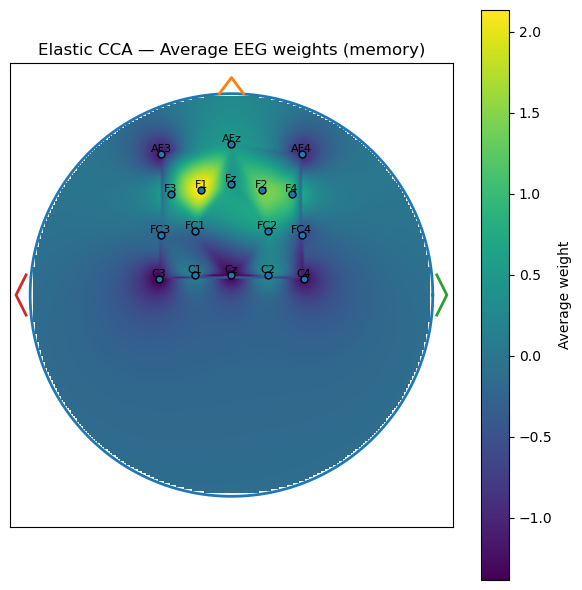

In [23]:
import csv
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

# Try to use SciPy's griddata for smooth interpolation; fallback to IDW if unavailable.
try:
    from scipy.interpolate import griddata
    _HAS_SCIPY = True
except Exception:
    _HAS_SCIPY = False

# --- Configuration ---
CSV_PATH = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\CCAReg\elastic_weights2\avg_eeg_weights_mem.csv")
OUT_PATH = CSV_PATH.with_name("avg_eeg_weights_mem_topomap.png")

# Approximate 10–20 2D coordinates on a unit head (front = +y, left = -x)
# These are schematic positions good enough for qualitative topomaps.
POS = {
    "AFz": (0.0,  0.75),
    "AF3": (-0.35, 0.70),
    "AF4": ( 0.35, 0.70),

    "Fz":  (0.0,  0.55),
    "F1":  (-0.15, 0.52),
    "F2":  ( 0.15, 0.52),
    "F3":  (-0.30, 0.50),
    "F4":  ( 0.30, 0.50),

    "FC1": (-0.18, 0.32),
    "FC2": ( 0.18, 0.32),
    "FC3": (-0.35, 0.30),
    "FC4": ( 0.35, 0.30),

    "Cz":  (0.0,  0.10),
    "C1":  (-0.18, 0.10),
    "C2":  ( 0.18, 0.10),
    "C3":  (-0.36, 0.08),
    "C4":  ( 0.36, 0.08),

    # (Add more labels here if present in your CSVs)
}

# --- Load CSV (expects columns: channel, weight) ---
names, vals = [], []
with open(CSV_PATH, newline="", encoding="utf-8") as f:
    reader = csv.DictReader(f)
    weight_col = "mean"

    # read rows
    for row in reader:
        ch = (row.get("channel")).strip()
        if not ch:
            continue
        try:
            w = float(row.get(weight_col))
        except Exception:
            # row might have original casing; try more robustly
            w = float(row[[k for k in row if k.lower() == weight_col][0]])
        if ch in POS:
            names.append(ch)
            vals.append(w)

if not names:
    raise RuntimeError("No channels from the CSV matched the known scalp positions in POS. "
                       "Add the missing labels to POS.")

xy = np.array([POS[ch] for ch in names])
z = np.array(vals, dtype=float)

mu = z.mean()
sd = z.std(ddof=0)
if sd == 0:
    z = np.zeros_like(z)  # all equal -> all zeros after standardization
else:
    z = (z - mu) / sd

# --- Build grid on the unit head circle ---
N = 200
grid_x = np.linspace(-1.0, 1.0, N)
grid_y = np.linspace(-1.0, 1.0, N)
GX, GY = np.meshgrid(grid_x, grid_y)
mask = (GX**2 + GY**2) <= 1.0  # inside head

# --- Interpolate to grid ---
def idw_interpolate(points, values, gx, gy, power=2.0, eps=1e-12):
    """Inverse-distance weighting as a fallback (no SciPy)."""
    px = points[:, 0][:, None, None]
    py = points[:, 1][:, None, None]
    dx = gx[None, :, :] - px
    dy = gy[None, :, :] - py
    d2 = dx*dx + dy*dy
    w = 1.0 / (d2 + eps)**(power/2)
    num = (w * values[:, None, None]).sum(axis=0)
    den = w.sum(axis=0)
    return num / (den + eps)

if _HAS_SCIPY:
    GZ = griddata(xy, z, (GX, GY), method="cubic")
    # fill NaNs (outside convex hull) via IDW to avoid holes at edges
    nan_mask = np.isnan(GZ)
    if nan_mask.any():
        GZ_idw = idw_interpolate(xy, z, GX, GY, power=2.0)
        GZ[nan_mask] = GZ_idw[nan_mask]
else:
    GZ = idw_interpolate(xy, z, GX, GY, power=2.0)

# mask outside head
GZ_masked = np.ma.array(GZ, mask=~mask)

# --- Plot ---
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(
    GZ_masked,
    origin="lower",
    extent=(-1, 1, -1, 1),
    interpolation="bilinear",
)
# head outline
theta = np.linspace(0, 2*np.pi, 400)
ax.plot(np.cos(theta), np.sin(theta), linewidth=2)

# simple nose
nose_x = np.array([ -0.06, 0.0, 0.06 ])
nose_y = np.array([  1.00, 1.08, 1.00 ])
ax.plot(nose_x, nose_y, linewidth=2)

# ears
ear_x = np.array([1.02, 1.07, 1.02])
ear_y = np.array([ 0.10, 0.00, -0.10])
ax.plot( ear_x,  ear_y, linewidth=2)
ax.plot(-ear_x,  ear_y, linewidth=2)

# electrodes as dots
ex, ey = xy[:, 0], xy[:, 1]
ax.scatter(ex, ey, s=25, edgecolors="k")
for ch, (cx, cy) in POS.items():
    if ch in names:
        ax.text(cx, cy, ch, ha="center", va="bottom", fontsize=8)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Average weight")

ax.set_aspect("equal")
ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.15, 1.15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Elastic CCA — Average EEG weights (memory)")

fig.tight_layout()
fig.savefig(OUT_PATH, dpi=200)
print(f"Saved scalp map to: {OUT_PATH}")
plt.show()


## TRIALS and DIGITS corelation for memory

In [25]:
# ---------- HELPERS --------------------------------------------
import matplotlib.pyplot as plt
def find_weight_file(subj: int,
                     base_dir: Path = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\weights_Reg_slow")
                     ) -> Path:
    """
    Find the CSV for given condition ('ctrl' or 'mem') for the chosen subject.
    If lag_ms is provided, match exactly. Otherwise, take any that matches.
    """
    subj_str = f"{subj:03d}"
    subj_glob = f"sub-{subj_str}_eeg_weights_mem_*.csv"
    candidates = list((base_dir).glob(subj_glob))
    if not candidates:
        return None
    if len(candidates) > 1:
        return None  # ambiguous
    return candidates[0]

def load_weights(subj: int):
    csv_path = find_weight_file(subj)
    if csv_path is None or not csv_path.exists():
        return None, None
    df = pd.read_csv(csv_path)
    ch_names = df['channel'].tolist()
    weights  = df['weight'].to_numpy()
    return ch_names, weights

In [31]:
DIG_LEN = 200
data = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_Reg_slow.csv")
best_shift_by_sub = data.groupby("subject")["lag_ms"].agg(lambda x: x.value_counts().index[0]).to_dict()
rows_trials = []
all_rows = []

for subj in SUBJECTS:
    best_shift = best_shift_by_sub.get(subj, 0) // 10  # convert ms to samples
    trials_memory, _ = split_trials_by_condition(load_all_trials(subj))
    win = slice(WIN_OFFSET1, -WIN_OFFSET2)
    channels_w,  weights  = load_weights(subj)
    if channels_w is None or weights is None:
        print(f"Missing or ambiguous weights for subject {subj:03d}, skipping subject.")
        continue
    
    for eeg_s, pupil_s, meta in iterate_trials(trials_memory, best_shift, win):
        n_digits = meta['load']
        for d in range(n_digits):
            w = slice(d*DIG_LEN, (d+1)*DIG_LEN)
            cv_eeg = np.dot(eeg_s, weights)
            cv_pupil = pupil_s.ravel()

        for d in range(n_digits):
            w = slice(d * DIG_LEN, (d + 1) * DIG_LEN)
            x, y = cv_eeg[w], cv_pupil[w]
            
            if x.size == 0 or y.size == 0:
                print("Empty slice:", meta['subject'], meta['epoch'], d)
                continue

            if not np.isfinite(x).all() or not np.isfinite(y).all():
                print("Non-finite values:", meta['subject'], meta['epoch'], d, "→", np.sum(~np.isfinite(x)), "bad in X;", np.sum(~np.isfinite(y)), "bad in Y")
                continue

            if np.std(x) == 0 or np.std(y) == 0:
                print("Const window:", meta['subject'], meta['epoch'], d, np.std(x), np.std(y))
                continue

            r = np.corrcoef(x, y)[0, 1]
            rows_trials.append({
                'subject': meta['subject'],
                'condition': meta['condition'],
                'load': meta['load'],
                'epoch': meta['epoch'],
                'lag_ms': best_shift * 10,  # convert samples to ms
                'digit_pos': d + 1,  # 1-based digit index
                'r': float(r),  # convert to plain float for JSON-ability
            })

        meta['r'] = float(np.corrcoef(cv_eeg, cv_pupil)[0,1])
        meta['lag_ms'] = best_shift *10
        all_rows.append(meta)

df_sameW = pd.DataFrame(rows_trials)
grand = (df_sameW.query("condition == 'memory'")
           .groupby(['load','digit_pos'])['r']
           .agg(['mean','sem'])
           .reset_index())

for L in [5,9,13]:
    sub = grand[grand.load == L]
    plt.errorbar(sub.digit_pos, sub['mean'],
                 yerr=sub['sem'], label=f"{L} digits")
plt.axhline(0, c='k', lw=.5)
plt.xlabel("Digit position in the sequence")
plt.ylabel("CCA correlation (mean ± SEM)")
plt.legend(); plt.tight_layout()

pd.DataFrame(all_rows).to_csv("trial_level_ccaReg_slow.csv", index=False)
print("Finished - saved per-trial correlations with plain CCA.")

Missing or ambiguous weights for subject 035, skipping subject.


ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

In [27]:
# keep only MEMORY trials and clip r to avoid ±∞ after Fisher-z
df_mem_sameW = (df_sameW.query("condition == 'memory'")
            .assign(z = lambda d: np.arctanh(
                d.r.clip(lower=-0.999_999, upper=0.999_999))))

loads   = sorted(df_mem_sameW.load.unique())      # [5, 9, 13]
digits  = sorted(df_mem_sameW.digit_pos.unique()) # 1 … 13
offset  = 0.25                              # separates the three loads a bit


In [28]:
import statsmodels.formula.api as smf
import statsmodels.stats.anova as sm_anova

for L in loads:
    wide = (df_mem_sameW.query("load == @L")
                   .pivot_table(index="subject",
                                columns="digit_pos",
                                values="r",
                                aggfunc="mean")
                   .dropna())          # subject must have every digit

    long = wide.reset_index().melt(id_vars='subject',
                                   var_name='digit_pos',
                                   value_name='r')

    model = smf.ols("r ~ C(digit_pos) + C(subject)", data=long).fit()
    anova = sm_anova.anova_lm(model, typ=2)
    print(f"\n=== Load {L} digits ===")
    print(anova.loc["C(digit_pos)"])

    df_num = int(anova.loc["C(digit_pos)", "df"])   # k‑1
    df_den = int(anova.loc["Residual",     "df"])   # (k‑1)*(s‑1)

    Fval   = anova.loc["C(digit_pos)", "F"]
    pval   = anova.loc["C(digit_pos)", "PR(>F)"]

    print(f"F({df_num}, {df_den}) = {Fval:.2f},  p = {pval:.3g}")




=== Load 5 digits ===
sum_sq    0.189436
df        4.000000
F         1.470811
PR(>F)    0.220019
Name: C(digit_pos), dtype: float64
F(4, 72) = 1.47,  p = 0.22

=== Load 9 digits ===
sum_sq    0.280112
df        8.000000
F         1.235896
PR(>F)    0.282313
Name: C(digit_pos), dtype: float64
F(8, 144) = 1.24,  p = 0.282

=== Load 13 digits ===
sum_sq     0.437600
df        12.000000
F          0.998308
PR(>F)     0.451598
Name: C(digit_pos), dtype: float64
F(12, 216) = 1.00,  p = 0.452



=== First five trials (mean r per group) ===
digit_pos                 start    middle       end
subject epoch                                      
sub-033 trial_005.csv -0.023276 -0.271853 -0.493771
        trial_008.csv -0.510793  0.254945  0.317817
        trial_009.csv -0.573912  0.252306 -0.961698
        trial_011.csv -0.154792  0.318967  0.914077
        trial_023.csv -0.654966 -0.618271  0.199255


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\3389068286.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


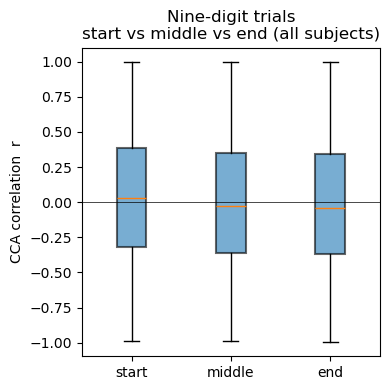


=== Repeated-measures ANOVA (within trials) ===
sum_sq    0.870612
df        2.000000
F         1.632547
PR(>F)    0.195803
Name: C(digit_pos), dtype: float64


In [29]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
import statsmodels.stats.anova as sm_anova
import matplotlib.pyplot as plt

###############################################################################
# 1) Select the nine-digit memory trials only
###############################################################################
df9 = (df_sameW
       .query("condition == 'memory' and load == 9")
       .copy())

###############################################################################
# 2) Compute start / middle / end means *within every trial*  ---------------
#    First pivot so each row is one trial and each column a digit position
###############################################################################
wide = (df9
        .pivot_table(index=['subject', 'epoch'],   # one row = one trial
                     columns='digit_pos',
                     values='r',
                     aggfunc='mean'))

# drop trials that are missing any of the nine digit-windows
wide = wide.dropna()

# three group means per trial
wide['start']  = wide[[1, 2, 3]].mean(axis=1)
wide['middle'] = wide[[4, 5, 6]].mean(axis=1)
wide['end']    = wide[[7, 8, 9]].mean(axis=1)

###############################################################################
# 3) Inspect the per-trial numbers (optional) ---------------------------------
###############################################################################
print("\n=== First five trials (mean r per group) ===")
print(wide[['start', 'middle', 'end']].head())

###############################################################################
# 4) Plot the distribution across *all* trials --------------------------------
###############################################################################
plt.figure(figsize=(4, 4))
plt.boxplot(
    [wide['start'], wide['middle'], wide['end']],
    labels=['start', 'middle', 'end'],
    showfliers=False, patch_artist=True, boxprops=dict(alpha=0.6, lw=1.5)
)
plt.ylabel("CCA correlation  r")
plt.title("Nine-digit trials\nstart vs middle vs end (all subjects)")
plt.axhline(0, color='k', lw=.5)
plt.tight_layout()
plt.show()

###############################################################################
# 5) Repeated-measures ANOVA: start vs middle vs end  ------------------------
###############################################################################
# reshape to long form: one row = one trial-group value
long = wide[['start', 'middle', 'end']].stack().reset_index()
long = long.rename(columns={'level_2': 'group', 0: 'r'})

# add a numeric subject ID column for statsmodels
long['sub'] = long['subject'].astype('category').cat.codes

# rm-ANOVA with subject as random factor
model = smf.ols("r ~ C(digit_pos) + C(sub)", data=long).fit()
anova = sm_anova.anova_lm(model, typ=2)
print("\n=== Repeated-measures ANOVA (within trials) ===")
print(anova.loc["C(digit_pos)"])


In [30]:
from scipy.stats import ttest_rel, t
import numpy as np

start  = wide['start']
middle = wide['middle']
end    = wide['end']

# Calculate differences
diff_sm = middle - start
diff_me = end - middle
diff_se = end - start

# Perform t-tests
t_sm, p_sm = ttest_rel(start, middle, nan_policy='omit', alternative='less')
t_me, p_me = ttest_rel(middle, end,  nan_policy='omit', alternative='less')
t_se, p_se = ttest_rel(start, end,  nan_policy='omit', alternative='less')

# Calculate confidence intervals (95%)
def calculate_ci(diff):
    mean_diff = diff.mean()
    se_diff = diff.std(ddof=1) / np.sqrt(len(diff))
    df9 = len(diff) - 1
    ci_lower, ci_upper = t.interval(0.95, df9, loc=mean_diff, scale=se_diff)
    return mean_diff, ci_lower, ci_upper

mean_sm, ci_lower_sm, ci_upper_sm = calculate_ci(diff_sm)
mean_me, ci_lower_me, ci_upper_me = calculate_ci(diff_me)
mean_se, ci_lower_se, ci_upper_se = calculate_ci(diff_se)

print(f"middle vs start : t = {t_sm:.2f},  p = {p_sm:.3g}")
print(f"                  mean diff = {mean_sm:.3f}, 95% CI [{ci_lower_sm:.3f}, {ci_upper_sm:.3f}]")
print()
print(f"middle vs end   : t = {t_me:.2f},  p = {p_me:.3g}")
print(f"                  mean diff = {mean_me:.3f}, 95% CI [{ci_lower_me:.3f}, {ci_upper_me:.3f}]")
print()
print(f"start vs end    : t = {t_se:.2f},  p = {p_se:.3g}")
print(f"                  mean diff = {mean_se:.3f}, 95% CI [{ci_lower_se:.3f}, {ci_upper_se:.3f}]")


middle vs start : t = 1.49,  p = 0.931
                  mean diff = -0.049, 95% CI [-0.114, 0.016]

middle vs end   : t = 0.20,  p = 0.58
                  mean diff = -0.006, 95% CI [-0.069, 0.056]

start vs end    : t = 1.61,  p = 0.946
                  mean diff = -0.055, 95% CI [-0.123, 0.012]


## TIME SERIES

In [40]:
# 1. Load the file
corr_sub = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_Reg_slow.csv")

# 2. Sort rows by the “r” column (descending) and keep the 10 largest
top10 = corr_sub.sort_values("r", ascending=False).head(10)

# 3. Do whatever you need with those lines
print(top10)   

# 1. Load the file
corr_sub = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\trial_level_ccaReg_slow.csv")

# 2. Sort rows by the “r” column (descending) and keep the 10 largest
top10 = corr_sub.sort_values("r", ascending=False).head(10)

# 3. Do whatever you need with those lines
print(top10)   

    subject condition  lag_ms  alpha_x         r  p-value
26       49    memory    1000   0.0010  0.309843      0.0
30       51    memory    1000   0.0010  0.296189      0.0
13       41   control    -500   0.0001  0.284696      0.0
8        39    memory    -600   0.0010  0.226579      0.0
22       47    memory   -1000   0.0010  0.225053      0.0
32       52    memory    1000   0.0001  0.221458      0.0
2        34    memory    1000   0.0003  0.197361      0.0
10       40    memory    1000   0.0010  0.157212      0.0
12       41    memory    -500   0.0001  0.134026      0.0
14       42    memory   -1000   0.0010  0.103245      0.0
      subject condition  load          epoch         r  lag_ms
3     sub-033    memory     5  trial_013.csv  0.983772    1000
770   sub-044    memory     5  trial_060.csv  0.971750    1000
664   sub-043    memory     5  trial_003.csv  0.969710   -1000
1015  sub-049    memory     5  trial_025.csv  0.969101    1000
672   sub-043    memory     5  trial_039.csv  0

In [33]:
data = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_Reg_slow.csv")
best_shift_by_sub = data.groupby("subject")["lag_ms"].agg(lambda x: x.value_counts().index[0]).to_dict()

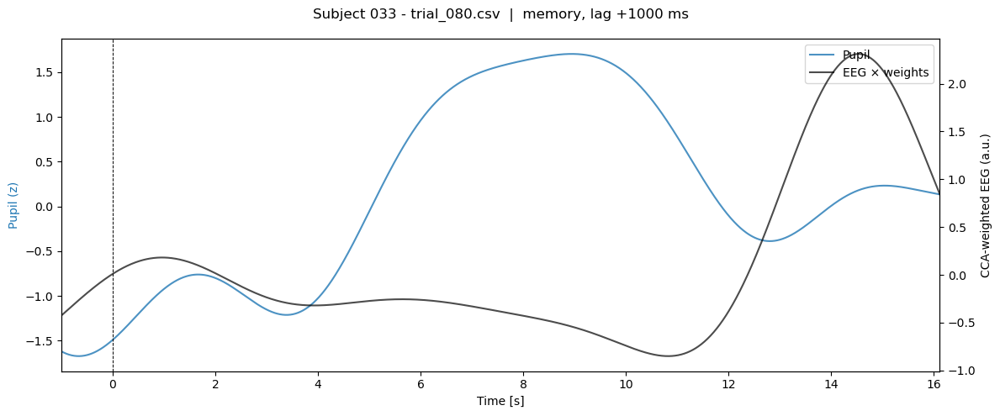

In [56]:

# ---------------------------------------------------------------------
# plotting one trial with the CCA-weighted EEG
# ---------------------------------------------------------------------
plot_sub      = 33
plot_trial    = "trial_080.csv"
condition     = "memory"          # or "control"
lag_samples   = best_shift_by_sub.get(plot_sub, 0) // 10  # your 100 Hz lag
lag_ms        = lag_samples * 10                   # for the file name

# -- load the trial ---------------------------------------------------
for eeg, pupil, meta in load_all_trials(plot_sub):
    if meta["epoch"] == plot_trial:
        break
else:
    raise ValueError(f"{plot_trial} not found for subject {plot_sub}")

# -- load weights & build weight vector --------------------------------
ch_names, weights   = load_weights(plot_sub)

if ch_names is None or weights is None:
    print(f"Missing or ambiguous weights for subject {plot_sub:03d}, cannot plot.")
if ch_names != FRONTAL_MIDLINE:
    print(f"Warning: channel names in weights do not match expected frontal midline set.")

# -- project EEG and (optionally) roll for lag -------------------------
eeg_w = np.dot(eeg, weights)

if lag_samples:
    eeg_w = np.roll(eeg_w, lag_samples)[win]

# -- prep pupil --------------------------------------------------------
pupil_vec = pupil.ravel()[win]                    # (T,)

# -- trim to common length --------------------------------------------
T = min(len(eeg_w), len(pupil_vec))
#eeg_w, pupil_vec = eeg_w[:T], pupil_vec[:T]
t = np.arange(T) / 100.0 -1.0                       # s @100 Hz

# -- plot --------------------------------------------------------------
fig, ax1 = plt.subplots(figsize=(12, 5))
ax2      = ax1.twinx()

ax1.plot(t, pupil_vec,  color="#1f77b4", alpha=.8, label="Pupil")
ax2.plot(t, eeg_w,      color="black", alpha=.7, label="EEG × weights")

ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Pupil (z)",                      color="#1f77b4")
ax2.set_ylabel("CCA-weighted EEG (a.u.)",        color="black")

ax1.set_xlim(-1, t[-100])
ax2.set_xlim(-1, t[-100])

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1+lines2, labels1+labels2, loc="upper right")

ax1.axvline(0, ls="--", c="k", lw=.7)
fig.suptitle(f"Subject {plot_sub:03d} - {plot_trial}  |  "
             f"{condition}, lag {lag_ms:+d} ms")
fig.tight_layout()
plt.show()


In [71]:
import numpy as np
import matplotlib.pyplot as plt

PLOTS_DIR = Path(r"C:\Users\cdd\OneDrive - Danmarks Tekniske Universitet\Spring2025\Special_course\plots_appC")
PLOTS_DIR.mkdir(parents=True, exist_ok=True)      # creates the folder tree if it doesn't exist

def trial_average2(sub_id, trials, load, cond, lag_samples=0, channels=FRONTAL_MIDLINE):
    """
    Return average pupil (T,) and EEG (T,) for a given load.
    * trials      - list of (eeg, pupil, meta) tuples
    * load        - 5 / 9 / 13
    * lag_samples - positive = shift EEG *forward* relative to pupil
    """
    eeg_list, pupil_list = [], []

    ch_names, weights   = load_weights(plot_sub)

    if ch_names is None or weights is None:
        print(f"Missing or ambiguous weights for subject {plot_sub:03d}, cannot plot.")
    if ch_names != FRONTAL_MIDLINE:
        print(f"Warning: channel names in weights do not match expected frontal midline set.")


    for eeg, pupil, meta in trials:
        if meta["load"] != load:
            continue

        # -- project EEG and (optionally) roll for lag -------------------------
        eeg_roi = np.dot(eeg, weights)
        
        # temporal alignment ---------------------------------------------------
        if lag_samples != 0:
           eeg_roi = np.roll(eeg_roi, lag_samples)

        T = min(len(eeg_roi), len(pupil))
        eeg_list.append(eeg_roi[win])
        pupil_list.append(pupil[win, 0])

    # stack, crop to shortest, compute mean ± SEM
    if not eeg_list:                      # no trials for this load
        return None

    L = min(map(len, eeg_list))
    eeg_mat   = np.stack([e[:L] for e in eeg_list])
    pupil_mat = np.stack([p[:L] for p in pupil_list])

    eeg_avg   = eeg_mat.mean(axis=0)
    eeg_sem   = eeg_mat.std(axis=0, ddof=1) / np.sqrt(eeg_mat.shape[0])
    pupil_avg = pupil_mat.mean(axis=0)
    pupil_sem = pupil_mat.std(axis=0, ddof=1) / np.sqrt(pupil_mat.shape[0])

    t = np.arange(L) / 100.0 -1.0             # 100 Hz → seconds
    return t, (eeg_avg, eeg_sem), (pupil_avg, pupil_sem)

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------------ #
# ❶  Load the subject-level CCA table *once* at module import time
# ------------------------------------------------------------------ #
CCA_FILE = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_Reg_slow.csv")
CCA_DF   = pd.read_csv(CCA_FILE)        # columns: subject, condition, lag_ms, r, p-value
CCA_DF["condition"] = CCA_DF["condition"].str.lower()   # normalise to lowercase
CCA_DF.set_index(["subject", "condition"], inplace=True)

# ------------------------------------------------------------------ #
def plot_subject2(sub_id: int, loads=(5, 9, 13)):
    """
    One figure with 3 (rows = load) × 2 (cols = task) panels.
    Each panel overlays pupil and EEG-θ for a single load and task,
    and the panel title now includes the subject-specific CCA 'r'.
    """
    trials = load_all_trials(sub_id)
    mem, ctl = split_trials_by_condition(trials)

    lag       = best_shift_by_sub.get(sub_id, 0)  // 10          # samples @100 Hz
    colors    = {5: "#1f77b4", 9: "#ff7f0e", 13: "#2ca02c"}
    task_sets = [(mem, "memory"), (ctl, "control")]

    # ── look up the two r values for this subject ──────────────────
    r_memory  = float(CCA_DF.loc[(sub_id, "memory"), "r"])   if (sub_id, "memory")  in CCA_DF.index else float("nan")
    r_control = float(CCA_DF.loc[(sub_id, "control"), "r"])  if (sub_id, "control") in CCA_DF.index else float("nan")
    r_by_cond = {"memory": r_memory, "control": r_control}

    # ── make subplot grid (no shared x) ───────────────────────────
    fig, axes = plt.subplots(len(loads), 2, figsize=(12, 9), sharey="row")
    legend_handles, legend_labels = [], []

    for row, load in enumerate(loads):
        for col, (trial_set, cond) in enumerate(task_sets):
            ax = axes[row, col]

            res = trial_average2(sub_id, trial_set, load, cond, lag_samples=lag)
            if res is None:            # no data → hide the axis
                print(f"Subject {sub_id:02d} has no trials for load {load} ({cond})")
                ax.set_visible(False)
                continue

            t, (eeg_avg, eeg_sem), (pup_avg, pup_sem) = res
            # ─────────── z-score each series ──────────────────────────
            # (mean-remove, divide by SD; adjust SEM by the same SD)
            p_mean, p_std = pup_avg.mean(), pup_avg.std(ddof=0)
            e_mean, e_std = eeg_avg.mean(), eeg_avg.std(ddof=0)

            pup_avg = (pup_avg - p_mean) / p_std
            pup_sem = pup_sem / p_std

            eeg_avg = (eeg_avg - e_mean) / e_std
            eeg_sem = eeg_sem / e_std


            # pupil ────────────────────────────────────────────────
            ax.plot(t, pup_avg, color=colors[load], label="Pupil")
            ax.fill_between(t, pup_avg - pup_sem, pup_avg + pup_sem, color=colors[load], alpha=.25)

            # EEG θ ────────────────────────────────────────────────
            ax_r = ax.twinx()
            ax_r.plot(t, eeg_avg, color="black", lw=1.2, label="θ")
            ax_r.fill_between(t, eeg_avg - eeg_sem, eeg_avg + eeg_sem, color="black", alpha=.15)

            # cosmetics ───────────────────────────────────────────
            ax.set_xlim(-1, t[-100])
            ax.set_yticks([]); ax_r.set_yticks([])
            ax.axvline(0, ls="--", c="k", lw=.7)

            if col == 0:
                ax.set_ylabel(f"Load {load:02d}")
            if row == 0:
                # add r to title
                r_val = r_by_cond[cond]
                ax.set_title(f"{cond.capitalize()}  (r = {r_val:.3f})")

            if not legend_handles:
                legend_handles += ax.get_lines() + ax_r.get_lines()
                legend_labels  += [h.get_label() for h in legend_handles]

    axes[0, 0].legend(legend_handles, legend_labels,
                      loc="upper right", frameon=False)

    fig.suptitle(f"Subject {sub_id:03d}   |   lag = {lag/100:.2f} s")
    fig.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()
    # ── SAVE the figure ───────────────────────────────────────────
    # ── SAVE instead of show ────────────────────────────────────────
    fname = PLOTS_DIR / f"s{sub_id:02d}.png"      #  e.g.  s05.png
    fig.savefig(fname, dpi=300, bbox_inches="tight")
    plt.close(fig)    


C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


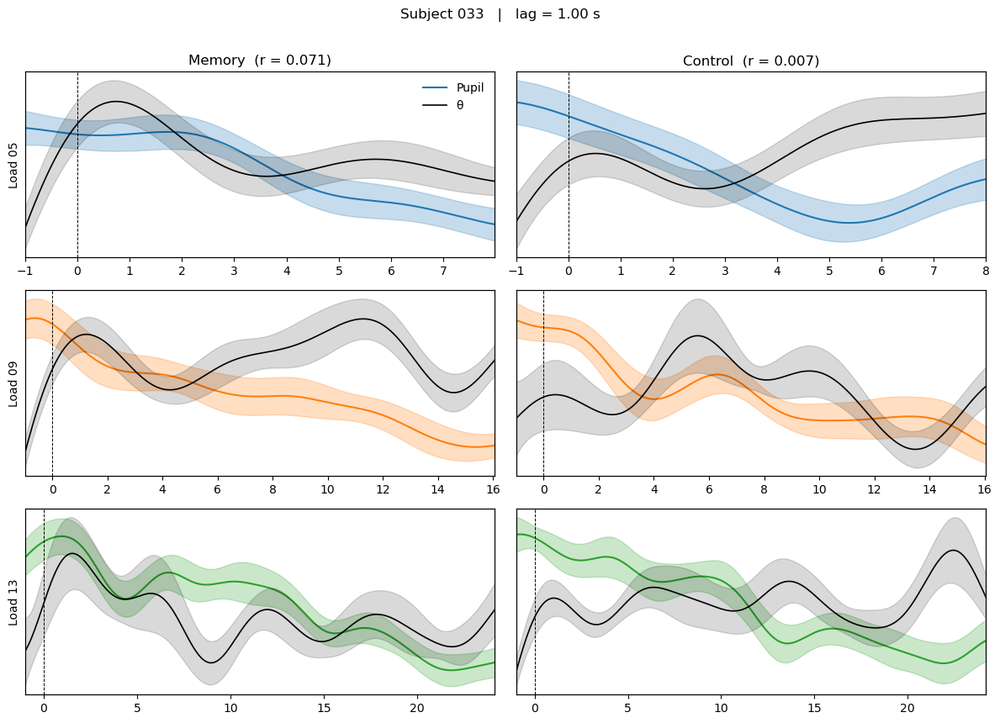

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


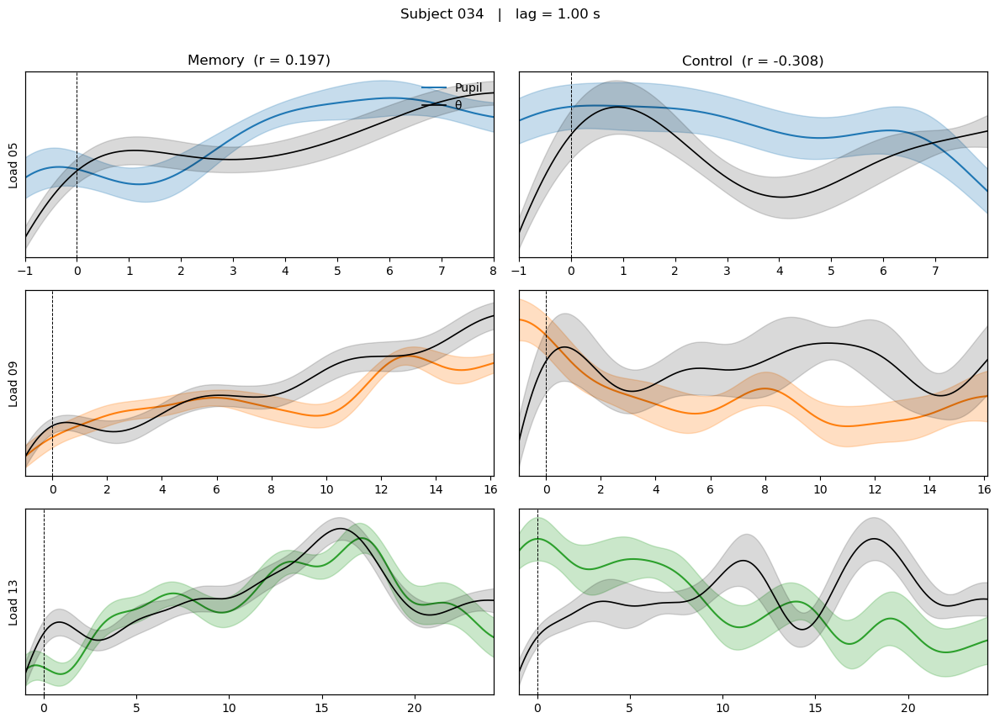

c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


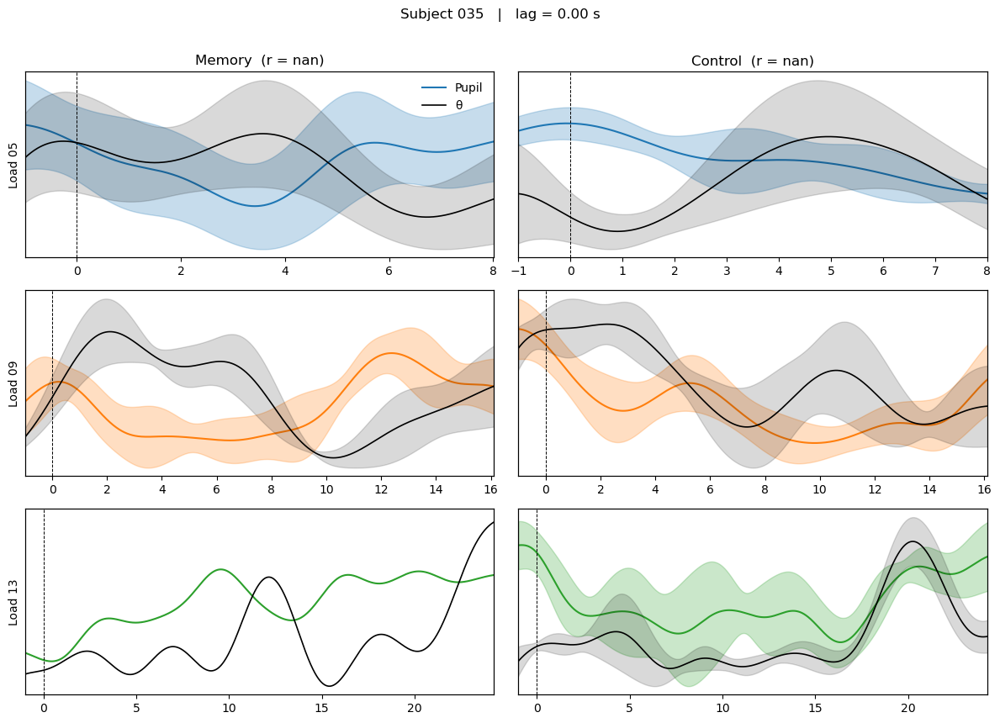

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


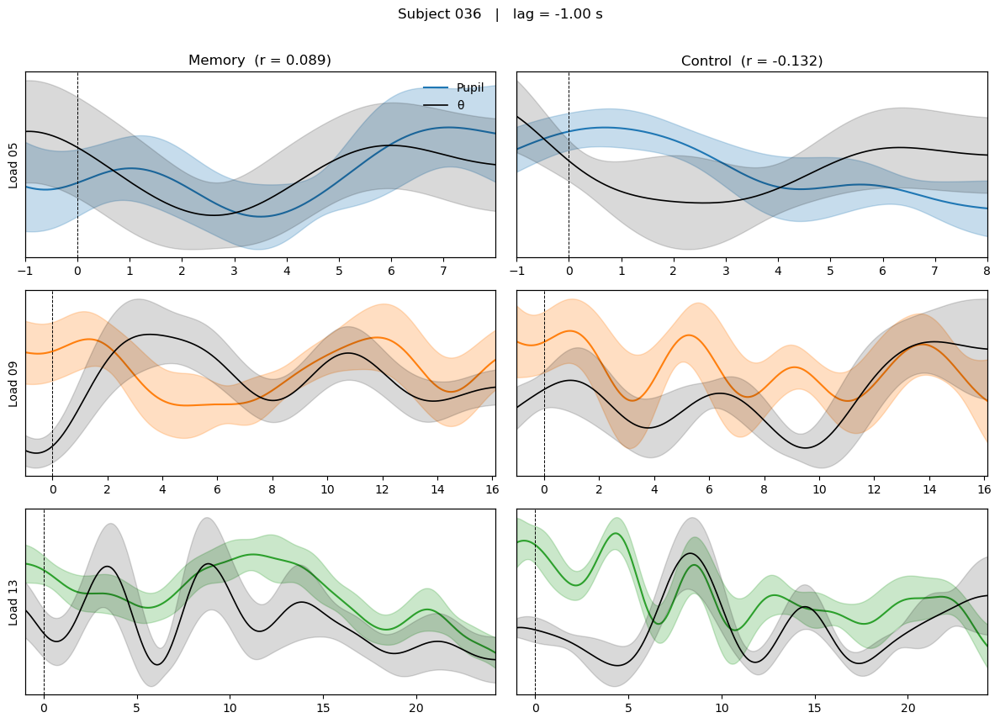

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


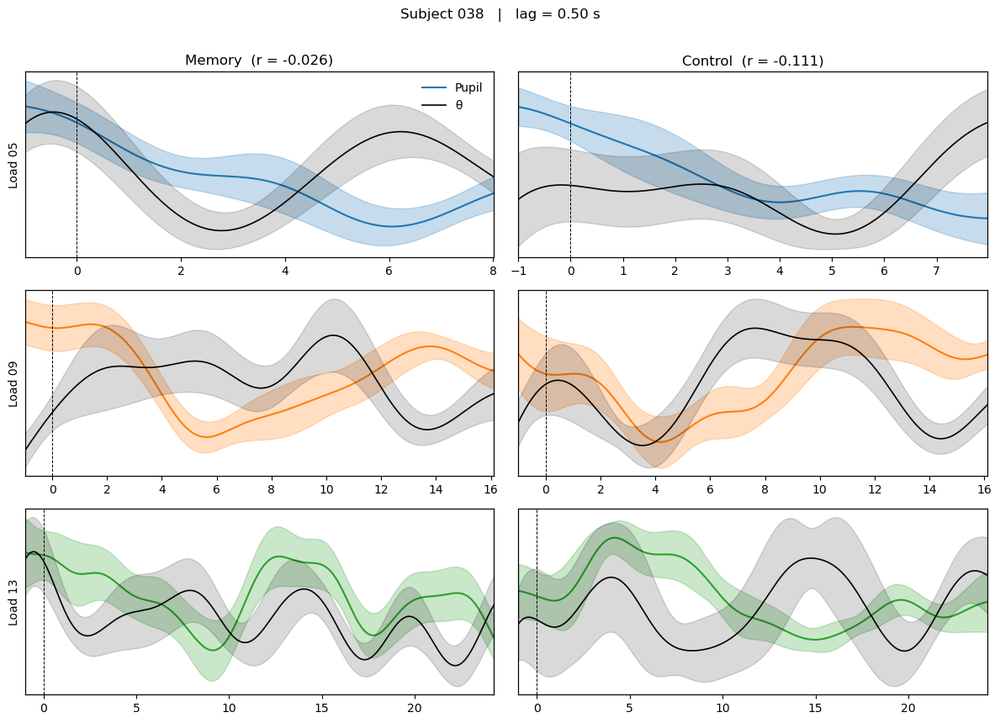

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


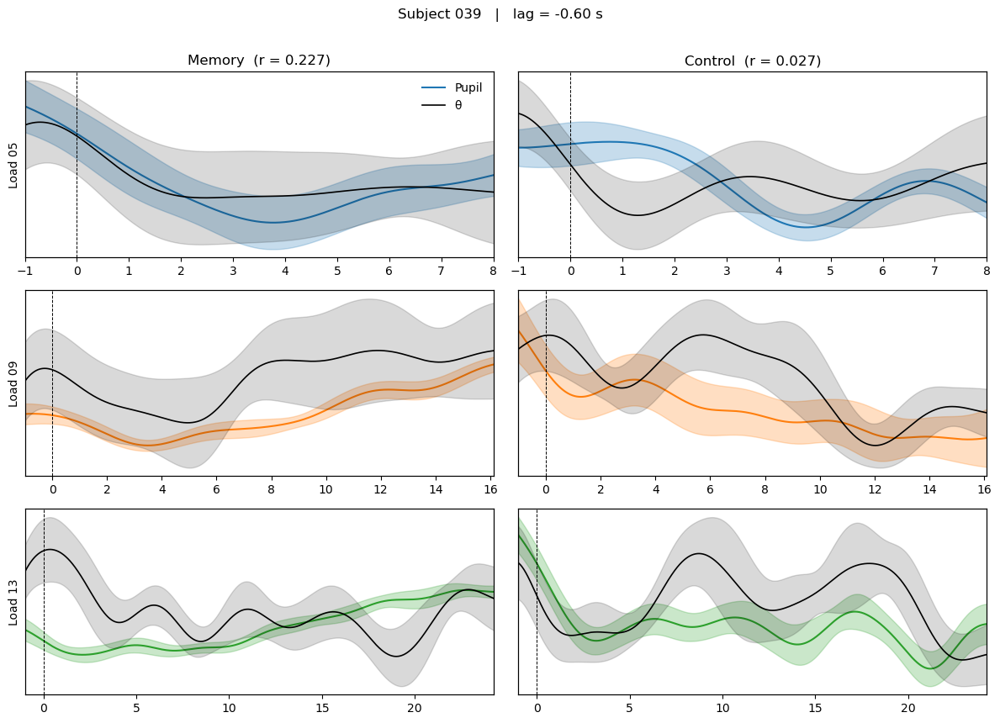

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


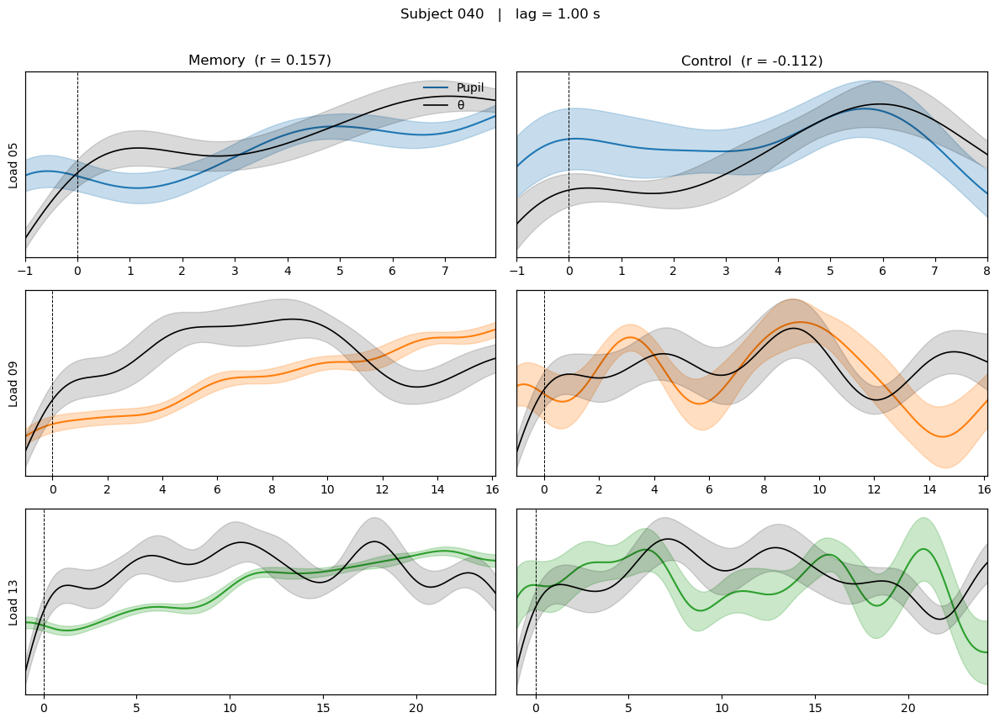

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


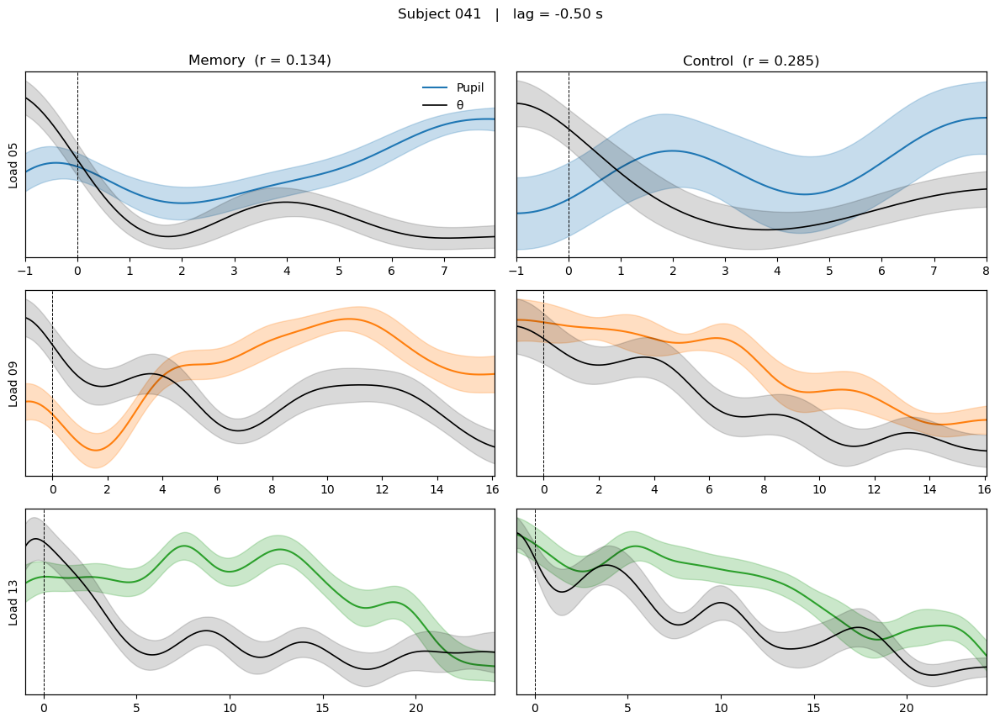

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


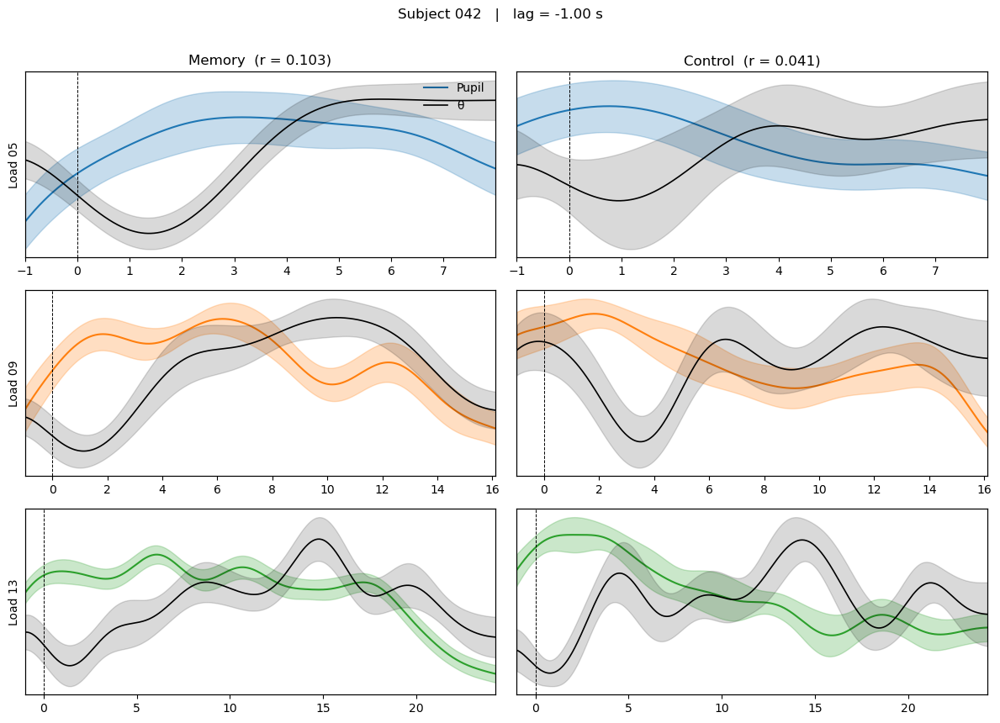

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


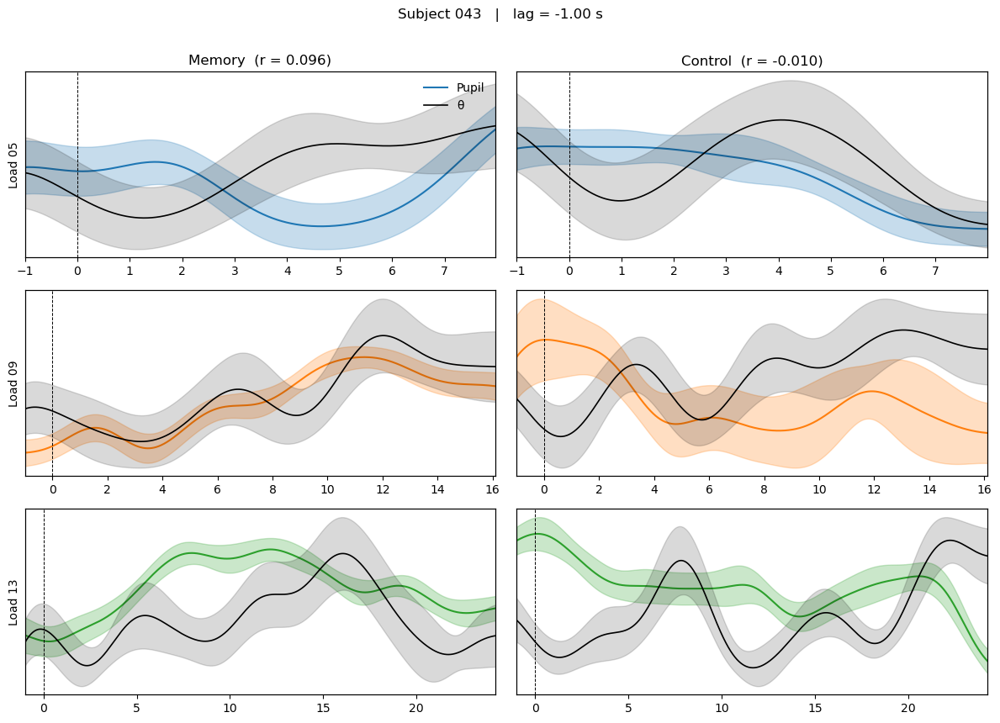

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


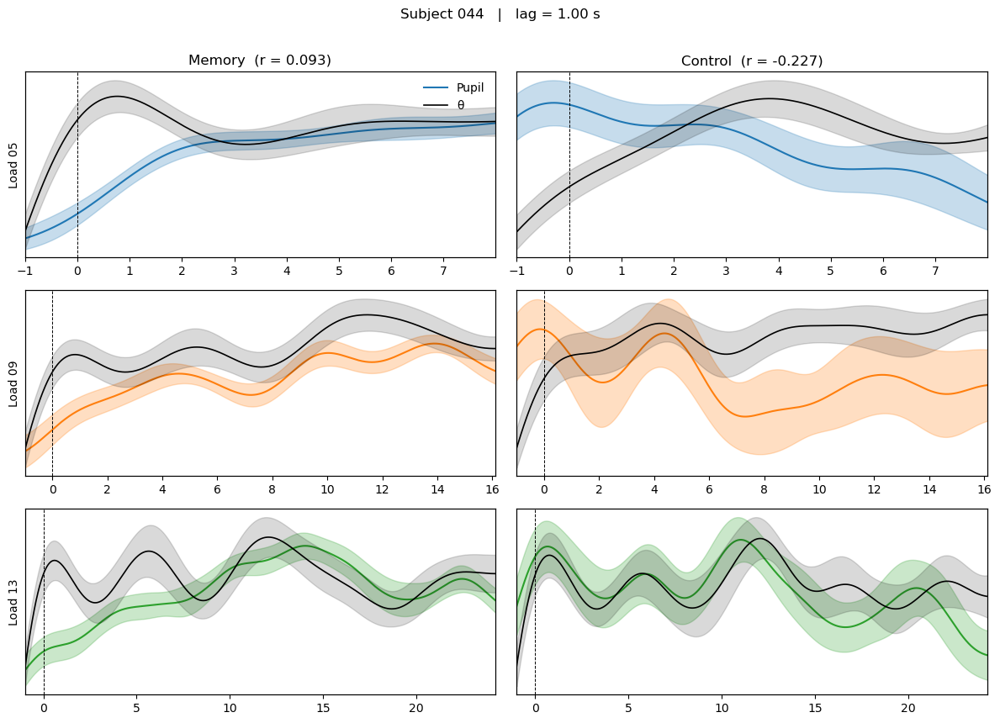

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


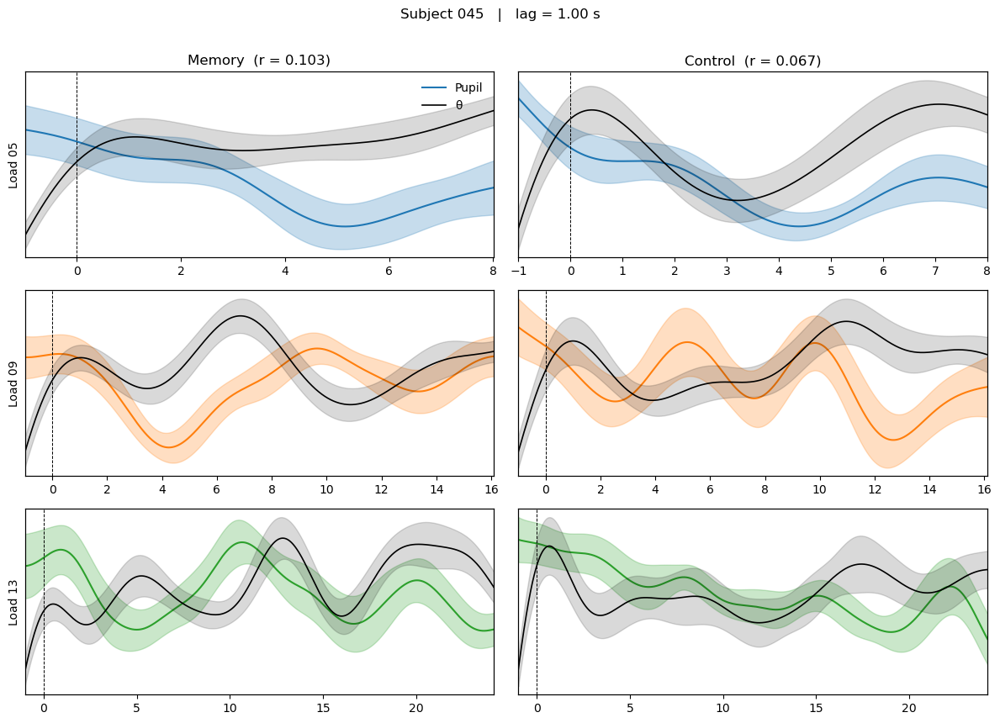

c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


Subject 46 has no trials for load 9 (memory)


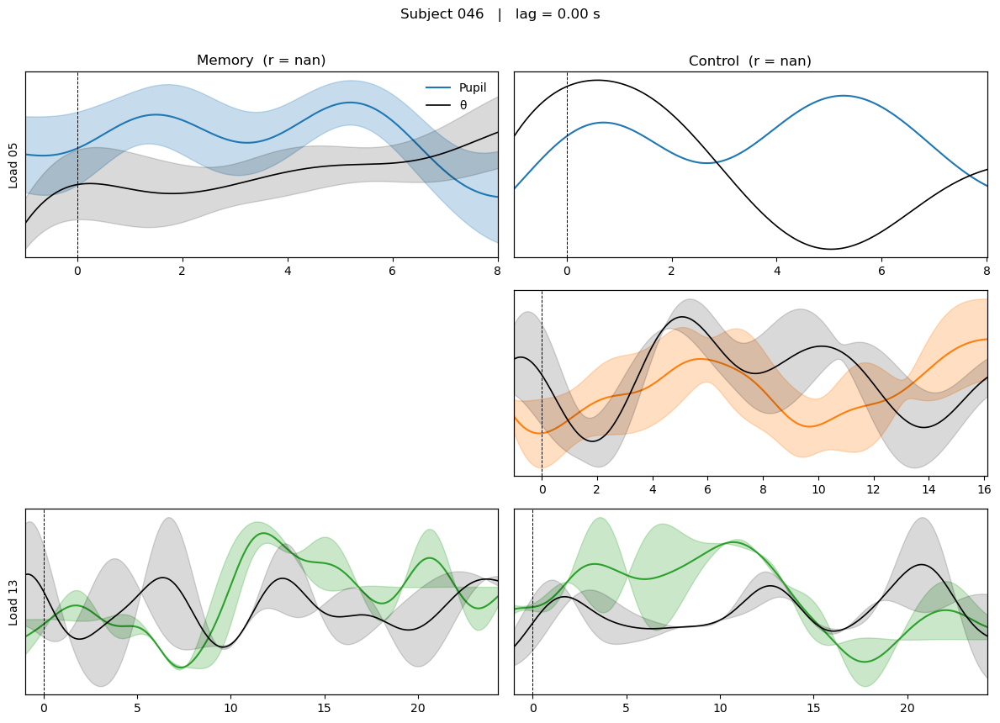

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


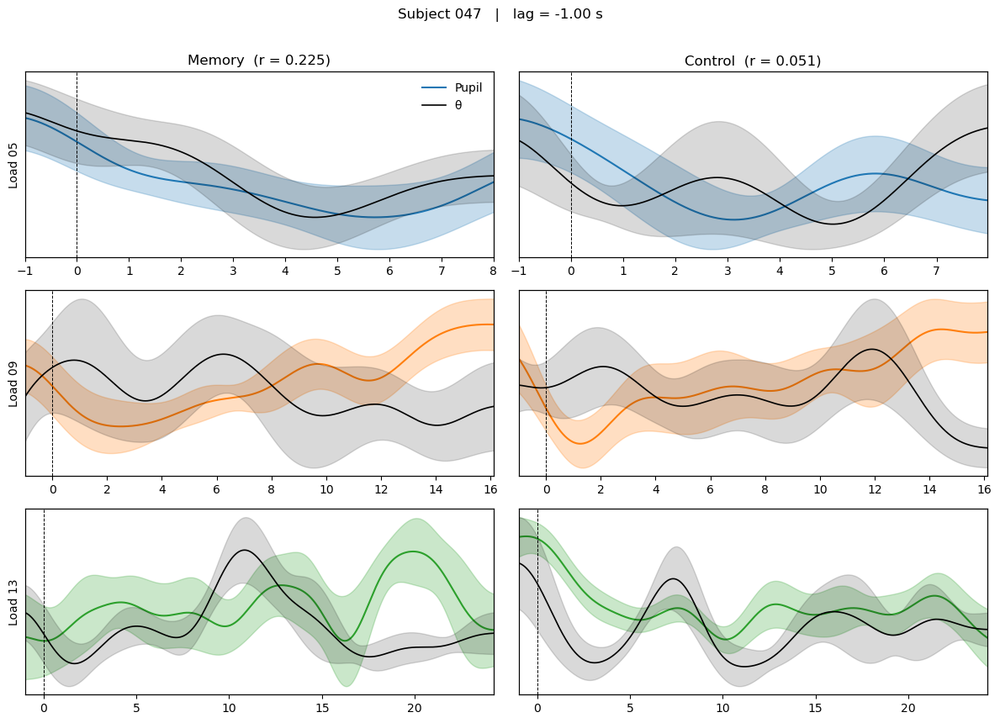

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


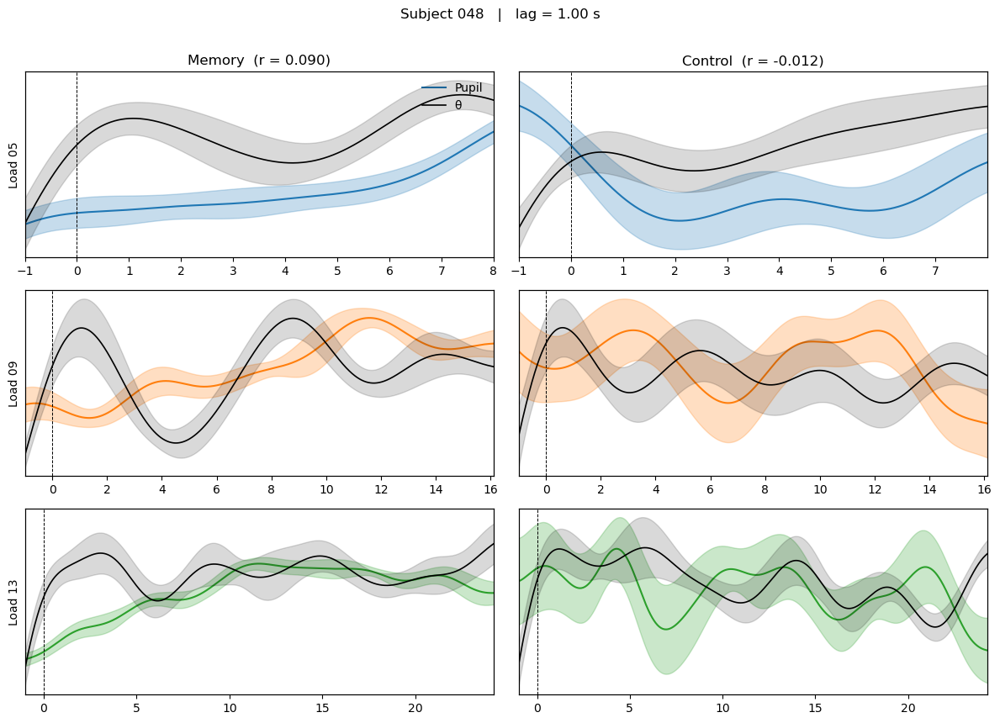

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


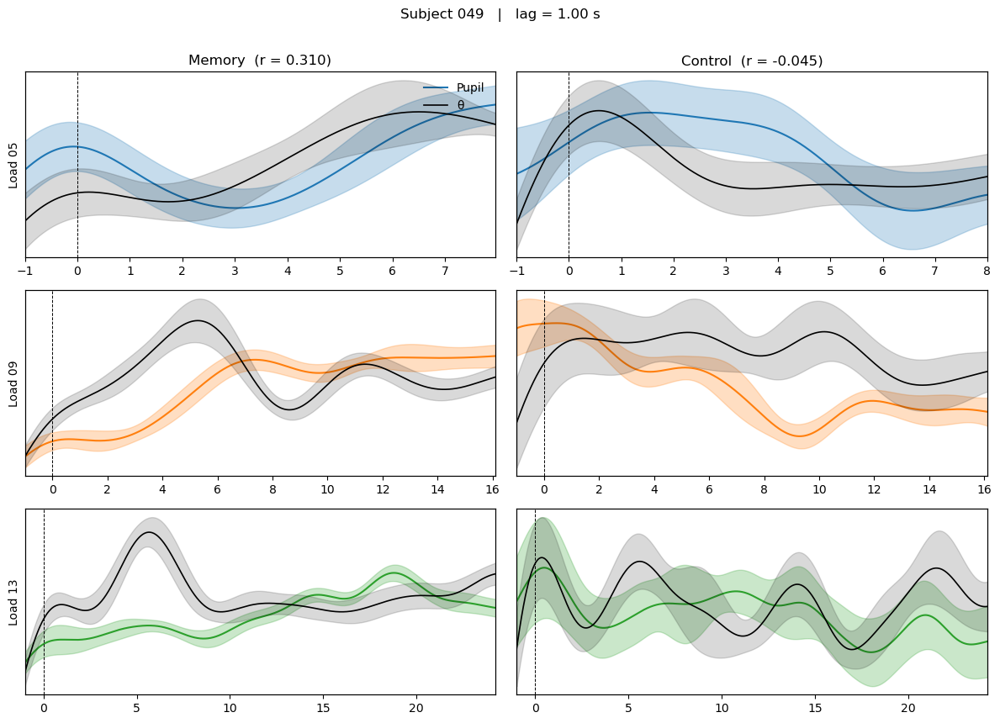

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


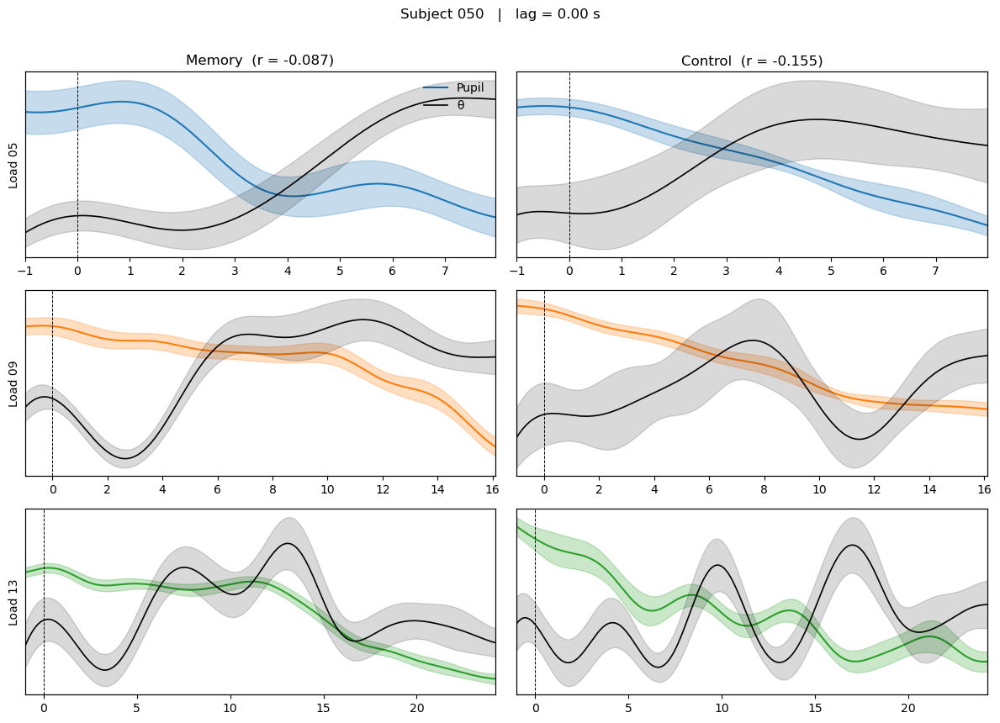

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


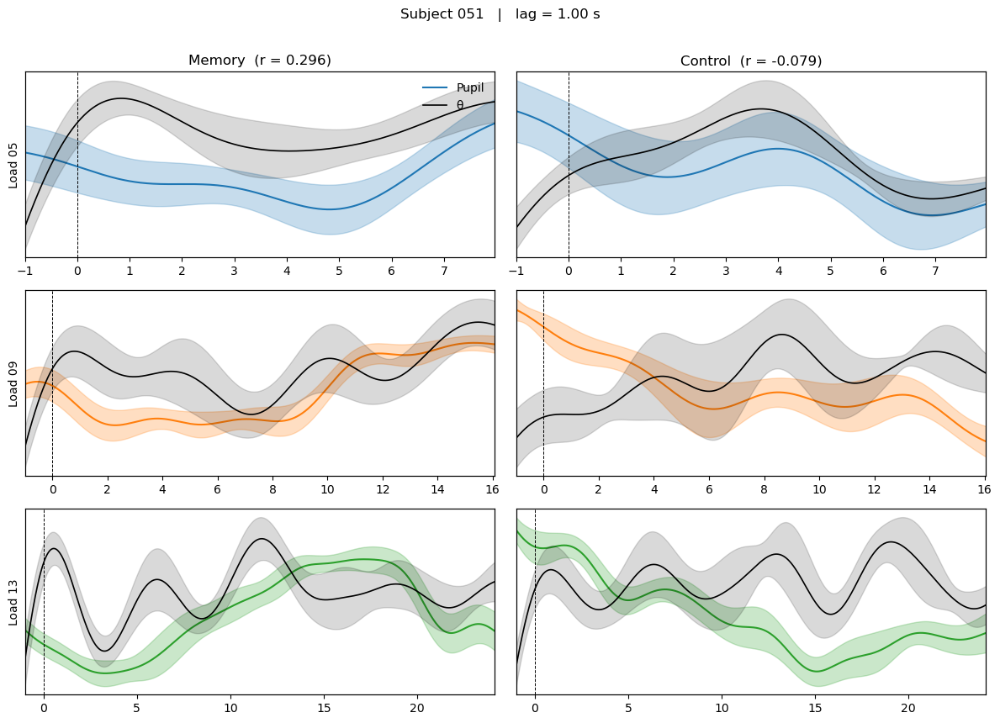

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


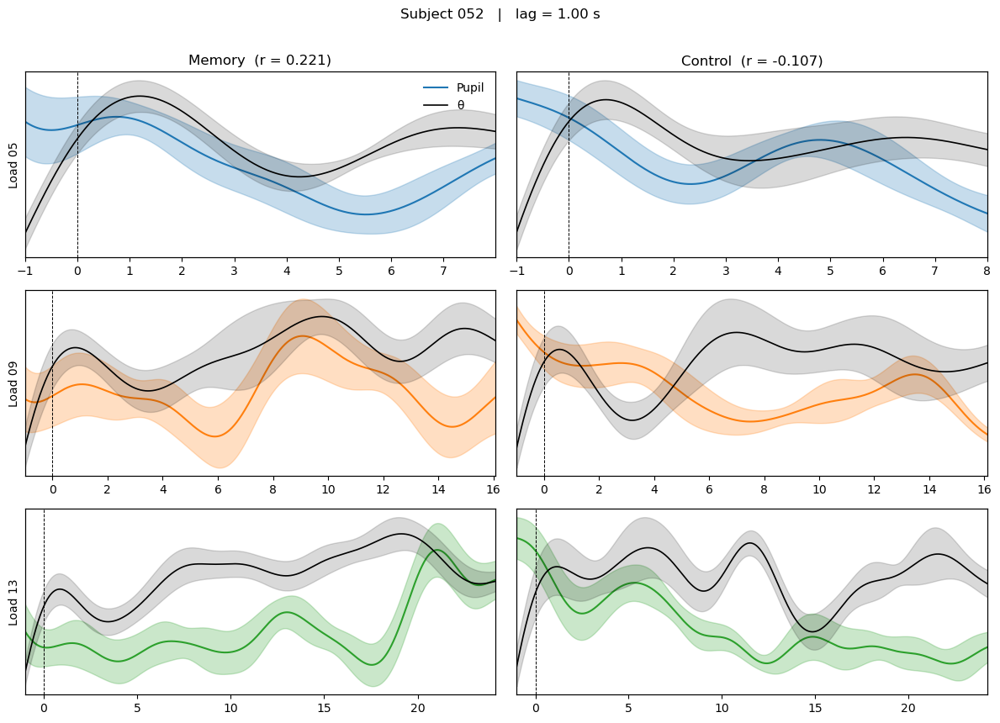

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


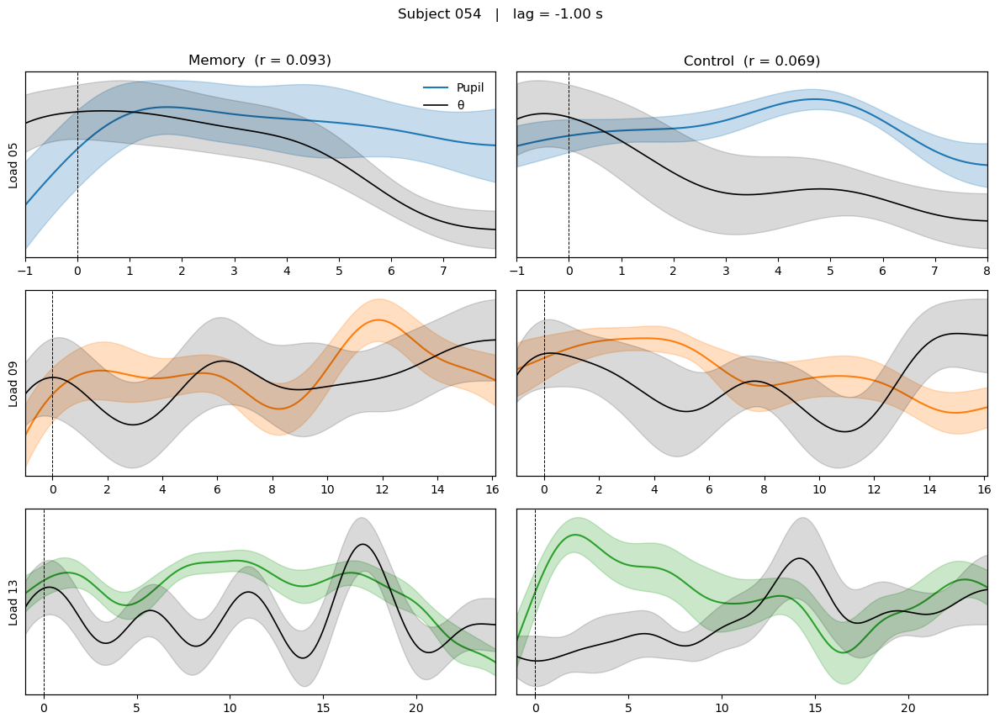

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


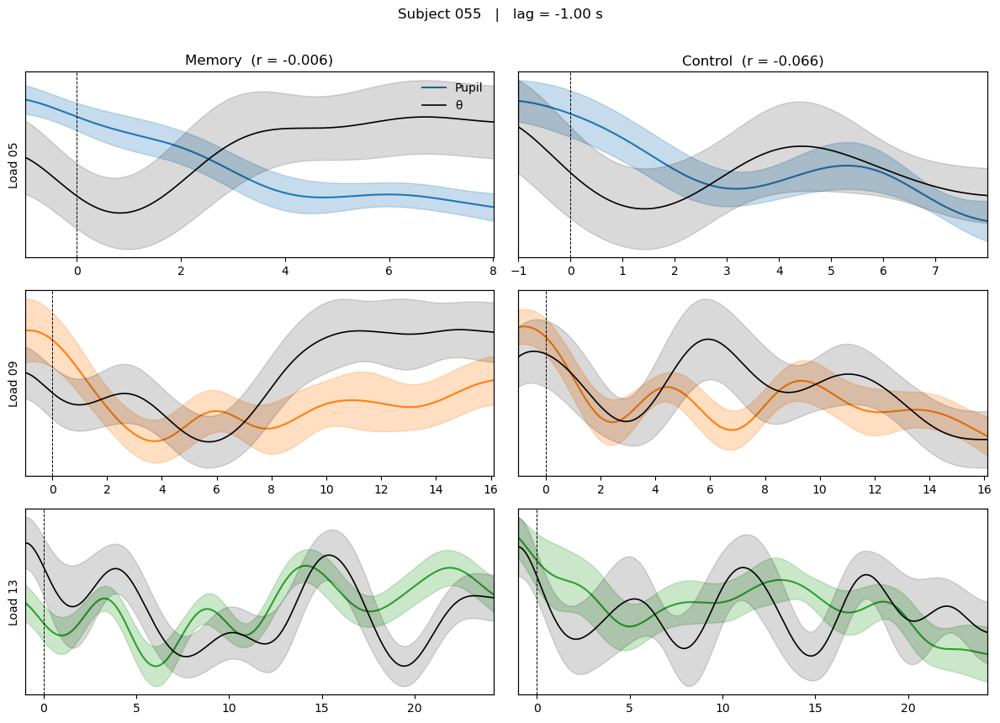

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


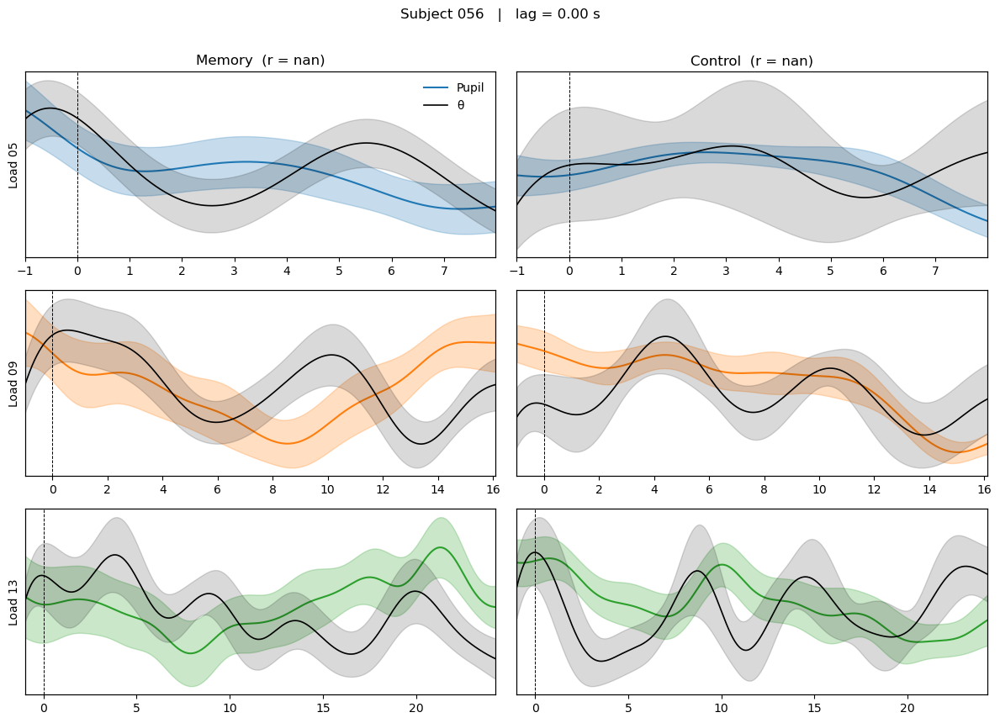

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


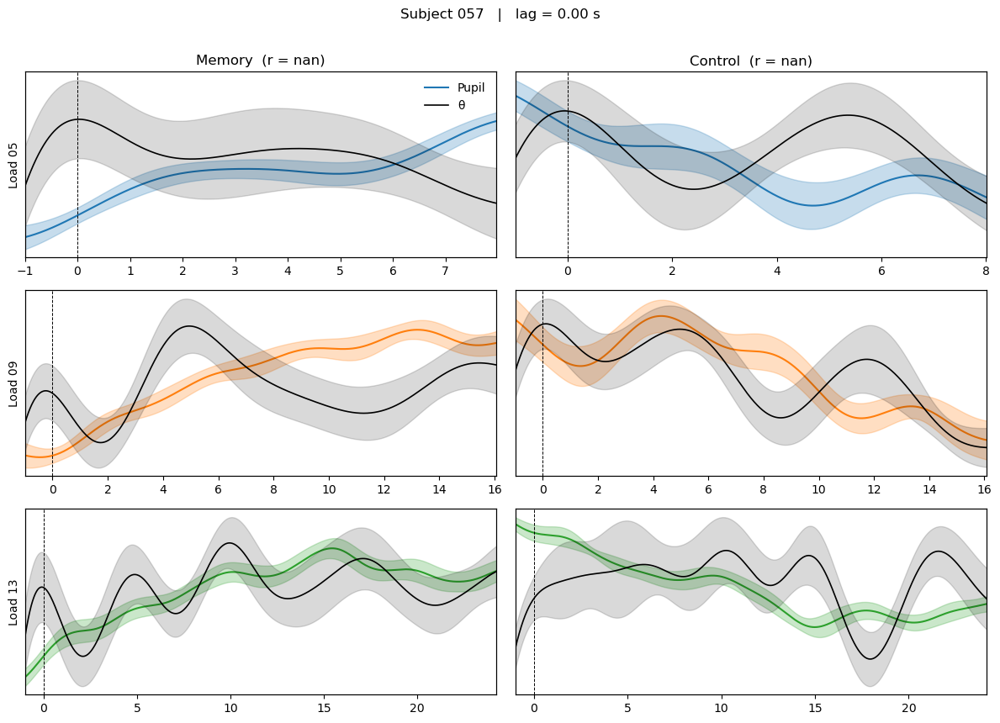

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


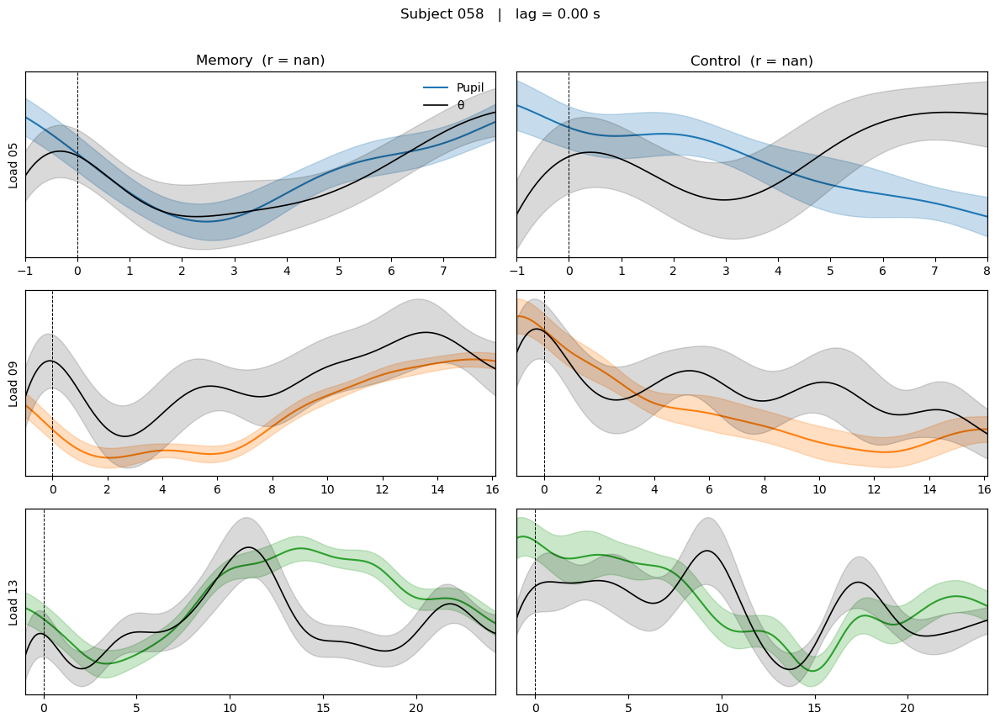

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


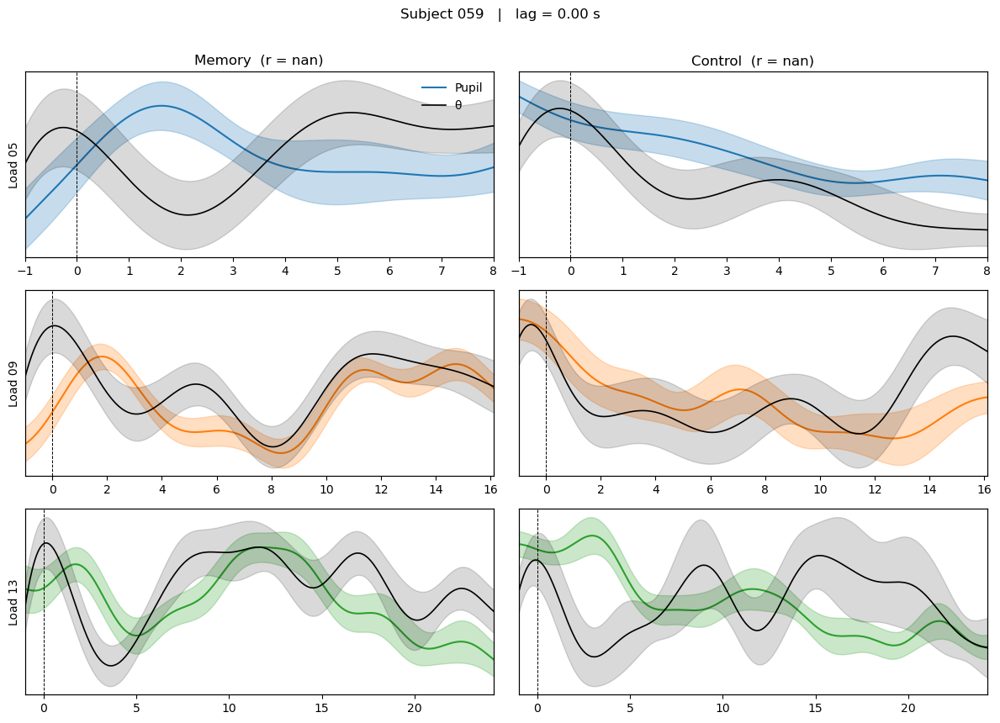

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


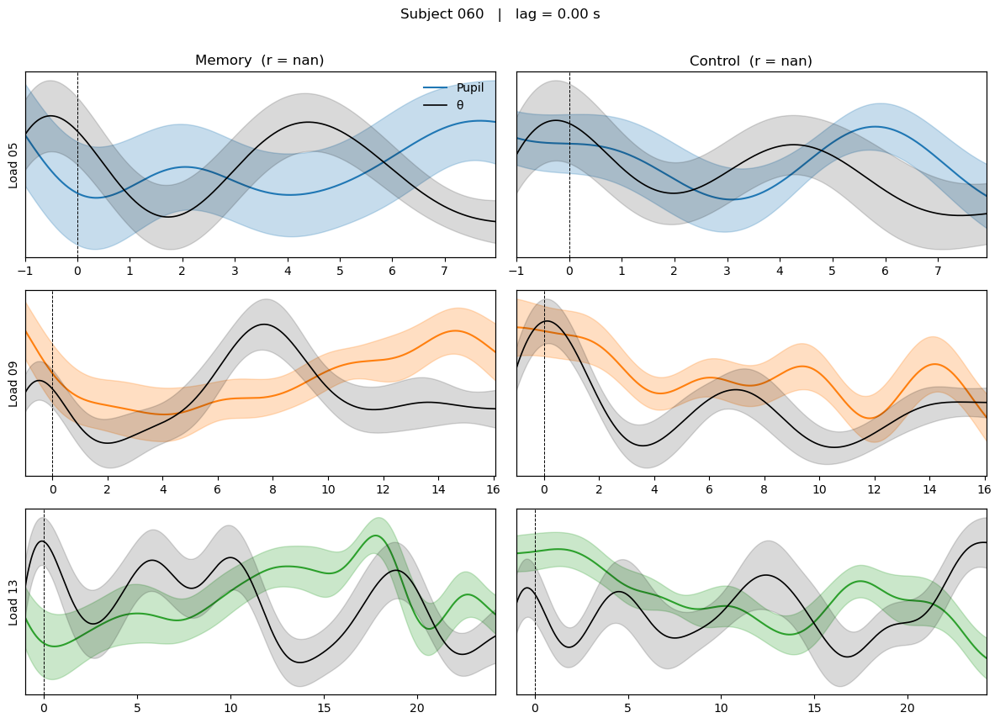

C:\Users\cdd\AppData\Local\Temp\ipykernel_25072\229199623.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


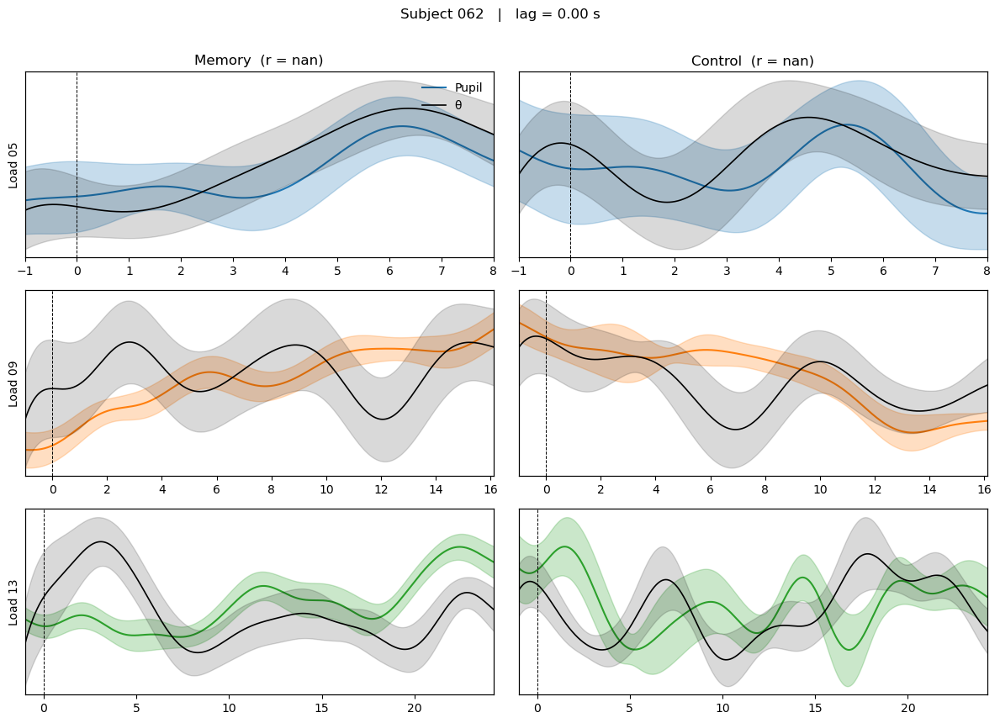

In [72]:
for subj in SUBJECTS:   # or any custom list
    plot_subject2(subj)